last updated 11 03 24

This notebook is to get the run times for each model on the highest and lowest resolutions; to estimate an average run time.IG DICITONARY!



In [1]:
#!pip install ipython

In [2]:
# imports
import torch
import torch.nn as nn
from torchvision.models import vgg16
import torch.optim.lr_scheduler as lr_scheduler
import torch.optim as optim
from sklearn.model_selection import train_test_split
import numpy as np
import cv2

from functions import import_imagedata, ImageProcessor, label_oh_tf, IDSWDataSetLoader2
from fns4wandb import  set_lossfn
from architectures import sevennet, smallnet1, smallnet2, smallnet3
from loop_fns import loop
from plotting import learning_curve, accuracy_curve, plot_confusion

from datetime import date
from tqdm import tqdm
import pprint
import collections
from IPython.display import clear_output
import time

import csv
import json
import pickle
import os

import wandb

In [3]:
# file paths
_save_location = r'/its/home/nn268/antvis/antvis/optics/res_big_loop_saves/models/batch/2c2l/'

data_path = r'/its/home/nn268/antvis/antvis/optics/AugmentedDS_IDSW/'

gitHASH = ''

In [4]:
wandb.login()

wandb: Currently logged in as: naughticalnonsence (antvis). Use `wandb login --relogin` to force relogin


True

In [5]:
#!pip install datetime

d = date.today()
#print(str(d), type(str(d)))

452 144               5/452 *100 = 1%
226 72                5/226 *100 = 2%
113 36                5/113 *100 = 4% -- 2/113 *100= 1.7% ~ 2%
57  18   (56.5,)      5/57 *100  = 8% -- 2/57 *100 = 3.5% ~ 4%.   1/57 = 1.75%
29   9   (28.5,)      5/29 *100  = 17% -- 2/29 *100 = 6.89 ~ 7%   1/28 = 3.57 ~ 4%
15   5   (14.5, 4.5)
8    3   (7.5,2.5)
4,   2   (, 1.5)

In [6]:
   

pp = pprint.PrettyPrinter(indent=4)

def save2csv_nest_dict(nested_dict, file_name, save_location:str):
  # flattern nested dictionary
  flatterend_dict = {}
  for k,v in nested_dict.items():
    if isinstance(v, dict):
      for nested_key, nested_val in v.items():
        flatterend_dict[f"{k}_{nested_key}"] = nested_val
    else:
      flatterend_dict[k] =v

  columns = list(flatterend_dict.keys())

  with open(save_location+str(file_name)+'.csv', "a+", newline="") as f:
      # using dictwriter
      writer = csv.DictWriter(f, fieldnames=columns)
      # using writeheader function
      if f.tell() == 0:
        writer.writeheader()
      writer.writerow(flatterend_dict)
      f.close()

# check dictionary values for json and csv

def check_obj4np(obj):
    if isinstance(obj, dict):
        return {key: check_obj4np(value) for key, value in obj.items()}
    if isinstance(obj,list):
        return [check_obj4np(item) for item in obj]
    if isinstance(obj,np.ndarray):
        return obj.tolist()
    if isinstance(obj, torch.Tensor):
        return obj.tolist()
    else:
        return obj

# save to json
def save2josn_nested_dict(nested_dict, file_name, save_location:str):
    nested_dict = check_obj4np(nested_dict)
    json_obj = json.dumps(nested_dict, indent=4)
    with open(save_location+str(file_name)+'.json', 'a+') as f:
        f.write(json_obj)
        f.close()

    
#save_location+str(file_name)+'.csv'
def save2csv(nested_dict, file_name, save_location:str):
    
    nested_dict = check_obj4np(nested_dict)
    
    columns = list(nested_dict.keys())
    path = os.path.join(save_location, file_name +".csv")
    try:
        with open(path, "a", newline="") as f:
            writer = csv.DictWriter(f, fieldnames=columns)
            # using dictwriter
            # using writeheader function
            if f.tell() == 0:
                writer.writeheader()
            writer.writerow(nested_dict)
            f.close()
    except IOError as e:
        print("I/O error({0}): {1}".format(e.errno, e.strerror))
    except ValueError:
              print("could not convert to string")
    except:
              print("unexpected error: ", sys.exc_info()[0])
        

def save2json(nested_dict, file_name, save_location:str):
    nested_dict = check_obj4np(nested_dict)
    #print(nested_dict)
    #print(nested_dict.items())
    json_obj = json.dumps(nested_dict, indent=4)
    #print(json_obj)
    path = os.path.join(save_location, file_name+".json")
    #print(path)
    with open(path, 'w') as f:
        f.write(json_obj)
        
        


def read_in_json(file_path, file_name):
    path = os.path.join(file_path, 'file_name')
    try:
        with open(path, 'r') as f:
            #obj = f.read()
            dj = json.load(f, object_pairs_hook= collections.OrderedDict) #obj, 
            #print(dj)
    except Exception as e:
        print("Error decoding Json")
        print(e)


class Flattern(nn.Module):
    def __init__(self):
        super(Flattern, self).__init__()
    def forward(self, x):
        #print(x.shape)
        x = x.flatten()
        return x


def choose_model(model_name, lin_lay, dropout):

    #for model_card in config.model_cards:
    #print('\n choose_model \n MODEL NAME: ',model_name)

    if model_name == '4c3l':
        return smallnet1(in_chan=3, f_lin_lay=int(lin_lay), l_lin_lay=11, ks= (3,5), dropout= dropout)
    elif model_name == '3c2l':
        return smallnet2(in_chan=3, f_lin_lay=int(lin_lay), l_lin_lay=11, ks = (3,5), dropout=dropout)
    elif model_name == '2c2l':
        return smallnet3(in_chan=3, f_lin_lay=int(lin_lay), l_lin_lay=11, ks= (3,5), dropout= dropout)
    elif model_name == '7c3l':
        return sevennet(in_chan=3, f_lin_lay=int(lin_lay), l_lin_lay=11, ks= (3,5), dropout= dropout)
    elif model_name == 'vgg16':
        model_vgg16 = vgg16(weights="IMAGENET1K_V1")
        vgg_feats = model_vgg16.features
        vgg_classifier = model_vgg16.classifier
        vgg_classifier.pop(6)

        vgg = nn.Sequential(
            vgg_feats,
            Flattern(),
            vgg_classifier,
            nn.Linear(4096,11),
            nn.Softmax(dim=0),
            )
        return vgg
    else:
        print('Model Name Not Recognised')


In [7]:
# dictionaries

date = date.today()

model_card_vgg = {'name': 'vgg', 'model': 'vgg16',
                  'f_lin_lay':[4096,
                             4096,
                             4096,
                             4096,
                             4096,
                             4096,
                             4096,
                            ],
                 'idx': 0,
                 'dropout':0.2}


model_card_7c3l = {'name': '7c3l', 'model': '7c3l', 'channels': 3, 'ks': (3,5),
                  'f_lin_lay':[248832,    # 452 144    # p5
                            59904,      # 226 72     # p5
                            11264,      # 113  36    # p2
                            1536,       # 57 18      # p1
                            172032,           # 29  9
                            172032,          # 15 5
                            172032,         # 8 3
                              ], 
                   'idx': 1,
                  'dropout':0.2}



model_card_4c3l = {'name': '4c3l', 'model': '4c3l', 'channels': 3, 'ks': (3,5),
                  'f_lin_lay':[539904,    # 452 144    # p5
                             141056,    # 226 72     # p5
                             304640,     # 113  36    # p2
                             9984,      # 57 18      # p1
                             2304,      # 29  9
                             512,       # 15 5
                             256],      # 8 3
                  'idx': 2,
                  'dropout':0.2}      

model_card_3c2l = {'name': '3c2l', 'model': '3c2l', 'channels': 3, 'ks': (3,5),
                  'f_lin_lay':[1069888,    # 452 144    # p5
                             274688,     #226 72      # p5
                             68096,      # 113  36    # p2
                             17280,      # 57 18      # p1
                             3840,       # 29  9
                             960,        # 15 5
                             256],
                  'idx': 3,
                  'dropout':0.2}       # 8 3

model_card_2c2l = {'name': '2c2l', 'model': '2c2l', 'channels': 3, 'ks': (3,5),
                  'f_lin_lay':[1055232,    # 452 144    # p5
                             267264,     #226 72      # p5
                             64512,      # 113  36    # p2
                             15552,      # 57 18      # p1
                             3072,       # 29  9
                             640,        # 15 5
                             128],
                  'idx': 4,
                  'dropout':0.1}       # 8 3

resolution_card_452144 = {'resolution':[452,144], 'padding':5, 'index':0}
resolution_card_22672 = {'resolution':[226,72], 'padding':5, 'index':1}
resolution_card_11336 = {'resolution':[113,36], 'padding':2, 'index':2}
resolution_card_5715 = {'resolution':[57,18], 'padding':1, 'index':3}

resolution_card_299 = {'resolution':[29,9], 'padding':0, 'index':4} # 
resolution_card_155 = {'resolution':[15,5], 'padding':0, 'index':5}
resolution_card_83 = {'resolution':[8,3], 'padding':0, 'index':6}



resolution_cards = [resolution_card_452144, resolution_card_22672, resolution_card_11336, resolution_card_5715,
                    resolution_card_299, resolution_card_155, resolution_card_83]
#resolution_cards = [resolution_card_11336]

#learning_rate_cards = [5e-5, 6e-5, 8e-5]
#learning_rate_cards =  [8.21592E-05, 6.62E-05, 6.01E-05, 5.97E-05]
learning_rate_cards=  [0.0001, 6e-5, 7e-5, 8e-5]
#wd_cards = [4e-5, 5e-5, 3.00E-05, 2.00E-05]
wd_cards =[0]
scheduler_cards = [0, 0.1, 0.2]

seeds = [8,2,3] # 4, 5,6

#model_cards =[model_card_vgg, model_card_7c3l, model_card_4c3l, model_card_3c2l, model_card_2c2l]
model_cards =[model_card_2c2l]

loss_fn_cards = ['CrossEntropy'] #'MSE', 
                        
config = dict({'parameters': 'parameters for big loop run'})
config.update({'model_cards':model_cards})
config.update({'resolution_cards':resolution_cards})
config.update({'learning_rate_cards':learning_rate_cards})
config.update({'wd_cards':wd_cards})
config.update({'scheduler_cards':scheduler_cards})
config.update({'seeds':seeds})
config.update({'loss_fn_cards': loss_fn_cards})


#print(model_card_vgg)
#print('')
#pp.pprint(config) # dictionary of dictionaries of lists and lists of dictionaries

In [8]:

def train_val(model, x_train, x_val, y_train, y_val, res, pad, save_dict, lr, loss_fn, epochs,optimizer, scheduler_value,model_name, av_lum): #train_dl, val_dl, 


    
    #optimizer = torch.optim.Adam(model.parameters(), lr=lr)#build_optimizer(mo
    #scheduler = lr_scheduler.ExponentialLR(optimizer, gamma=scheduler_value) 
    #scheduler'
    ####
    
    #model = model.to(device)
    model.train()
    
    
    #losses= []
    #predictions = []
    t_loss_list = []
    v_loss_list = []
    t_predict_list = []
    v_predict_list = []
    t_accuracy_list = []
    v_accuracy_list = []
    t_label_list = []
    v_label_list = []
    #labels = []

    
    total_epochs = 0
    for epoch in tqdm(range(epochs)):

        print('Training...')
    
        t_loss, train_prediction, t_correct, model, optimizer = loop(model=model, X=x_train, Y=y_train, loss_fn=loss_fn, device=device, 
                                                                     size= res,  pad=pad, num_classes=11, model_name= model_name, av_lum=av_lum,
                                                                     optimizer=optimizer) #,   scheduler =scheduler
        
        t_loss_list.append(t_loss)
        t_predict_list.append(train_prediction)
        wandb.log({'t_loss':t_loss})
        #wandb.log({'t_predict_list':train_prediction})
        #wandb.log({'train_labels':list(y_train)})
        train_acc = (t_correct/len(x_train)*100)
        print('train accuracy: ', train_acc )
        t_accuracy_list.append(train_acc)
        wandb.log({'train_acc':train_acc})
        #y_train_save = y_train.tolist()

        
        #clear_output()
        
            
        print('validating...')
        
        v_loss, val_prediction, val_correct= loop(model=model, X=x_val, Y=y_val, loss_fn=loss_fn, device=device,
                                                  size= res,  pad=pad, num_classes=11, model_name= model_name, 
                                                  av_lum=av_lum, train=False)
        #
        #scheduler.step()
        v_loss_list.append(v_loss)
        v_predict_list.append(val_prediction)
        wandb.log({'v_loss':v_loss})
        #wandb.log({'v_predict_list':val_prediction})
        #wandb.log({'y_val':list(y_val)})
        val_acc = (val_correct/len(x_val)*100)
        v_accuracy_list.append(val_acc)
        print('validation accuracy: ', val_acc )
        wandb.log({'val_acc':val_acc})

        #clear_output()
            
        total_epochs += 1
        
    save_dict['Current_Epoch'] = epochs
    save_dict['training_samples'] = len(x_train)
    save_dict['validation_samples'] = len(x_val)

    save_dict['t_accuracy_list'] = t_accuracy_list 
    save_dict['v_accuracy_list'] = v_accuracy_list  #
            
    #model = best_model
    save_dict['t_loss_list'] = t_loss_list
    save_dict['v_loss_list'] = v_loss_list
    
    save_dict['t_labels'] = y_train
    save_dict['v_labels'] = y_val
    
    save_dict['t_predict_list'] = t_predict_list 
    save_dict['v_predict_list'] = v_predict_list  #
    
    #wandb.log({'y_train':y_train})
    #wandb.log({'t_predict_list':t_predict_list})

    #wandb.log({'t_accuracy_list':t_accuracy_list})

    #y_val_save = y_val.tolist()
    
    
    #

    
    #wandb.log({'v_accuracy_list':v_accuracy_list})

    return model, save_dict

def test_loop(model, model_name, X, Y, res, pad, save_dict, loss_fn, device, av_lum, num_classes=11):
    model = model.eval()
    predict_list = []
    current_loss = 0
    total_count =0
    num_correct = 0
    correct = 0
    colour ='colour'
    size =  res

    with torch.no_grad():
        print('Testing...') 
        for idx, img in enumerate(X):

            #image pre processing
            prepro = ImageProcessor(device)
            if model_name == 'vgg16':
                tense = prepro.colour_size_tense(img, colour, size, av_lum, pad, vg=True) #[29, 9], 15, 5, [8,3]
            elif (model_name == '7c3l' and size == [29, 9]) or (model_name == '7c3l' and size == [15, 5]) or (model_name == '7c3l' and size ==[8, 3]):
                tense = prepro.colour_size_tense(img, colour, size, av_lum, pad, vg=True)
            else:
                tense = prepro.colour_size_tense(img, colour, size,av_lum,  pad)

            # send through model
            prediction = model.forward(tense)
            label = label_oh_tf(Y[idx], num_classes).to(device)
            loss = loss_fn(prediction, label)

            if prediction.argmax()==label.argmax():
                num_correct +=1
            total_count +=1
            correct +=(prediction.argmax()==label.argmax()).sum().item()

            predict_list.append(prediction.argmax())

        acc = num_correct/total_count
        accuracy = 100*(acc)
        
        
        
        current_loss += loss.item()
        
    return accuracy, predict_list, Y, current_loss


def get_data(random_seed):
    file_path =  data_path
    #print(file_path)
    img_len = len(os.listdir(file_path))
    
    x, y = import_imagedata(file_path)
    x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.3, train_size=0.7,
                                     random_state=random_seed, shuffle=True)
    x_train, x_val, y_train, y_val = train_test_split(x_train,y_train, test_size=0.3, train_size=0.7,
                                     random_state=random_seed, shuffle=True)

    return x_train, y_train, x_val, y_val, x_test, y_test


    
def get_lin_lay(model_card, resolution):
    if resolution == [452, 144]:
        lin_lay = model_card['f_lin_lay'][0]
    elif resolution == [226, 72]:
        lin_lay = model_card['f_lin_lay'][1]
    elif resolution == [113, 36]:
        lin_lay = model_card['f_lin_lay'][2]
    elif resolution == [57, 18]:
        lin_lay = model_card['f_lin_lay'][3]
    elif resolution == [29, 9]:
        lin_lay = model_card['f_lin_lay'][4]
    elif resolution == [15, 5]:
        lin_lay = model_card['f_lin_lay'][5]
    elif resolution == [8, 3]:
        lin_lay = model_card['f_lin_lay'][6]
    else:
        print("PARAMETER NOT FOUND: \n f_lin_lay FROM MODEL CARD")
    return lin_lay


In [9]:
device = "cuda:0" if torch.cuda.is_available() else "cpu"


def _go(config=None):
    
    if len(gitHASH) <1:
        print("YOU FORGET THE GIT HASH")
        return
    else:
        print('Git Hash registered')
        
    with wandb.init(config=config, project=f"test Big Loop batching", notes="First logging test of big loop batcing . limitied data",):
        config = wandb.config
        start = time.process_time()
    
        for model_idx, model_card in enumerate(config['model_cards']):
            
            model_name = model_card['model']
            model_index = model_card['idx']
            dropout = model_card['dropout'] 
            
            
            for res_idx, resolution_card in enumerate(config['resolution_cards']):
    
                resolution = resolution_card['resolution']
                pad = resolution_card['padding']
               
                lin_lay = get_lin_lay(model_card, resolution)
    
                
                for lr_idx, lr in enumerate(config['learning_rate_cards']):
                    for wd_idx, wd_card in enumerate(wd_cards):
                        for sched_idx, scheduler_value in enumerate(config['scheduler_cards']):
                            for seed_idx, seed in enumerate(config['seeds']):
                                seed = seed
                                for lossfn_idx, lossfn in enumerate(config['loss_fn_cards']):
                                    
                                    
                                    #print('Model: ', str(model_name), f" idx: {model_idx} / {len(config.model_cards)}")
                                    #print(config.model_cards, len(config.model_cards), type(config.model_cards))
                                    print('Model: ', str(model_name), f" idx: {model_idx} / {len(config.model_cards)}")
                                    print('resolution: ', str(resolution), f"  idx: {res_idx} / {len(config['resolution_cards'])}")
                                    print('learning rate: ', str(lr), f"  idx: {lr_idx} / {len(config['learning_rate_cards'])}")
                                    print('weight decay: ', str(wd_card), f"  idx: {wd_idx} / {len(config['wd_cards'])}")
                                    print('scheduler: ', str(scheduler_value), f"  idx: {sched_idx} / {len(config['scheduler_cards'])}")
                                    print('seed: ', str(seed), f"  idx:  {seed_idx} / {len(config['seeds'])}")
                                    print('loss function: ', str(lossfn), f" idx: {lossfn_idx} / {len(config['loss_fn_cards'])}")
                                    run_start_time = time.process_time()
                                    print(run_start_time)
   
                                    print(time.process_time() - start)
                                    
        
                                    epochs = 3 #40

                                    IP = ImageProcessor(device)

                                    print(f"Total epochs: {epochs}")
                                     
                                    wandb.log({'gitHash':gitHASH})
                                    wandb.log({'Epochs': epochs})
                                    # set save dictionary
                                    save_dict = {'Run' : f"{model_name}_{date}",
                                                 'Current_Epoch': 0,
                                                 'save_location' : _save_location}
                                    
                                    # set model
                                    model = choose_model(model_name, lin_lay, dropout).to(device)
                                    #print(model, '\n', type(config))
                                    # get image data
                                    x_train, y_train, x_val, y_val, x_test, y_test = get_data(seed)
                                    av_lum = IP.new_luminance(x_train)
                                    x_train, y_train = IDSWDataSetLoader2(x_train, y_train, res,pad,model_name, device)# av_lum, res,pad,
                                    x_test, y_test = IDSWDataSetLoader2(x_test, y_test, res,pad,model_name, device)
                                    x_val, y_val = IDSWDataSetLoader2(x_val, y_val, res,pad,model_name, device)
                                    
                                    # set loss function
                                    loss_fn = set_lossfn(lossfn)
                                    
                                    # set optimizer
                                    optimizer = torch.optim.Adam(model.parameters(),lr=lr)
                   
                                    #scheduler = lr_scheduler.ExponentialLR(optimizer, gamma=scheduler_value, last_epoch=-1) 

                                    
                                    wandb.watch(model, loss_fn, log='all', log_freq=2, idx = model_index)
                                    model, save_dict=  train_val(model, x_train, x_val, y_train, y_val, resolution, pad, save_dict, lr, loss_fn,epochs, optimizer, scheduler_value,
                                                                   model_name, av_lum)

                                    #test                                               Y,          
                                    test_acc,test_predict_list, y_test, test_loss = test_loop(model, model_name, x_test, y_test,resolution, pad, save_dict,loss_fn,
                                                                                              device, av_lum, num_classes=11) #model, model_name, X, Y, res, pad, loss_fn, device, num_classes=11
                                    
                                    #print(test_predict_list)
                                    print(' \n train acc: ', save_dict['t_accuracy_list'][-1])
                                    print(' \n val acc: ', save_dict['v_accuracy_list'][-1])
                                    print(' \n test acc: ', test_acc)
                                    
                                    save_dict.update({'test_acc': test_acc})
                                    save_dict.update({'test_predict': test_predict_list})
                                    save_dict.update({'test_labels': list(y_test)})
                                    save_dict.update({'test_loss':test_loss})

                                    loop_run_name = f"{save_dict['Run']}_{resolution}_{lr}_{scheduler_value}_{seed}_{lossfn}"


                                    learning_curve(save_dict['t_loss_list'], save_dict['v_loss_list'], save_location=save_dict['save_location'],run_name=loop_run_name)
                                    accuracy_curve(save_dict['t_accuracy_list'], save_dict['v_accuracy_list'],save_location=save_dict['save_location'],run_name=loop_run_name)
                                    test_predict_list=[pred.cpu() for pred in test_predict_list]
                                    plot_confusion(predictions= test_predict_list, actual= y_test, title = "Test Confusion matrix", run_name = loop_run_name,save_location =save_dict['save_location'])
                                    
                                    wandb.log({'test_acc': test_acc})
                                    wandb.log({'test_predict': test_predict_list})
                                    wandb.log({'test_labels': list(y_test)})
                                    #saving
                                    diction = {}
                                    d = date.today()
                                    d=str(d)
                                    diction.update({'Date':d})
                                    diction.update({'gitHASH':str(gitHASH)})
                                    diction.update({'model_name': str(model_name)})
                                    diction.update({'loss_fn': str(lossfn)})
                                    diction.update({'lr': str(lr)})
                                    diction.update({'wd': str(wd_card)})
                                    diction.update({'scheduler value': str(scheduler_value)})
                                    diction.update({'seed': str(seed)})
                                    diction.update({'resolution': str(resolution)})
                                    diction.update({'pad': int(pad)})
                                    diction.update({'lin_lay': int(lin_lay)})
                                    diction.update({'run time': (time.process_time() - run_start_time)})
                                    diction.update(save_dict)
                                    
                                    save_location = save_dict['save_location']
                                    title = save_dict['Run']
                                    save2json(diction, title, save_location)
                                    save2csv(diction, title, save_location)
        
                                    diction['model.state_dict'] = model.state_dict() #to('cpu').
        
                                    with open(f"{save_location}{loop_run_name}.pkl", 'wb+') as f:
                                        pickle.dump(diction, f)
                                    
                                    #clear_output()
                                    
                                    print(f' \n END {model_name} {resolution} Run Time: ',time.process_time() - run_start_time)

        print('Final Run time:  ',time.process_time() - start)

Git Hash registered


Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
11.329819311
0.0007379839999988036
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.934562760261748
validating...


  5%|██▎                                          | 1/20 [00:34<11:03, 34.94s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  11.481261154074955
validating...


 10%|████▌                                        | 2/20 [01:09<10:28, 34.89s/it]

validation accuracy:  16.643550624133148
Training...
train accuracy:  20.99940511600238
validating...


 15%|██████▊                                      | 3/20 [01:44<09:51, 34.81s/it]

validation accuracy:  22.191400832177532
Training...
train accuracy:  33.25401546698394
validating...


 20%|█████████                                    | 4/20 [02:19<09:16, 34.80s/it]

validation accuracy:  29.819694868238557
Training...
train accuracy:  42.89113622843546
validating...


 25%|███████████▎                                 | 5/20 [02:54<08:41, 34.77s/it]

validation accuracy:  34.11927877947296
Training...
train accuracy:  54.84830458060678
validating...


 30%|█████████████▌                               | 6/20 [03:28<08:06, 34.75s/it]

validation accuracy:  41.05409153952843
Training...
train accuracy:  60.797144556811425
validating...


 35%|███████████████▋                             | 7/20 [04:03<07:31, 34.75s/it]

validation accuracy:  41.19278779472954
Training...
train accuracy:  66.44854253420583
validating...


 40%|██████████████████                           | 8/20 [04:38<06:57, 34.76s/it]

validation accuracy:  40.6380027739251
Training...
train accuracy:  69.54193932183225
validating...


 45%|████████████████████▎                        | 9/20 [05:12<06:22, 34.75s/it]

validation accuracy:  40.6380027739251
Training...
train accuracy:  71.50505651397977
validating...


 50%|██████████████████████                      | 10/20 [05:47<05:47, 34.75s/it]

validation accuracy:  40.083217753120664
Training...
train accuracy:  73.64663890541344
validating...


 55%|████████████████████████▏                   | 11/20 [06:22<05:12, 34.74s/it]

validation accuracy:  38.83495145631068
Training...
train accuracy:  75.49077929803688
validating...


 60%|██████████████████████████▍                 | 12/20 [06:57<04:38, 34.77s/it]

validation accuracy:  42.302357836338416
Training...
train accuracy:  77.57287328970851
validating...


 65%|████████████████████████████▌               | 13/20 [07:32<04:03, 34.79s/it]

validation accuracy:  37.17059639389736
Training...
train accuracy:  78.94110648423558
validating...


 70%|██████████████████████████████▊             | 14/20 [08:06<03:28, 34.77s/it]

validation accuracy:  36.89320388349515
Training...
train accuracy:  80.36882807852469
validating...


 75%|█████████████████████████████████           | 15/20 [08:41<02:53, 34.76s/it]

validation accuracy:  41.33148404993065
Training...
train accuracy:  81.6775728732897
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:16<02:19, 34.76s/it]

validation accuracy:  41.74757281553398
Training...
train accuracy:  81.49910767400357
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:51<01:44, 34.76s/it]

validation accuracy:  40.915395284327325
Training...
train accuracy:  83.5812016656752
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:25<01:09, 34.79s/it]

validation accuracy:  40.6380027739251
Training...
train accuracy:  85.18738845925044
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:00<00:34, 34.76s/it]

validation accuracy:  40.221914008321775
Training...
train accuracy:  85.12790005948841
validating...


100%|████████████████████████████████████████████| 20/20 [11:35<00:00, 34.78s/it]

validation accuracy:  38.41886269070735
Testing...


 
 train acc:  85.12790005948841
 
 val acc:  38.41886269070735
 
 test acc:  38.543689320388346


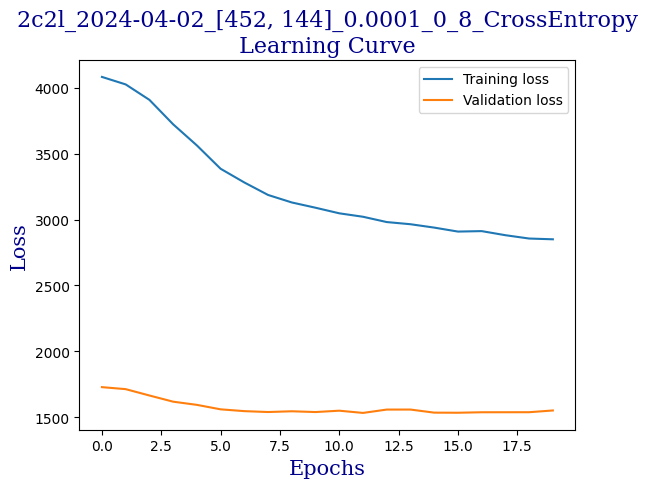

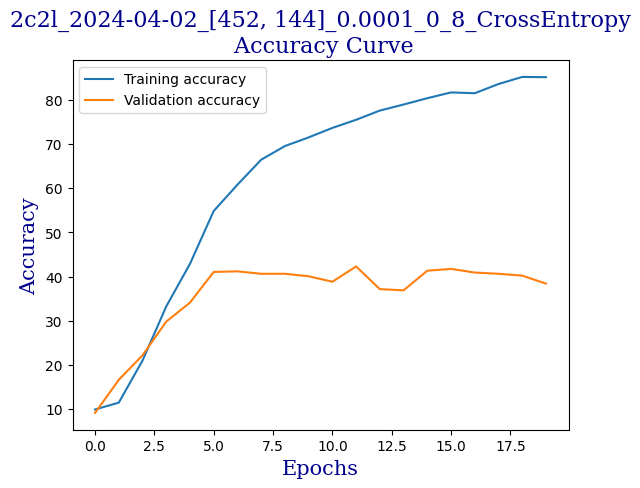

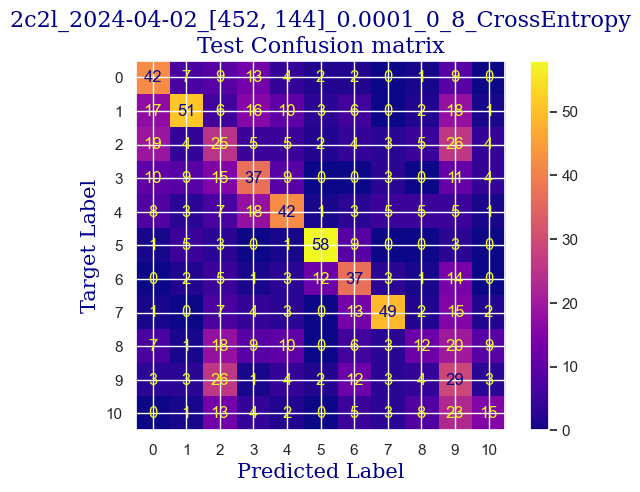

 
 END 2c2l [452, 144] Run Time:  6109.360388702
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
6120.691441588
6109.362357442
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.339678762641284
validating...


  5%|██▎                                          | 1/20 [00:34<11:00, 34.75s/it]

validation accuracy:  8.876560332871012
Training...
train accuracy:  9.1017251635931
validating...


 10%|████▌                                        | 2/20 [01:09<10:25, 34.76s/it]

validation accuracy:  8.876560332871012
Training...
train accuracy:  9.1017251635931
validating...


 15%|██████▊                                      | 3/20 [01:44<09:52, 34.83s/it]

validation accuracy:  8.876560332871012
Training...
train accuracy:  9.1017251635931
validating...


 20%|█████████                                    | 4/20 [02:19<09:17, 34.83s/it]

validation accuracy:  8.876560332871012
Training...
train accuracy:  10.23200475907198
validating...


 25%|███████████▎                                 | 5/20 [02:54<08:42, 34.80s/it]

validation accuracy:  13.730929264909847
Training...
train accuracy:  17.311124330755504
validating...


 30%|█████████████▌                               | 6/20 [03:28<08:07, 34.83s/it]

validation accuracy:  21.35922330097087
Training...
train accuracy:  38.60797144556811
validating...


 35%|███████████████▋                             | 7/20 [04:03<07:32, 34.83s/it]

validation accuracy:  34.535367545076284
Training...
train accuracy:  50.20820939916716
validating...


 40%|██████████████████                           | 8/20 [04:38<06:57, 34.77s/it]

validation accuracy:  35.92233009708738
Training...
train accuracy:  59.60737656157049
validating...


 45%|████████████████████▎                        | 9/20 [05:13<06:22, 34.78s/it]

validation accuracy:  38.141470180305134
Training...
train accuracy:  63.890541344437835
validating...


 50%|██████████████████████                      | 10/20 [05:48<05:48, 34.82s/it]

validation accuracy:  40.221914008321775
Training...
train accuracy:  68.94705532421177
validating...


 55%|████████████████████████▏                   | 11/20 [06:22<05:13, 34.82s/it]

validation accuracy:  40.915395284327325
Training...
train accuracy:  70.96966091612136
validating...


 60%|██████████████████████████▍                 | 12/20 [06:57<04:38, 34.77s/it]

validation accuracy:  42.302357836338416
Training...
train accuracy:  74.53896490184414
validating...


 65%|████████████████████████████▌               | 13/20 [07:32<04:03, 34.77s/it]

validation accuracy:  42.857142857142854
Training...
train accuracy:  76.08566329565734
validating...


 70%|██████████████████████████████▊             | 14/20 [08:07<03:28, 34.75s/it]

validation accuracy:  40.36061026352289
Training...
train accuracy:  78.4651992861392
validating...


 75%|█████████████████████████████████           | 15/20 [08:41<02:53, 34.76s/it]

validation accuracy:  40.36061026352289
Training...
train accuracy:  80.54729327781082
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:16<02:19, 34.77s/it]

validation accuracy:  45.07628294036061
Training...
train accuracy:  82.034503271862
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:51<01:44, 34.75s/it]

validation accuracy:  46.601941747572816
Training...
train accuracy:  82.21296847114813
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:26<01:09, 34.77s/it]

validation accuracy:  43.5506241331484
Training...
train accuracy:  83.34324806662701
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:00<00:34, 34.77s/it]

validation accuracy:  41.88626907073509
Training...
train accuracy:  85.42534205829864
validating...


100%|████████████████████████████████████████████| 20/20 [11:35<00:00, 34.79s/it]

validation accuracy:  40.77669902912621
Testing...


 
 train acc:  85.42534205829864
 
 val acc:  40.77669902912621
 
 test acc:  40.48543689320388


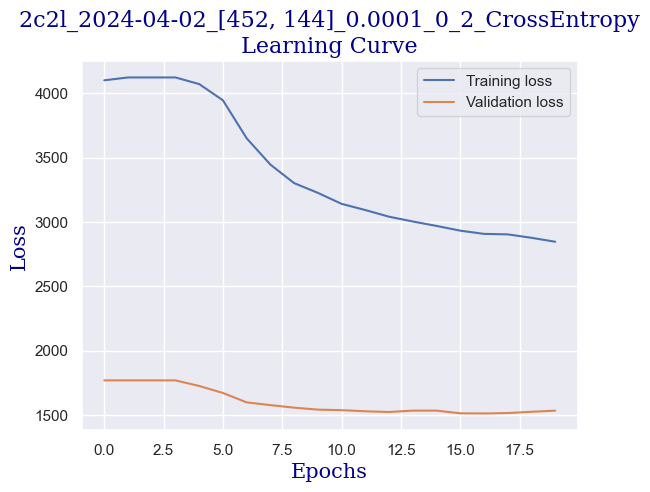

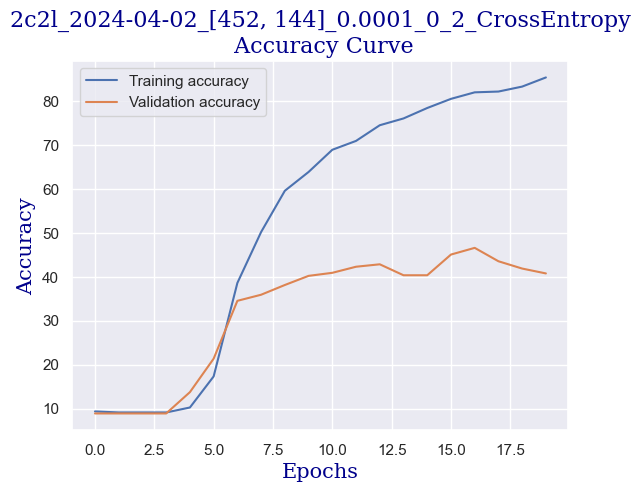

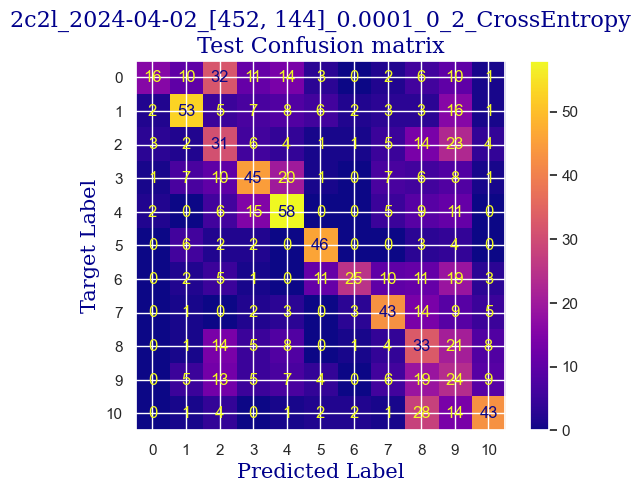

 
 END 2c2l [452, 144] Run Time:  6123.856871668
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
12244.549544372
12233.220461588
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  10.291493158834028
validating...


  5%|██▎                                          | 1/20 [00:35<11:05, 35.03s/it]

validation accuracy:  9.015256588072122
Training...
train accuracy:  11.005353955978585
validating...


 10%|████▌                                        | 2/20 [01:09<10:29, 34.98s/it]

validation accuracy:  12.89875173370319
Training...
train accuracy:  21.534800713860797
validating...


 15%|██████▊                                      | 3/20 [01:44<09:52, 34.88s/it]

validation accuracy:  22.74618585298197
Training...
train accuracy:  37.894110648423556
validating...


 20%|█████████                                    | 4/20 [02:19<09:17, 34.85s/it]

validation accuracy:  32.038834951456316
Training...
train accuracy:  46.936347412254605
validating...


 25%|███████████▎                                 | 5/20 [02:54<08:42, 34.82s/it]

validation accuracy:  37.03190013869626
Training...
train accuracy:  52.88518738845925
validating...


 30%|█████████████▌                               | 6/20 [03:29<08:08, 34.86s/it]

validation accuracy:  39.528432732316226
Training...
train accuracy:  57.52528256989887
validating...


 35%|███████████████▋                             | 7/20 [04:04<07:33, 34.85s/it]

validation accuracy:  39.389736477115115
Training...
train accuracy:  60.440214158239144
validating...


 40%|██████████████████                           | 8/20 [04:38<06:57, 34.81s/it]

validation accuracy:  39.1123439667129
Training...
train accuracy:  63.05770374776919
validating...


 45%|████████████████████▎                        | 9/20 [05:13<06:22, 34.82s/it]

validation accuracy:  40.915395284327325
Training...
train accuracy:  65.91314693634742
validating...


 50%|██████████████████████                      | 10/20 [05:48<05:48, 34.85s/it]

validation accuracy:  41.05409153952843
Training...
train accuracy:  67.22189173111244
validating...


 55%|████████████████████████▏                   | 11/20 [06:23<05:13, 34.82s/it]

validation accuracy:  39.80582524271845
Training...
train accuracy:  68.94705532421177
validating...


 60%|██████████████████████████▍                 | 12/20 [06:58<04:38, 34.82s/it]

validation accuracy:  40.915395284327325
Training...
train accuracy:  70.31528851873885
validating...


 65%|████████████████████████████▌               | 13/20 [07:32<04:03, 34.78s/it]

validation accuracy:  42.857142857142854
Training...
train accuracy:  71.56454491374183
validating...


 70%|██████████████████████████████▊             | 14/20 [08:07<03:28, 34.82s/it]

validation accuracy:  43.828016643550626
Training...
train accuracy:  72.04045211183819
validating...


 75%|█████████████████████████████████           | 15/20 [08:42<02:53, 34.80s/it]

validation accuracy:  43.689320388349515
Training...
train accuracy:  75.60975609756098
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:17<02:19, 34.78s/it]

validation accuracy:  42.995839112343965
Training...
train accuracy:  75.19333729922664
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:52<01:44, 34.83s/it]

validation accuracy:  45.90846047156727
Training...
train accuracy:  76.85901249256395
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:26<01:09, 34.83s/it]

validation accuracy:  43.828016643550626
Training...
train accuracy:  76.26412849494348
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:01<00:34, 34.83s/it]

validation accuracy:  45.90846047156727
Training...
train accuracy:  78.22724568709101
validating...


100%|████████████████████████████████████████████| 20/20 [11:36<00:00, 34.84s/it]

validation accuracy:  43.96671289875174
Testing...


 
 train acc:  78.22724568709101
 
 val acc:  43.96671289875174
 
 test acc:  41.650485436893206


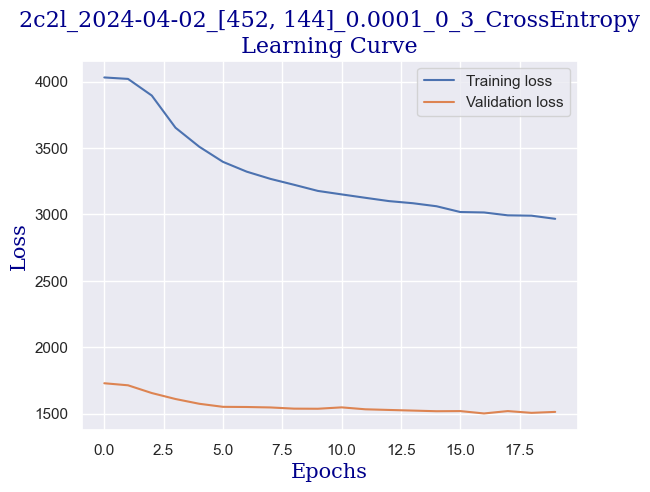

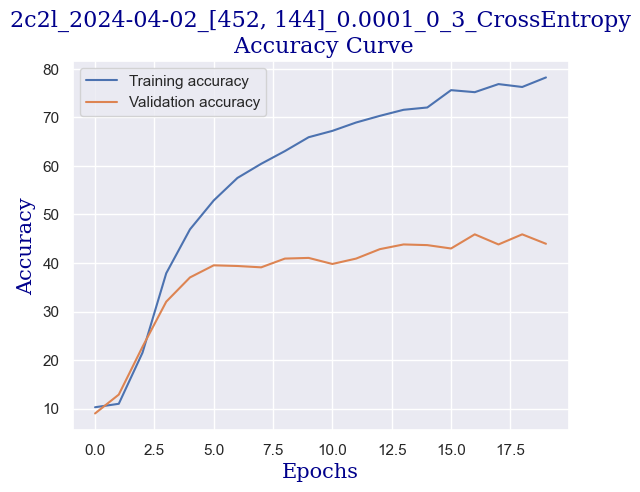

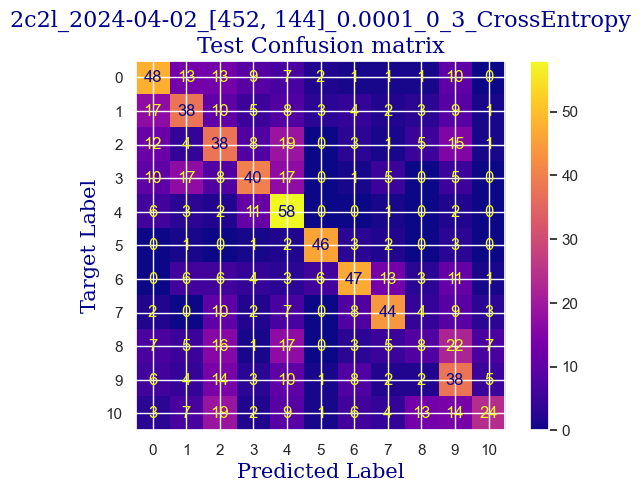

 
 END 2c2l [452, 144] Run Time:  6109.824425258001
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
18354.374902246
18343.04581928
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  10.23200475907198
validating...


  5%|██▎                                          | 1/20 [00:34<10:58, 34.67s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 10%|████▌                                        | 2/20 [01:09<10:24, 34.70s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.57763236168947
validating...


 15%|██████▊                                      | 3/20 [01:44<09:51, 34.77s/it]

validation accuracy:  9.70873786407767
Training...
train accuracy:  9.696609161213564
validating...


 20%|█████████                                    | 4/20 [02:19<09:17, 34.83s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  13.741820345032718
validating...


 25%|███████████▎                                 | 5/20 [02:53<08:42, 34.82s/it]

validation accuracy:  19.14008321775312
Training...
train accuracy:  27.78108268887567
validating...


 30%|█████████████▌                               | 6/20 [03:28<08:07, 34.83s/it]

validation accuracy:  28.9875173370319
Training...
train accuracy:  41.34443783462225
validating...


 35%|███████████████▋                             | 7/20 [04:03<07:32, 34.84s/it]

validation accuracy:  33.42579750346741
Training...
train accuracy:  49.13741820345033
validating...


 40%|██████████████████                           | 8/20 [04:38<06:57, 34.83s/it]

validation accuracy:  35.78363384188627
Training...
train accuracy:  54.90779298036883
validating...


 45%|████████████████████▎                        | 9/20 [05:13<06:22, 34.81s/it]

validation accuracy:  37.7253814147018
Training...
train accuracy:  60.261748958953
validating...


 50%|██████████████████████                      | 10/20 [05:48<05:48, 34.83s/it]

validation accuracy:  38.69625520110957
Training...
train accuracy:  63.77156454491374
validating...


 55%|████████████████████████▏                   | 11/20 [06:22<05:13, 34.82s/it]

validation accuracy:  39.25104022191401
Training...
train accuracy:  65.19928613920285
validating...


 60%|██████████████████████████▍                 | 12/20 [06:57<04:38, 34.86s/it]

validation accuracy:  39.25104022191401
Training...
train accuracy:  69.00654372397382
validating...


 65%|████████████████████████████▌               | 13/20 [07:32<04:03, 34.82s/it]

validation accuracy:  39.528432732316226
Training...
train accuracy:  70.85068411659726
validating...


 70%|██████████████████████████████▊             | 14/20 [08:07<03:29, 34.87s/it]

validation accuracy:  42.44105409153953
Training...
train accuracy:  72.99226650803094
validating...


 75%|█████████████████████████████████           | 15/20 [08:42<02:54, 34.85s/it]

validation accuracy:  39.66712898751734
Training...
train accuracy:  73.5871505056514
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:17<02:19, 34.83s/it]

validation accuracy:  44.10540915395285
Training...
train accuracy:  76.918500892326
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:52<01:44, 34.84s/it]

validation accuracy:  45.07628294036061
Training...
train accuracy:  77.92980368828078
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:26<01:09, 34.87s/it]

validation accuracy:  44.382801664355064
Training...
train accuracy:  80.36882807852469
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:01<00:34, 34.84s/it]

validation accuracy:  43.96671289875174
Training...
train accuracy:  80.2498512790006
validating...


100%|████████████████████████████████████████████| 20/20 [11:36<00:00, 34.83s/it]

validation accuracy:  43.27323162274618
Testing...


 
 train acc:  80.2498512790006
 
 val acc:  43.27323162274618
 
 test acc:  39.22330097087379


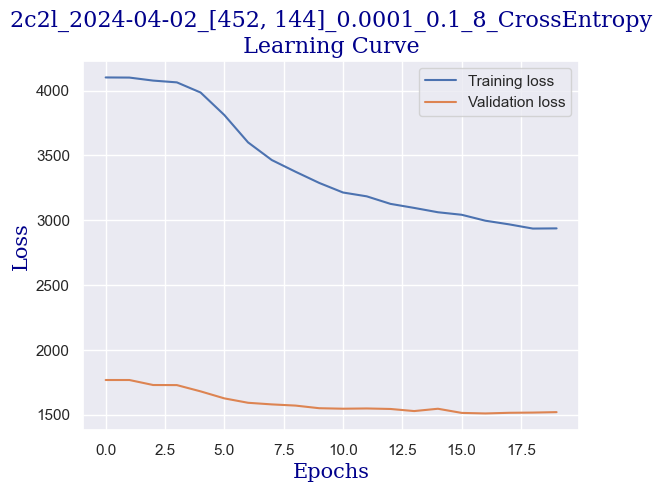

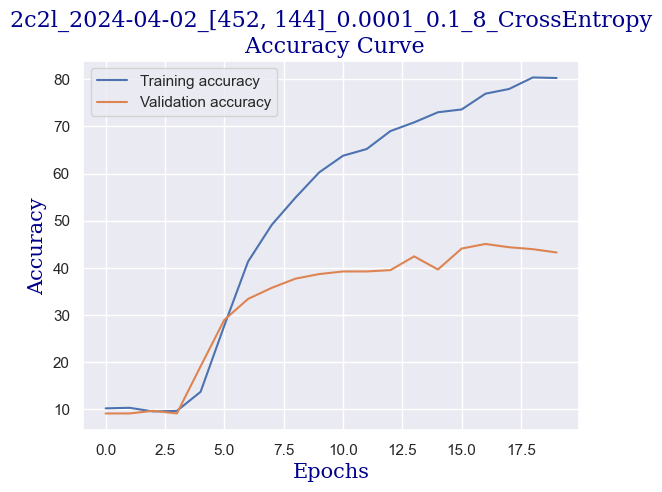

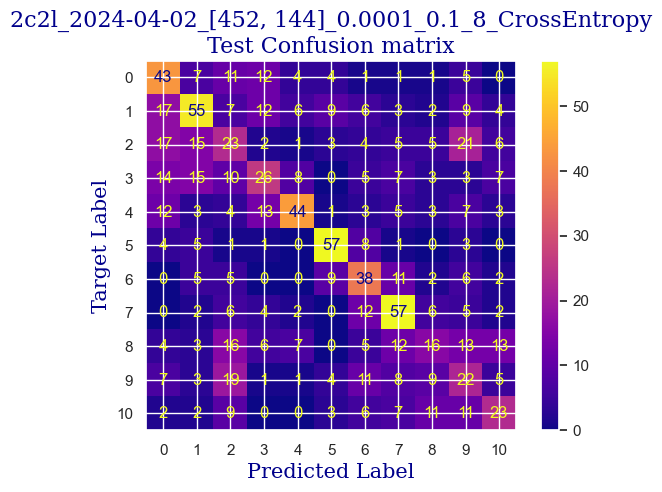

 
 END 2c2l [452, 144] Run Time:  6108.498485959
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
24462.87425001
24451.545166641
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.030933967876264
validating...


  5%|██▎                                          | 1/20 [00:34<11:02, 34.85s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.767400356930398
validating...


 10%|████▌                                        | 2/20 [01:09<10:27, 34.89s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.89767995240928
validating...


 15%|██████▊                                      | 3/20 [01:44<09:53, 34.89s/it]

validation accuracy:  13.592233009708737
Training...
train accuracy:  23.854848304580607
validating...


 20%|█████████                                    | 4/20 [02:19<09:18, 34.88s/it]

validation accuracy:  26.629680998613036
Training...
train accuracy:  40.27364663890541
validating...


 25%|███████████▎                                 | 5/20 [02:54<08:42, 34.85s/it]

validation accuracy:  34.39667128987517
Training...
train accuracy:  52.706722189173114
validating...


 30%|█████████████▌                               | 6/20 [03:29<08:08, 34.86s/it]

validation accuracy:  36.754507628294036
Training...
train accuracy:  60.38072575847709
validating...


 35%|███████████████▋                             | 7/20 [04:03<07:32, 34.83s/it]

validation accuracy:  39.528432732316226
Training...
train accuracy:  64.78286734086853
validating...


 40%|██████████████████                           | 8/20 [04:38<06:57, 34.82s/it]

validation accuracy:  38.55755894590846
Training...
train accuracy:  68.5901249256395
validating...


 45%|████████████████████▎                        | 9/20 [05:13<06:23, 34.84s/it]

validation accuracy:  42.44105409153953
Training...
train accuracy:  71.38607971445569
validating...


 50%|██████████████████████                      | 10/20 [05:48<05:48, 34.82s/it]

validation accuracy:  42.57975034674064
Training...
train accuracy:  74.30101130279596
validating...


 55%|████████████████████████▏                   | 11/20 [06:23<05:13, 34.83s/it]

validation accuracy:  41.05409153952843
Training...
train accuracy:  75.96668649613325
validating...


 60%|██████████████████████████▍                 | 12/20 [06:58<04:38, 34.84s/it]

validation accuracy:  40.36061026352289
Training...
train accuracy:  76.74003569303986
validating...


 65%|████████████████████████████▌               | 13/20 [07:32<04:03, 34.82s/it]

validation accuracy:  41.74757281553398
Training...
train accuracy:  77.98929208804283
validating...


 70%|██████████████████████████████▊             | 14/20 [08:07<03:29, 34.85s/it]

validation accuracy:  43.689320388349515
Training...
train accuracy:  79.65496728138012
validating...


 75%|█████████████████████████████████           | 15/20 [08:42<02:54, 34.85s/it]

validation accuracy:  45.07628294036061
Training...
train accuracy:  80.54729327781082
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:17<02:19, 34.83s/it]

validation accuracy:  41.05409153952843
Training...
train accuracy:  80.72575847709696
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:52<01:44, 34.83s/it]

validation accuracy:  42.857142857142854
Training...
train accuracy:  81.26115407495539
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:27<01:09, 34.90s/it]

validation accuracy:  42.57975034674064
Training...
train accuracy:  81.6775728732897
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:02<00:34, 34.87s/it]

validation accuracy:  44.382801664355064
Training...
train accuracy:  82.034503271862
validating...


100%|████████████████████████████████████████████| 20/20 [11:37<00:00, 34.85s/it]

validation accuracy:  43.96671289875174
Testing...


 
 train acc:  82.034503271862
 
 val acc:  43.96671289875174
 
 test acc:  38.25242718446602


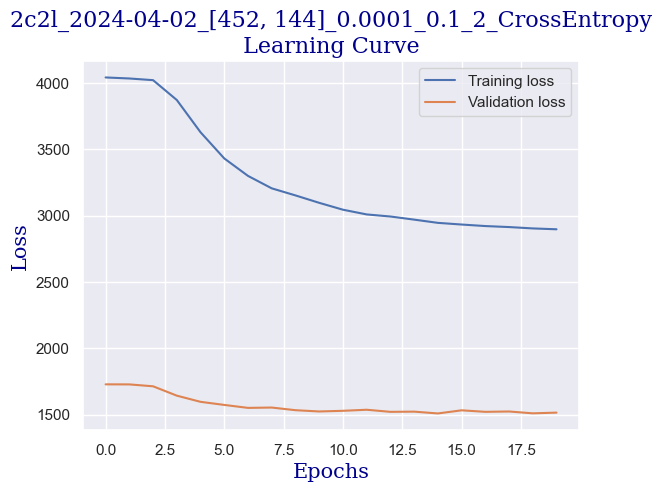

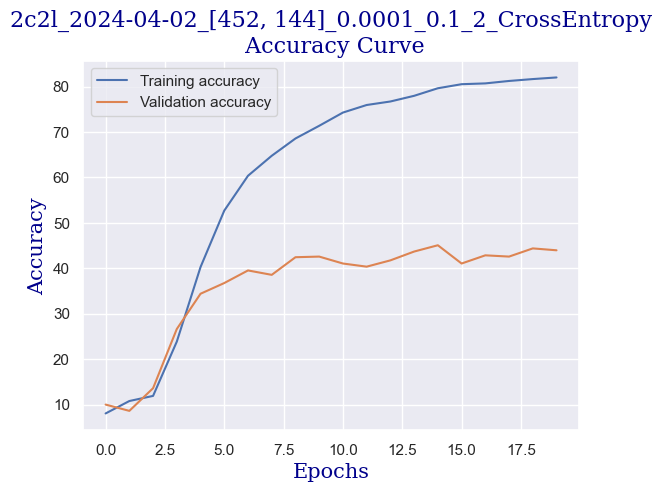

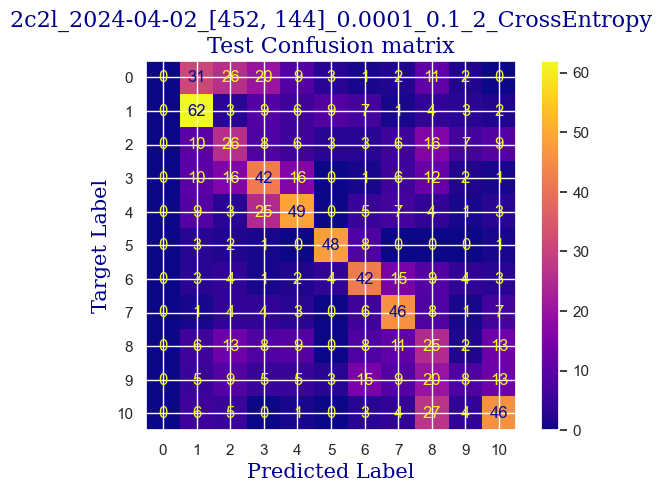

 
 END 2c2l [452, 144] Run Time:  6105.930953080999
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
30568.806414125
30557.477328349
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.696609161213564
validating...


  5%|██▎                                          | 1/20 [00:34<11:03, 34.94s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  13.2064247471743
validating...


 10%|████▌                                        | 2/20 [01:09<10:27, 34.84s/it]

validation accuracy:  20.249653259361995
Training...
train accuracy:  30.814991076740032
validating...


 15%|██████▊                                      | 3/20 [01:44<09:53, 34.90s/it]

validation accuracy:  30.651872399445214
Training...
train accuracy:  44.79476502082094
validating...


 20%|█████████                                    | 4/20 [02:19<09:18, 34.90s/it]

validation accuracy:  32.73231622746186
Training...
train accuracy:  52.944675788221296
validating...


 25%|███████████▎                                 | 5/20 [02:54<08:43, 34.87s/it]

validation accuracy:  34.812760055478506
Training...
train accuracy:  59.72635336109459
validating...


 30%|█████████████▌                               | 6/20 [03:29<08:08, 34.91s/it]

validation accuracy:  37.7253814147018
Training...
train accuracy:  65.49672813801308
validating...


 35%|███████████████▋                             | 7/20 [04:04<07:33, 34.88s/it]

validation accuracy:  40.083217753120664
Training...
train accuracy:  67.63831052944676
validating...


 40%|██████████████████                           | 8/20 [04:39<06:58, 34.87s/it]

validation accuracy:  40.77669902912621
Training...
train accuracy:  71.74301011302796
validating...


 45%|████████████████████▎                        | 9/20 [05:13<06:23, 34.87s/it]

validation accuracy:  39.25104022191401
Training...
train accuracy:  73.82510410469958
validating...


 50%|██████████████████████                      | 10/20 [05:48<05:48, 34.84s/it]

validation accuracy:  41.33148404993065
Training...
train accuracy:  76.44259369422961
validating...


 55%|████████████████████████▏                   | 11/20 [06:23<05:13, 34.83s/it]

validation accuracy:  41.47018030513176
Training...
train accuracy:  76.32361689470554
validating...


 60%|██████████████████████████▍                 | 12/20 [06:58<04:38, 34.86s/it]

validation accuracy:  41.33148404993065
Training...
train accuracy:  79.77394408090423
validating...


 65%|████████████████████████████▌               | 13/20 [07:33<04:04, 34.86s/it]

validation accuracy:  42.71844660194174
Training...
train accuracy:  80.54729327781082
validating...


 70%|██████████████████████████████▊             | 14/20 [08:08<03:29, 34.87s/it]

validation accuracy:  42.857142857142854
Training...
train accuracy:  80.84473527662107
validating...


 75%|█████████████████████████████████           | 15/20 [08:42<02:54, 34.84s/it]

validation accuracy:  40.915395284327325
Training...
train accuracy:  82.8078524687686
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:17<02:19, 34.83s/it]

validation accuracy:  42.857142857142854
Training...
train accuracy:  83.10529446757883
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:52<01:44, 34.82s/it]

validation accuracy:  42.71844660194174
Training...
train accuracy:  83.70017846519929
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:27<01:09, 34.81s/it]

validation accuracy:  42.302357836338416
Training...
train accuracy:  83.2242712671029
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:02<00:34, 34.81s/it]

validation accuracy:  43.13453536754508
Training...
train accuracy:  84.94943486020226
validating...


100%|████████████████████████████████████████████| 20/20 [11:37<00:00, 34.86s/it]

validation accuracy:  40.77669902912621
Testing...


 
 train acc:  84.94943486020226
 
 val acc:  40.77669902912621
 
 test acc:  40.0


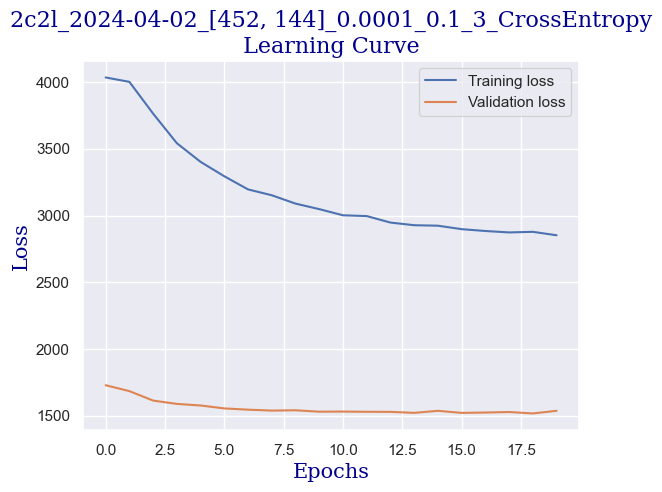

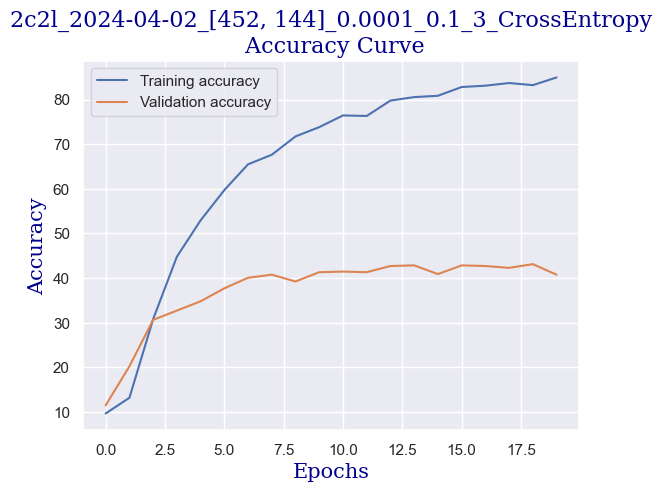

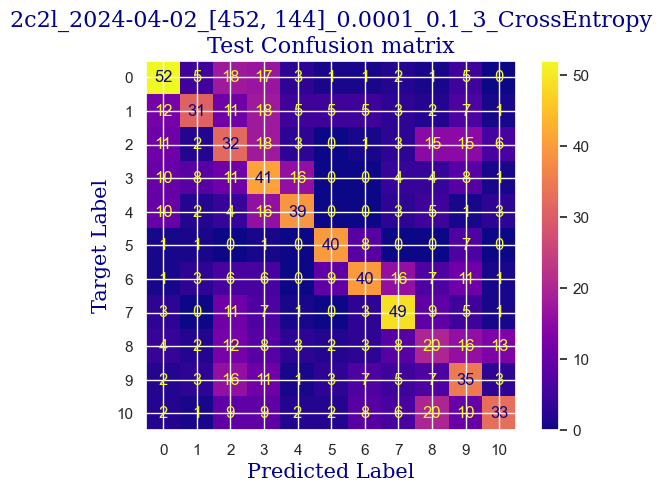

 
 END 2c2l [452, 144] Run Time:  6115.373581380998
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
36684.180921736
36672.851836607
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  10.291493158834028
validating...


  5%|██▎                                          | 1/20 [00:34<10:50, 34.25s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 10%|████▌                                        | 2/20 [01:08<10:18, 34.35s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 15%|██████▊                                      | 3/20 [01:43<09:44, 34.36s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 20%|█████████                                    | 4/20 [02:17<09:09, 34.33s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 25%|███████████▎                                 | 5/20 [02:51<08:35, 34.37s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 30%|█████████████▌                               | 6/20 [03:26<08:00, 34.36s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.826888756692444
validating...


 35%|███████████████▋                             | 7/20 [04:00<07:26, 34.35s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.637120761451518
validating...


 40%|██████████████████                           | 8/20 [04:35<06:54, 34.51s/it]

validation accuracy:  13.869625520110956
Training...
train accuracy:  17.132659131469364
validating...


 45%|████████████████████▎                        | 9/20 [05:10<06:21, 34.67s/it]

validation accuracy:  27.184466019417474
Training...
train accuracy:  33.96787626412849
validating...


 50%|██████████████████████                      | 10/20 [05:45<05:47, 34.71s/it]

validation accuracy:  32.17753120665742
Training...
train accuracy:  44.97323022010708
validating...


 55%|████████████████████████▏                   | 11/20 [06:19<05:12, 34.75s/it]

validation accuracy:  33.841886269070734
Training...
train accuracy:  55.08625817965497
validating...


 60%|██████████████████████████▍                 | 12/20 [06:54<04:38, 34.76s/it]

validation accuracy:  36.89320388349515
Training...
train accuracy:  61.629982153480064
validating...


 65%|████████████████████████████▌               | 13/20 [07:29<04:03, 34.77s/it]

validation accuracy:  38.41886269070735
Training...
train accuracy:  68.17370612730518
validating...


 70%|██████████████████████████████▊             | 14/20 [08:04<03:28, 34.77s/it]

validation accuracy:  42.0249653259362
Training...
train accuracy:  71.9214753123141
validating...


 75%|█████████████████████████████████           | 15/20 [08:39<02:53, 34.76s/it]

validation accuracy:  42.71844660194174
Training...
train accuracy:  74.360499702558
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:14<02:19, 34.83s/it]

validation accuracy:  41.05409153952843
Training...
train accuracy:  75.9071980963712
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:48<01:44, 34.83s/it]

validation accuracy:  41.47018030513176
Training...
train accuracy:  78.10826888756692
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:23<01:09, 34.80s/it]

validation accuracy:  41.19278779472954
Training...
train accuracy:  78.82212968471148
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [10:58<00:34, 34.80s/it]

validation accuracy:  40.083217753120664
Training...
train accuracy:  80.54729327781082
validating...


100%|████████████████████████████████████████████| 20/20 [11:33<00:00, 34.66s/it]

validation accuracy:  38.69625520110957
Testing...


 
 train acc:  80.54729327781082
 
 val acc:  38.69625520110957
 
 test acc:  40.0


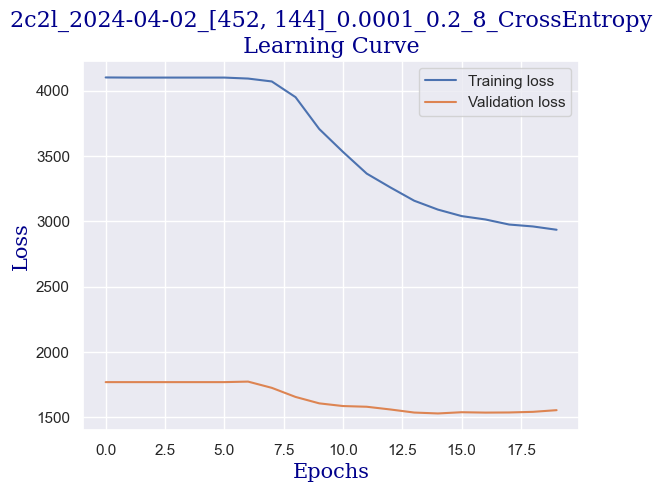

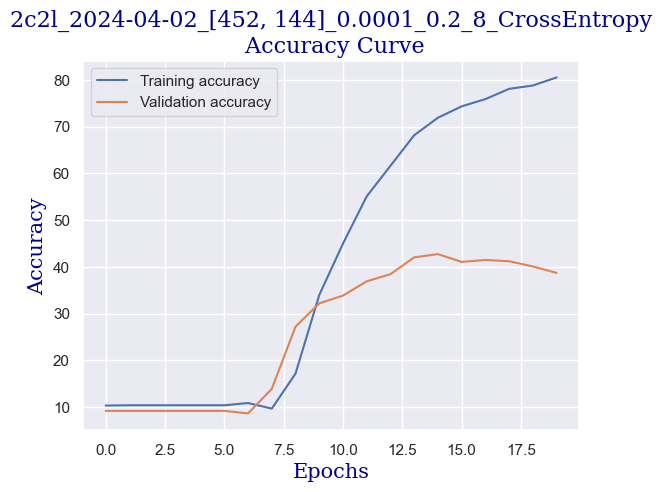

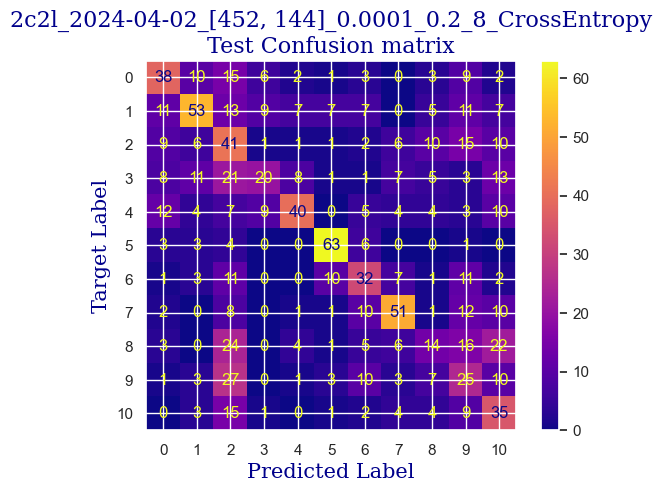

 
 END 2c2l [452, 144] Run Time:  6111.2223507860035
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
42795.404487755
42784.07540109
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  7.911957168352171
validating...


  5%|██▎                                          | 1/20 [00:34<11:01, 34.80s/it]

validation accuracy:  9.57004160887656
Training...
train accuracy:  8.26888756692445
validating...


 10%|████▌                                        | 2/20 [01:09<10:27, 34.84s/it]

validation accuracy:  10.957004160887656
Training...
train accuracy:  10.113027959547887
validating...


 15%|██████▊                                      | 3/20 [01:44<09:51, 34.82s/it]

validation accuracy:  12.89875173370319
Training...
train accuracy:  14.455681142177276
validating...


 20%|█████████                                    | 4/20 [02:19<09:16, 34.81s/it]

validation accuracy:  19.83356449375867
Training...
train accuracy:  26.472337894110648
validating...


 25%|███████████▎                                 | 5/20 [02:54<08:41, 34.79s/it]

validation accuracy:  24.965325936199722
Training...
train accuracy:  34.7412254610351
validating...


 30%|█████████████▌                               | 6/20 [03:28<08:07, 34.79s/it]

validation accuracy:  28.9875173370319
Training...
train accuracy:  40.92801903628792
validating...


 35%|███████████████▋                             | 7/20 [04:03<07:32, 34.79s/it]

validation accuracy:  30.651872399445214
Training...
train accuracy:  47.23378941106484
validating...


 40%|██████████████████                           | 8/20 [04:38<06:57, 34.83s/it]

validation accuracy:  33.841886269070734
Training...
train accuracy:  51.81439619274242
validating...


 45%|████████████████████▎                        | 9/20 [05:13<06:22, 34.82s/it]

validation accuracy:  33.70319001386963
Training...
train accuracy:  53.7180249851279
validating...


 50%|██████████████████████                      | 10/20 [05:48<05:47, 34.79s/it]

validation accuracy:  32.73231622746186
Training...
train accuracy:  57.70374776918501
validating...


 55%|████████████████████████▏                   | 11/20 [06:22<05:13, 34.80s/it]

validation accuracy:  34.535367545076284
Training...
train accuracy:  60.440214158239144
validating...


 60%|██████████████████████████▍                 | 12/20 [06:57<04:38, 34.78s/it]

validation accuracy:  34.535367545076284
Training...
train accuracy:  62.998215348007136
validating...


 65%|████████████████████████████▌               | 13/20 [07:32<04:03, 34.81s/it]

validation accuracy:  35.64493758668516
Training...
train accuracy:  64.72337894110647
validating...


 70%|██████████████████████████████▊             | 14/20 [08:07<03:29, 34.85s/it]

validation accuracy:  34.812760055478506
Training...
train accuracy:  64.90184414039263
validating...


 75%|█████████████████████████████████           | 15/20 [08:42<02:54, 34.82s/it]

validation accuracy:  35.50624133148405
Training...
train accuracy:  67.57882212968471
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:17<02:19, 34.83s/it]

validation accuracy:  36.754507628294036
Training...
train accuracy:  67.22189173111244
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:51<01:44, 34.83s/it]

validation accuracy:  36.754507628294036
Training...
train accuracy:  71.38607971445569
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:26<01:09, 34.81s/it]

validation accuracy:  38.55755894590846
Training...
train accuracy:  72.8138013087448
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:01<00:34, 34.82s/it]

validation accuracy:  38.28016643550624
Training...
train accuracy:  73.76561570493753
validating...


100%|████████████████████████████████████████████| 20/20 [11:36<00:00, 34.81s/it]

validation accuracy:  38.00277392510402
Testing...


 
 train acc:  73.76561570493753
 
 val acc:  38.00277392510402
 
 test acc:  35.04854368932039


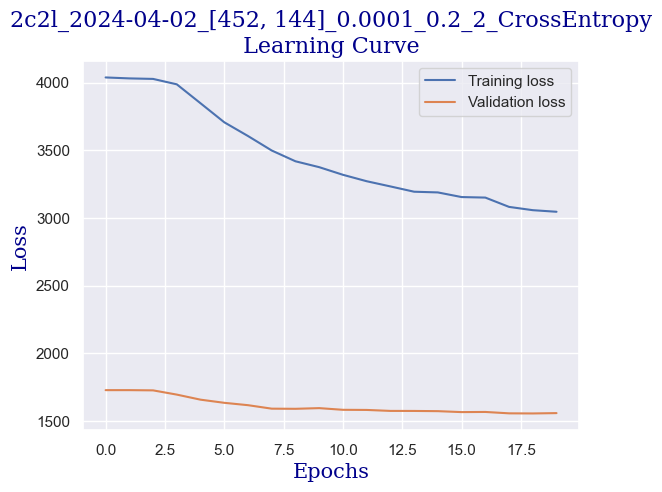

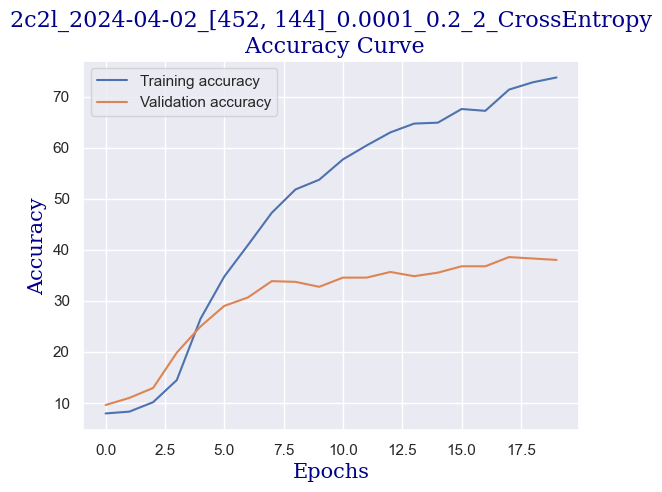

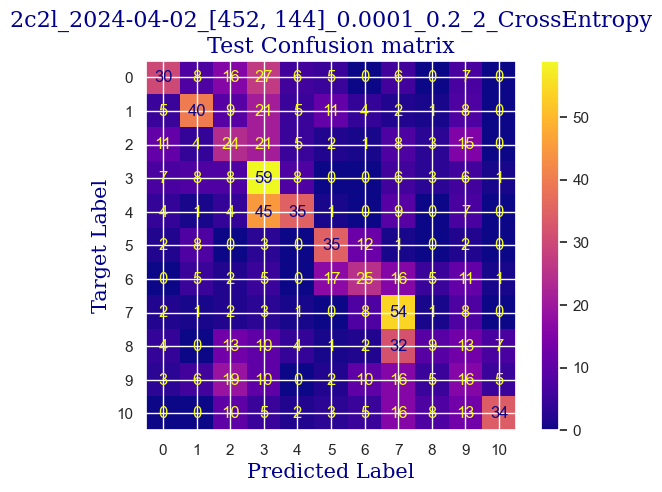

 
 END 2c2l [452, 144] Run Time:  6106.831108456005
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
48902.236972626
48890.907890814
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.625817965496728
validating...


  5%|██▎                                          | 1/20 [00:34<11:00, 34.79s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  9.458655562165378
validating...


 10%|████▌                                        | 2/20 [01:09<10:27, 34.84s/it]

validation accuracy:  7.628294036061026
Training...
train accuracy:  17.668054729327782
validating...


 15%|██████▊                                      | 3/20 [01:44<09:52, 34.83s/it]

validation accuracy:  20.249653259361995
Training...
train accuracy:  28.851873884592504
validating...


 20%|█████████                                    | 4/20 [02:19<09:17, 34.84s/it]

validation accuracy:  27.184466019417474
Training...
train accuracy:  36.466389054134446
validating...


 25%|███████████▎                                 | 5/20 [02:54<08:42, 34.84s/it]

validation accuracy:  26.907073509015255
Training...
train accuracy:  40.86853063652588
validating...


 30%|█████████████▌                               | 6/20 [03:28<08:07, 34.83s/it]

validation accuracy:  31.06796116504854
Training...
train accuracy:  46.103509815585966
validating...


 35%|███████████████▋                             | 7/20 [04:03<07:32, 34.79s/it]

validation accuracy:  31.484049930651874
Training...
train accuracy:  49.613325401546696
validating...


 40%|██████████████████                           | 8/20 [04:38<06:57, 34.80s/it]

validation accuracy:  32.038834951456316
Training...
train accuracy:  53.182629387269486
validating...


 45%|████████████████████▎                        | 9/20 [05:13<06:22, 34.78s/it]

validation accuracy:  33.14840499306519
Training...
train accuracy:  56.03807257584771
validating...


 50%|██████████████████████                      | 10/20 [05:48<05:48, 34.82s/it]

validation accuracy:  37.03190013869626
Training...
train accuracy:  59.42891136228435
validating...


 55%|████████████████████████▏                   | 11/20 [06:23<05:13, 34.85s/it]

validation accuracy:  36.47711511789182
Training...
train accuracy:  61.9274241522903
validating...


 60%|██████████████████████████▍                 | 12/20 [06:57<04:38, 34.82s/it]

validation accuracy:  34.95145631067961
Training...
train accuracy:  63.117192147531235
validating...


 65%|████████████████████████████▌               | 13/20 [07:32<04:03, 34.79s/it]

validation accuracy:  32.038834951456316
Training...
train accuracy:  62.40333135038667
validating...


 70%|██████████████████████████████▊             | 14/20 [08:07<03:28, 34.81s/it]

validation accuracy:  35.50624133148405
Training...
train accuracy:  65.55621653777514
validating...


 75%|█████████████████████████████████           | 15/20 [08:42<02:54, 34.82s/it]

validation accuracy:  37.03190013869626
Training...
train accuracy:  67.28138013087448
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:17<02:19, 34.84s/it]

validation accuracy:  34.95145631067961
Training...
train accuracy:  67.6977989292088
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:51<01:44, 34.83s/it]

validation accuracy:  34.812760055478506
Training...
train accuracy:  68.94705532421177
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:26<01:09, 34.84s/it]

validation accuracy:  36.47711511789182
Training...
train accuracy:  70.61273051754908
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:01<00:34, 34.84s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  71.74301011302796
validating...


100%|████████████████████████████████████████████| 20/20 [11:36<00:00, 34.82s/it]

validation accuracy:  37.447988904299585
Testing...


 
 train acc:  71.74301011302796
 
 val acc:  37.447988904299585
 
 test acc:  36.310679611650485


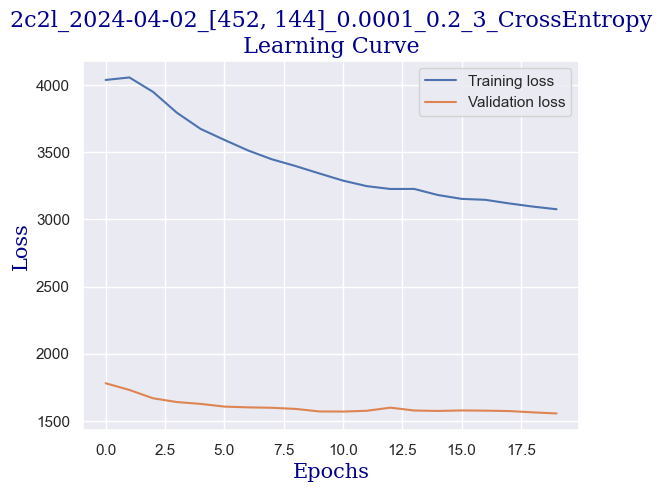

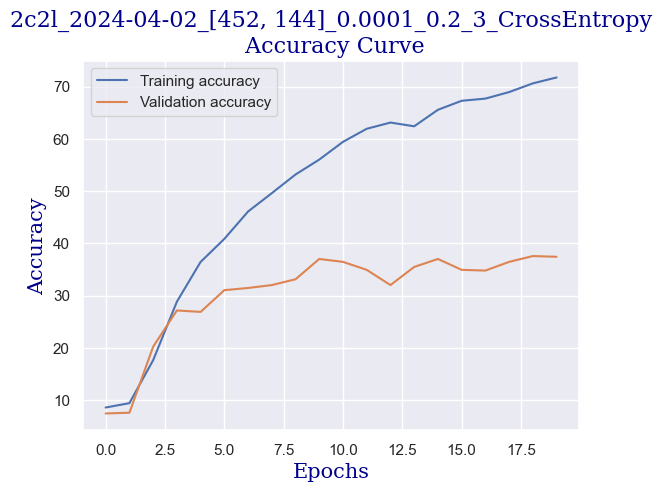

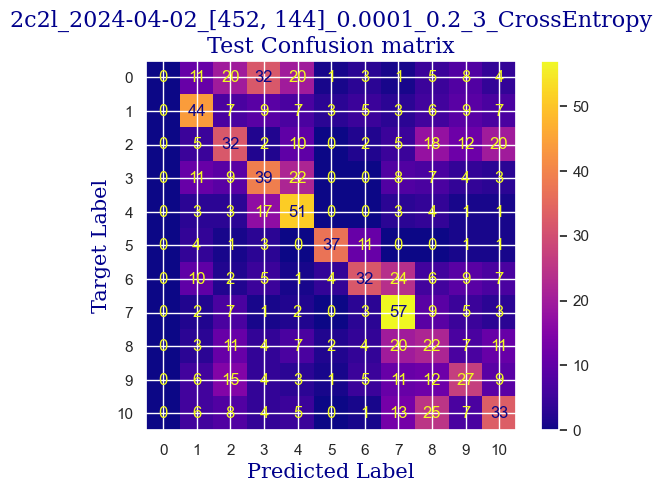

 
 END 2c2l [452, 144] Run Time:  6100.874738195002
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
55003.112917969
54991.783833657
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.74479476502082
validating...


  5%|██▎                                          | 1/20 [00:34<10:55, 34.50s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 10%|████▌                                        | 2/20 [01:09<10:22, 34.60s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 15%|██████▊                                      | 3/20 [01:43<09:47, 34.56s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 20%|█████████                                    | 4/20 [02:18<09:14, 34.63s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 25%|███████████▎                                 | 5/20 [02:53<08:40, 34.68s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 30%|█████████████▌                               | 6/20 [03:27<08:04, 34.64s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 35%|███████████████▋                             | 7/20 [04:02<07:30, 34.62s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 40%|██████████████████                           | 8/20 [04:37<06:55, 34.65s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 45%|████████████████████▎                        | 9/20 [05:11<06:21, 34.64s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 50%|██████████████████████                      | 10/20 [05:46<05:46, 34.67s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 55%|████████████████████████▏                   | 11/20 [06:21<05:12, 34.69s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 60%|██████████████████████████▍                 | 12/20 [06:55<04:37, 34.68s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 65%|████████████████████████████▌               | 13/20 [07:30<04:02, 34.67s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 70%|██████████████████████████████▊             | 14/20 [08:05<03:27, 34.64s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 75%|█████████████████████████████████           | 15/20 [08:39<02:53, 34.66s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:14<02:18, 34.64s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:48<01:43, 34.60s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:23<01:09, 34.66s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [10:58<00:34, 34.62s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


100%|████████████████████████████████████████████| 20/20 [11:32<00:00, 34.64s/it]

validation accuracy:  9.153952843273231
Testing...


 
 train acc:  10.350981558596075
 
 val acc:  9.153952843273231
 
 test acc:  9.902912621359224


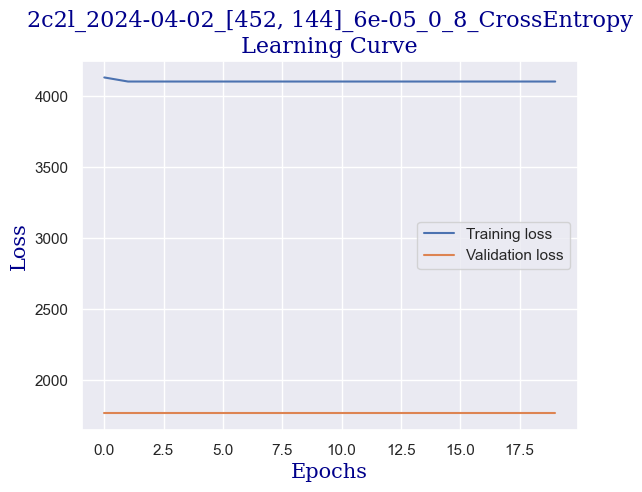

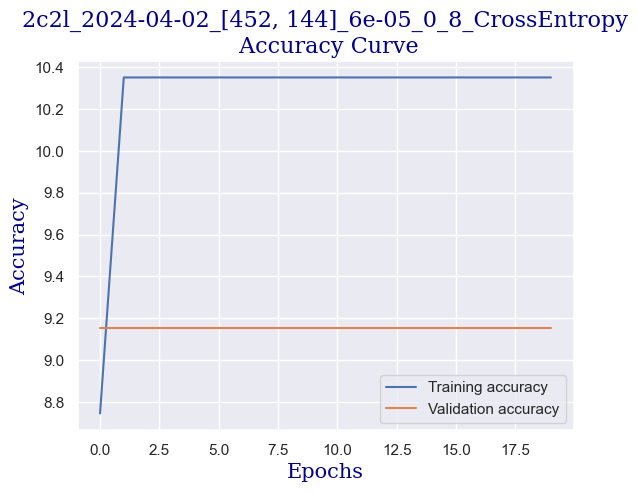

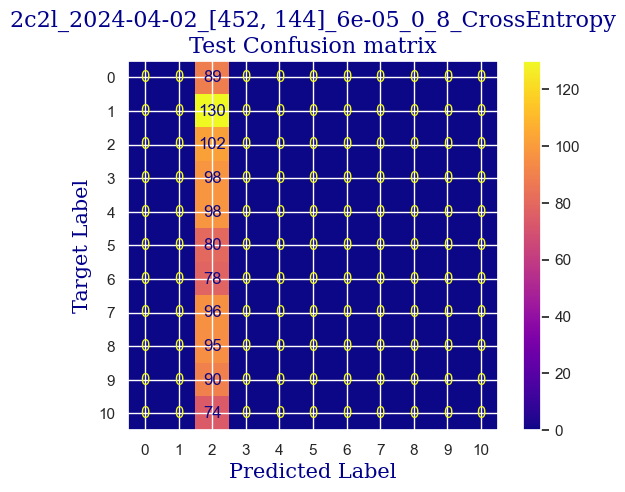

 
 END 2c2l [452, 144] Run Time:  6125.196900810995
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
61128.311023292
61116.981947864
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.387864366448543
validating...


  5%|██▎                                          | 1/20 [00:34<11:02, 34.85s/it]

validation accuracy:  7.212205270457697
Training...
train accuracy:  11.481261154074955
validating...


 10%|████▌                                        | 2/20 [01:09<10:29, 34.95s/it]

validation accuracy:  16.78224687933426
Training...
train accuracy:  18.500892325996432
validating...


 15%|██████▊                                      | 3/20 [01:44<09:53, 34.88s/it]

validation accuracy:  28.71012482662968
Training...
train accuracy:  37.65615704937537
validating...


 20%|█████████                                    | 4/20 [02:19<09:17, 34.87s/it]

validation accuracy:  33.42579750346741
Training...
train accuracy:  49.55383700178465
validating...


 25%|███████████▎                                 | 5/20 [02:54<08:42, 34.82s/it]

validation accuracy:  39.528432732316226
Training...
train accuracy:  57.10886377156454
validating...


 30%|█████████████▌                               | 6/20 [03:29<08:07, 34.83s/it]

validation accuracy:  38.28016643550624
Training...
train accuracy:  61.98691255205235
validating...


 35%|███████████████▋                             | 7/20 [04:03<07:32, 34.83s/it]

validation accuracy:  41.05409153952843
Training...
train accuracy:  65.19928613920285
validating...


 40%|██████████████████                           | 8/20 [04:38<06:57, 34.79s/it]

validation accuracy:  40.77669902912621
Training...
train accuracy:  67.99524092801904
validating...


 45%|████████████████████▎                        | 9/20 [05:13<06:22, 34.79s/it]

validation accuracy:  43.41192787794729
Training...
train accuracy:  69.18500892325996
validating...


 50%|██████████████████████                      | 10/20 [05:48<05:48, 34.82s/it]

validation accuracy:  42.0249653259362
Training...
train accuracy:  70.73170731707317
validating...


 55%|████████████████████████▏                   | 11/20 [06:23<05:13, 34.79s/it]

validation accuracy:  44.24410540915395
Training...
train accuracy:  71.62403331350387
validating...


 60%|██████████████████████████▍                 | 12/20 [06:57<04:38, 34.81s/it]

validation accuracy:  44.521497919556175
Training...
train accuracy:  71.98096371207615
validating...


 65%|████████████████████████████▌               | 13/20 [07:32<04:03, 34.83s/it]

validation accuracy:  42.857142857142854
Training...
train accuracy:  72.75431290898274
validating...


 70%|██████████████████████████████▊             | 14/20 [08:07<03:28, 34.83s/it]

validation accuracy:  42.71844660194174
Training...
train accuracy:  73.28970850684117
validating...


 75%|█████████████████████████████████           | 15/20 [08:42<02:54, 34.82s/it]

validation accuracy:  42.44105409153953
Training...
train accuracy:  74.89589530041641
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:17<02:19, 34.86s/it]

validation accuracy:  44.10540915395285
Training...
train accuracy:  76.26412849494348
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:52<01:44, 34.81s/it]

validation accuracy:  45.35367545076283
Training...
train accuracy:  78.94110648423558
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:27<01:09, 34.86s/it]

validation accuracy:  46.87933425797504
Training...
train accuracy:  79.53599048185603
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:01<00:34, 34.81s/it]

validation accuracy:  43.96671289875174
Training...
train accuracy:  81.9155264723379
validating...


100%|████████████████████████████████████████████| 20/20 [11:36<00:00, 34.83s/it]

validation accuracy:  47.156726768377254
Testing...


 
 train acc:  81.9155264723379
 
 val acc:  47.156726768377254
 
 test acc:  39.80582524271845


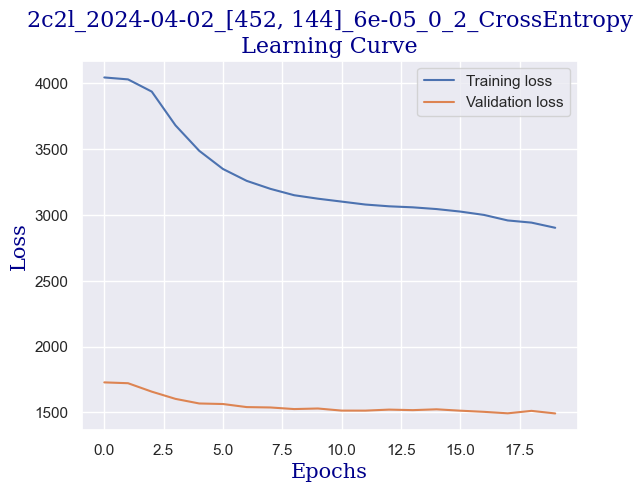

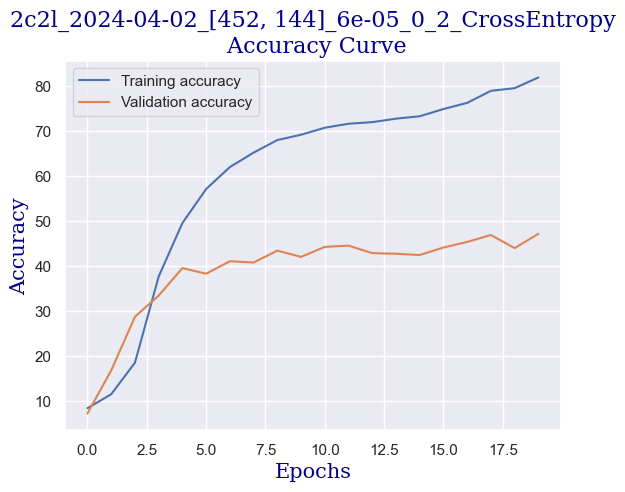

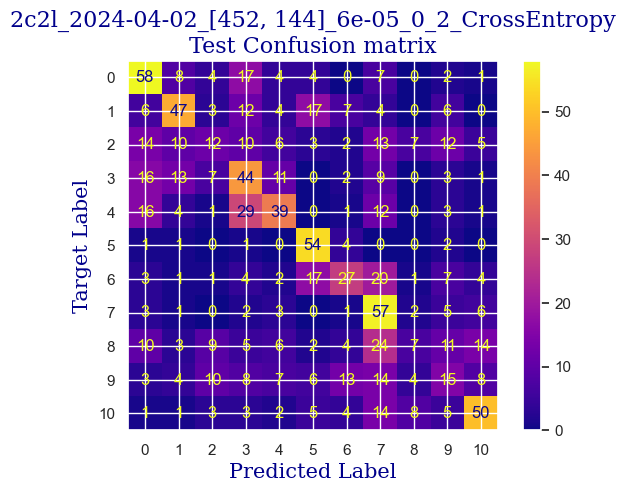

 
 END 2c2l [452, 144] Run Time:  6132.8483418889955
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
67261.160256169
67249.83117158801
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.280190362879239
validating...


  5%|██▎                                          | 1/20 [00:34<11:01, 34.80s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  13.444378346222486
validating...


 10%|████▌                                        | 2/20 [01:09<10:27, 34.86s/it]

validation accuracy:  18.58529819694868
Training...
train accuracy:  24.33075550267698
validating...


 15%|██████▊                                      | 3/20 [01:44<09:51, 34.80s/it]

validation accuracy:  24.410540915395284
Training...
train accuracy:  36.109458655562165
validating...


 20%|█████████                                    | 4/20 [02:19<09:16, 34.75s/it]

validation accuracy:  27.739251040221912
Training...
train accuracy:  43.01011302795955
validating...


 25%|███████████▎                                 | 5/20 [02:53<08:41, 34.78s/it]

validation accuracy:  31.345353675450767
Training...
train accuracy:  48.66151100535396
validating...


 30%|█████████████▌                               | 6/20 [03:28<08:07, 34.79s/it]

validation accuracy:  31.622746185852986
Training...
train accuracy:  53.004164187983335
validating...


 35%|███████████████▋                             | 7/20 [04:03<07:32, 34.78s/it]

validation accuracy:  31.761442441054093
Training...
train accuracy:  56.2760261748959
validating...


 40%|██████████████████                           | 8/20 [04:38<06:57, 34.76s/it]

validation accuracy:  35.50624133148405
Training...
train accuracy:  60.142772159428915
validating...


 45%|████████████████████▎                        | 9/20 [05:13<06:22, 34.77s/it]

validation accuracy:  35.50624133148405
Training...
train accuracy:  61.74895895300416
validating...


 50%|██████████████████████                      | 10/20 [05:47<05:47, 34.77s/it]

validation accuracy:  33.287101248266296
Training...
train accuracy:  63.652587745389646
validating...


 55%|████████████████████████▏                   | 11/20 [06:22<05:12, 34.75s/it]

validation accuracy:  35.92233009708738
Training...
train accuracy:  64.54491374182034
validating...


 60%|██████████████████████████▍                 | 12/20 [06:57<04:38, 34.81s/it]

validation accuracy:  37.03190013869626
Training...
train accuracy:  67.45984533016062
validating...


 65%|████████████████████████████▌               | 13/20 [07:32<04:04, 34.88s/it]

validation accuracy:  39.389736477115115
Training...
train accuracy:  67.16240333135039
validating...


 70%|██████████████████████████████▊             | 14/20 [08:07<03:28, 34.82s/it]

validation accuracy:  37.86407766990291
Training...
train accuracy:  69.42296252230815
validating...


 75%|█████████████████████████████████           | 15/20 [08:41<02:54, 34.80s/it]

validation accuracy:  39.25104022191401
Training...
train accuracy:  70.19631171921475
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:16<02:19, 34.78s/it]

validation accuracy:  39.25104022191401
Training...
train accuracy:  71.50505651397977
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:51<01:44, 34.80s/it]

validation accuracy:  38.41886269070735
Training...
train accuracy:  72.63533610945866
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:26<01:09, 34.81s/it]

validation accuracy:  38.141470180305134
Training...
train accuracy:  72.93277810826889
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:01<00:34, 34.78s/it]

validation accuracy:  39.80582524271845
Training...
train accuracy:  73.34919690660321
validating...


100%|████████████████████████████████████████████| 20/20 [11:35<00:00, 34.79s/it]

validation accuracy:  39.528432732316226
Testing...


 
 train acc:  73.34919690660321
 
 val acc:  39.528432732316226
 
 test acc:  36.50485436893204


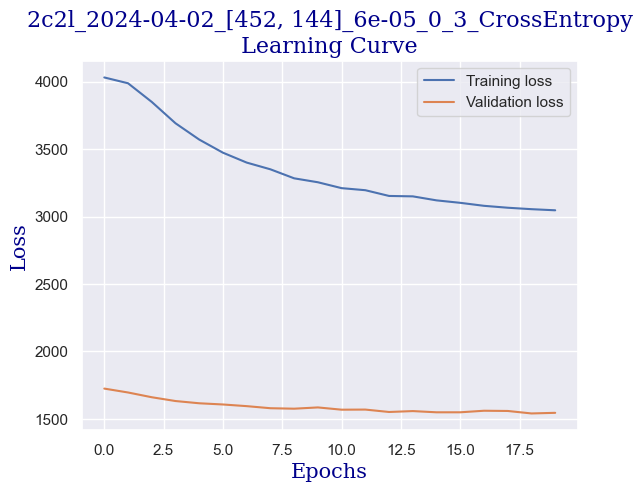

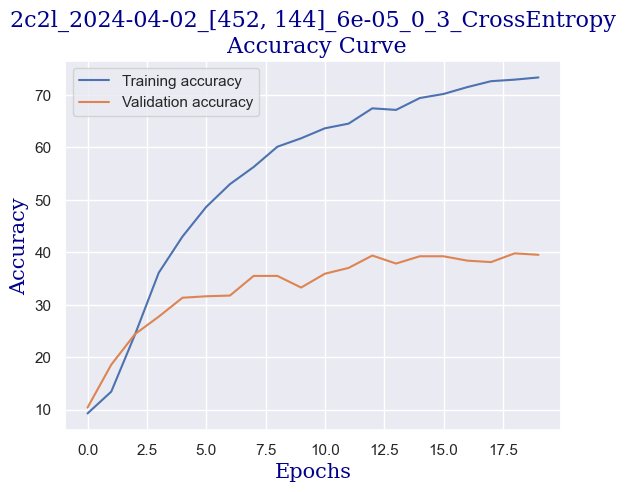

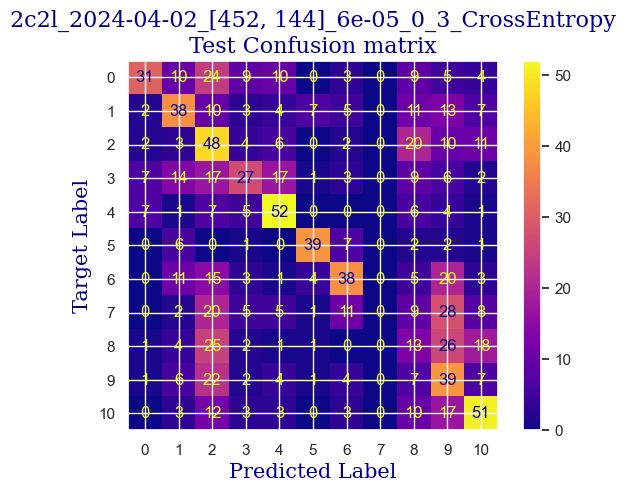

 
 END 2c2l [452, 144] Run Time:  6102.84073380701
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
73364.001986786
73352.67290429001
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.518143961927423
validating...


  5%|██▎                                          | 1/20 [00:34<10:54, 34.46s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.291493158834028
validating...


 10%|████▌                                        | 2/20 [01:09<10:21, 34.51s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 15%|██████▊                                      | 3/20 [01:43<09:48, 34.61s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 20%|█████████                                    | 4/20 [02:18<09:15, 34.71s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 25%|███████████▎                                 | 5/20 [02:53<08:40, 34.70s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.291493158834028
validating...


 30%|█████████████▌                               | 6/20 [03:27<08:05, 34.70s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.291493158834028
validating...


 35%|███████████████▋                             | 7/20 [04:02<07:30, 34.66s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.053539559785841
validating...


 40%|██████████████████                           | 8/20 [04:37<06:55, 34.65s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 45%|████████████████████▎                        | 9/20 [05:11<06:21, 34.65s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 50%|██████████████████████                      | 10/20 [05:46<05:46, 34.65s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.291493158834028
validating...


 55%|████████████████████████▏                   | 11/20 [06:21<05:12, 34.68s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 60%|██████████████████████████▍                 | 12/20 [06:56<04:37, 34.73s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.053539559785841
validating...


 65%|████████████████████████████▌               | 13/20 [07:30<04:03, 34.74s/it]

validation accuracy:  9.70873786407767
Training...
train accuracy:  9.994051160023796
validating...


 70%|██████████████████████████████▊             | 14/20 [08:05<03:28, 34.79s/it]

validation accuracy:  9.70873786407767
Training...
train accuracy:  11.302795954788817
validating...


 75%|█████████████████████████████████           | 15/20 [08:40<02:53, 34.80s/it]

validation accuracy:  19.27877947295423
Training...
train accuracy:  23.31945270672219
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:15<02:19, 34.80s/it]

validation accuracy:  28.01664355062413
Training...
train accuracy:  38.54848304580607
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:50<01:44, 34.78s/it]

validation accuracy:  31.622746185852986
Training...
train accuracy:  50.98155859607376
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:24<01:09, 34.79s/it]

validation accuracy:  38.41886269070735
Training...
train accuracy:  58.536585365853654
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [10:59<00:34, 34.79s/it]

validation accuracy:  37.03190013869626
Training...
train accuracy:  65.49672813801308
validating...


100%|████████████████████████████████████████████| 20/20 [11:34<00:00, 34.73s/it]

validation accuracy:  40.36061026352289
Testing...


 
 train acc:  65.49672813801308
 
 val acc:  40.36061026352289
 
 test acc:  39.126213592233015


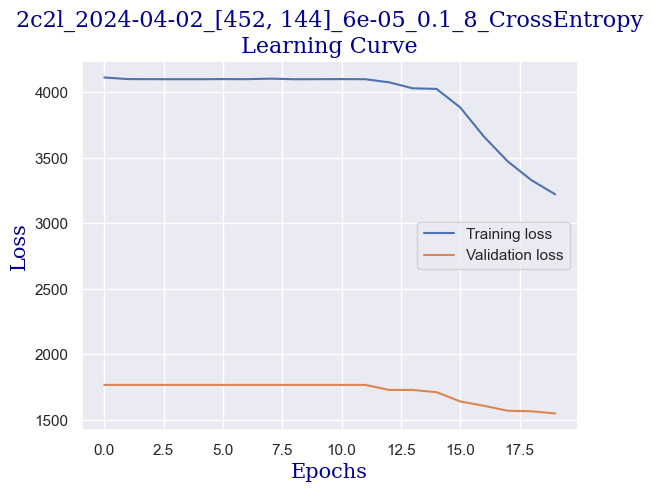

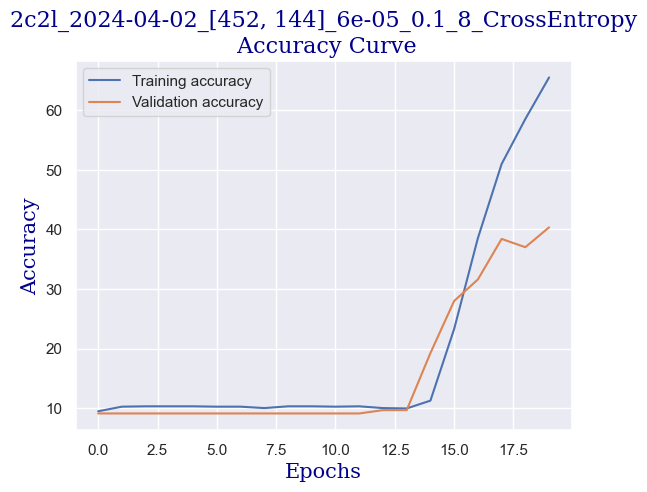

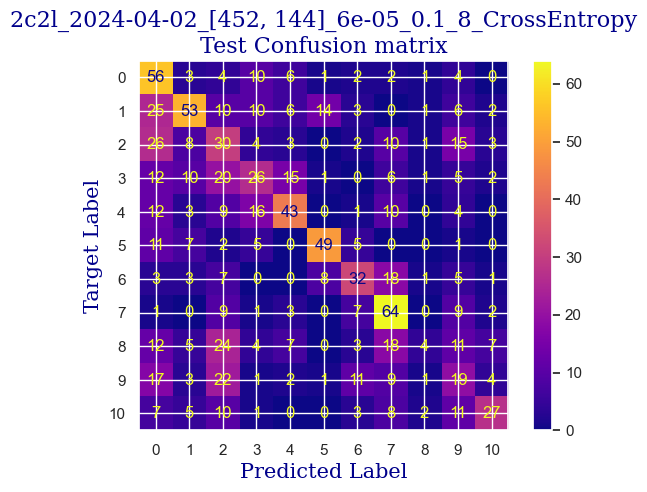

 
 END 2c2l [452, 144] Run Time:  6114.540077931
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
79478.542966994
79467.21388568901
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.637120761451518
validating...


  5%|██▎                                          | 1/20 [00:34<11:02, 34.85s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.302795954788817
validating...


 10%|████▌                                        | 2/20 [01:09<10:26, 34.83s/it]

validation accuracy:  14.979195561719832
Training...
train accuracy:  19.80963712076145
validating...


 15%|██████▊                                      | 3/20 [01:44<09:52, 34.85s/it]

validation accuracy:  26.768377253814148
Training...
train accuracy:  32.42117787031529
validating...


 20%|█████████                                    | 4/20 [02:19<09:17, 34.86s/it]

validation accuracy:  32.87101248266297
Training...
train accuracy:  41.99881023200476
validating...


 25%|███████████▎                                 | 5/20 [02:54<08:43, 34.89s/it]

validation accuracy:  35.22884882108183
Training...
train accuracy:  49.91076740035693
validating...


 30%|█████████████▌                               | 6/20 [03:29<08:07, 34.85s/it]

validation accuracy:  41.33148404993065
Training...
train accuracy:  56.39500297441998
validating...


 35%|███████████████▋                             | 7/20 [04:03<07:32, 34.81s/it]

validation accuracy:  41.33148404993065
Training...
train accuracy:  61.035098155859615
validating...


 40%|██████████████████                           | 8/20 [04:38<06:57, 34.80s/it]

validation accuracy:  42.302357836338416
Training...
train accuracy:  63.5930993456276
validating...


 45%|████████████████████▎                        | 9/20 [05:13<06:22, 34.80s/it]

validation accuracy:  45.35367545076283
Training...
train accuracy:  68.23319452706723
validating...


 50%|██████████████████████                      | 10/20 [05:48<05:48, 34.81s/it]

validation accuracy:  44.79889042995839
Training...
train accuracy:  68.88756692444973
validating...


 55%|████████████████████████▏                   | 11/20 [06:23<05:13, 34.82s/it]

validation accuracy:  42.0249653259362
Training...
train accuracy:  71.32659131469363
validating...


 60%|██████████████████████████▍                 | 12/20 [06:58<04:39, 34.88s/it]

validation accuracy:  42.995839112343965
Training...
train accuracy:  72.63533610945866
validating...


 65%|████████████████████████████▌               | 13/20 [07:32<04:03, 34.85s/it]

validation accuracy:  45.90846047156727
Training...
train accuracy:  75.2528256989887
validating...


 70%|██████████████████████████████▊             | 14/20 [08:07<03:29, 34.86s/it]

validation accuracy:  41.74757281553398
Training...
train accuracy:  74.95538370017847
validating...


 75%|█████████████████████████████████           | 15/20 [08:42<02:54, 34.81s/it]

validation accuracy:  43.828016643550626
Training...
train accuracy:  74.95538370017847
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:17<02:19, 34.82s/it]

validation accuracy:  43.27323162274618
Training...
train accuracy:  76.97798929208804
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:52<01:44, 34.82s/it]

validation accuracy:  47.01803051317614
Training...
train accuracy:  77.21594289113622
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:26<01:09, 34.82s/it]

validation accuracy:  45.214979195561725
Training...
train accuracy:  77.33491969066031
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:01<00:34, 34.82s/it]

validation accuracy:  45.49237170596394
Training...
train accuracy:  77.87031528851874
validating...


100%|████████████████████████████████████████████| 20/20 [11:36<00:00, 34.83s/it]

validation accuracy:  46.3245492371706
Testing...


 
 train acc:  77.87031528851874
 
 val acc:  46.3245492371706
 
 test acc:  43.30097087378641


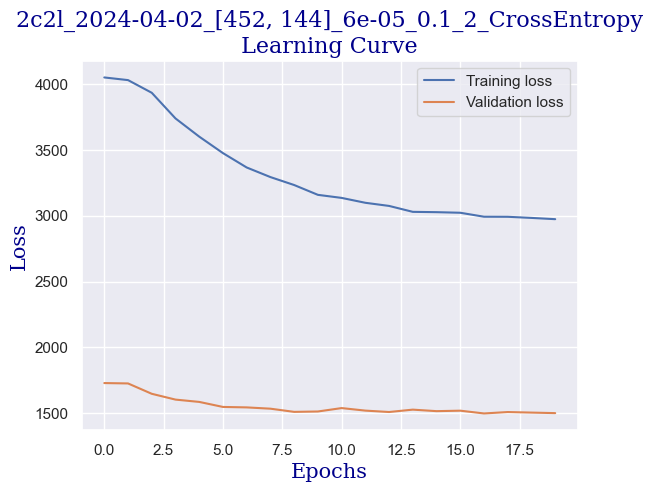

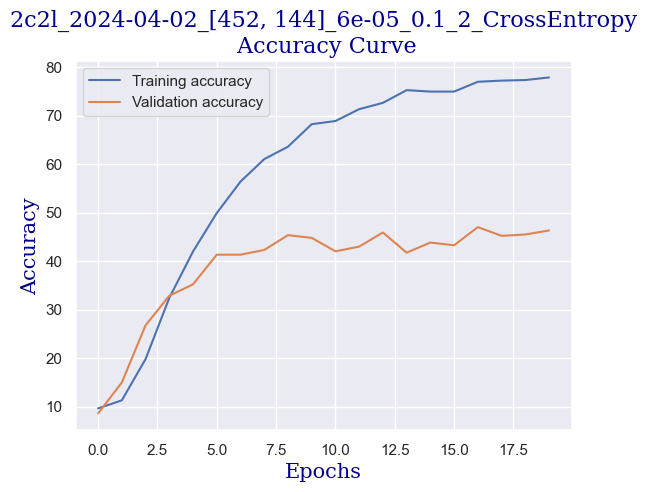

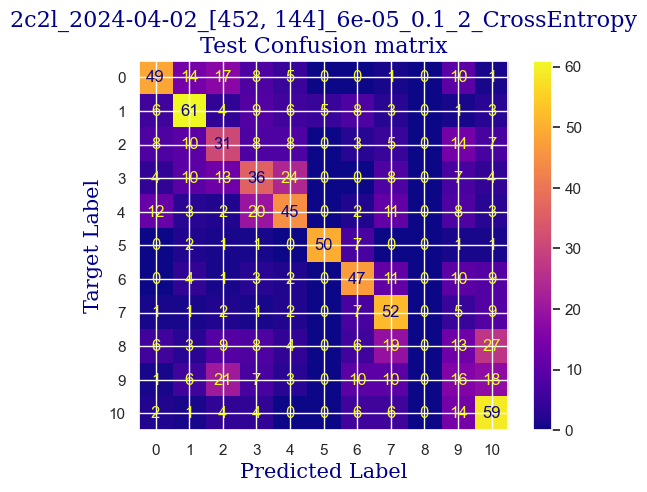

 
 END 2c2l [452, 144] Run Time:  6114.677691587
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
85593.222033857
85581.892967184
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  11.06484235574063
validating...


  5%|██▎                                          | 1/20 [00:34<11:00, 34.75s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.113027959547887
validating...


 10%|████▌                                        | 2/20 [01:09<10:28, 34.89s/it]

validation accuracy:  11.789181692094314
Training...
train accuracy:  13.027959547888162
validating...


 15%|██████▊                                      | 3/20 [01:44<09:52, 34.86s/it]

validation accuracy:  15.672676837725383
Training...
train accuracy:  25.520523497917907
validating...


 20%|█████████                                    | 4/20 [02:19<09:17, 34.83s/it]

validation accuracy:  22.052704576976424
Training...
train accuracy:  36.16894705532421
validating...


 25%|███████████▎                                 | 5/20 [02:54<08:43, 34.89s/it]

validation accuracy:  27.045769764216367
Training...
train accuracy:  44.37834622248661
validating...


 30%|█████████████▌                               | 6/20 [03:29<08:08, 34.87s/it]

validation accuracy:  24.549237170596395
Training...
train accuracy:  48.78048780487805
validating...


 35%|███████████████▋                             | 7/20 [04:03<07:32, 34.82s/it]

validation accuracy:  32.31622746185853
Training...
train accuracy:  54.01546698393813
validating...


 40%|██████████████████                           | 8/20 [04:38<06:57, 34.82s/it]

validation accuracy:  34.95145631067961
Training...
train accuracy:  56.39500297441998
validating...


 45%|████████████████████▎                        | 9/20 [05:13<06:22, 34.79s/it]

validation accuracy:  34.11927877947296
Training...
train accuracy:  58.89351576442594
validating...


 50%|██████████████████████                      | 10/20 [05:48<05:47, 34.77s/it]

validation accuracy:  34.25797503467407
Training...
train accuracy:  62.0464009518144
validating...


 55%|████████████████████████▏                   | 11/20 [06:22<05:13, 34.78s/it]

validation accuracy:  33.70319001386963
Training...
train accuracy:  63.53361094586556
validating...


 60%|██████████████████████████▍                 | 12/20 [06:57<04:38, 34.78s/it]

validation accuracy:  33.287101248266296
Training...
train accuracy:  65.02082093991672
validating...


 65%|████████████████████████████▌               | 13/20 [07:32<04:03, 34.78s/it]

validation accuracy:  36.754507628294036
Training...
train accuracy:  67.99524092801904
validating...


 70%|██████████████████████████████▊             | 14/20 [08:07<03:28, 34.79s/it]

validation accuracy:  37.447988904299585
Training...
train accuracy:  68.17370612730518
validating...


 75%|█████████████████████████████████           | 15/20 [08:42<02:53, 34.79s/it]

validation accuracy:  34.535367545076284
Training...
train accuracy:  70.07733491969066
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:16<02:19, 34.81s/it]

validation accuracy:  36.615811373092924
Training...
train accuracy:  71.68352171326592
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:51<01:44, 34.83s/it]

validation accuracy:  34.535367545076284
Training...
train accuracy:  72.93277810826889
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:26<01:09, 34.80s/it]

validation accuracy:  40.77669902912621
Training...
train accuracy:  74.06305770374777
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:01<00:34, 34.83s/it]

validation accuracy:  38.141470180305134
Training...
train accuracy:  74.71743010113028
validating...


100%|████████████████████████████████████████████| 20/20 [11:36<00:00, 34.81s/it]

validation accuracy:  37.309292649098474
Testing...


 
 train acc:  74.71743010113028
 
 val acc:  37.309292649098474
 
 test acc:  35.43689320388349


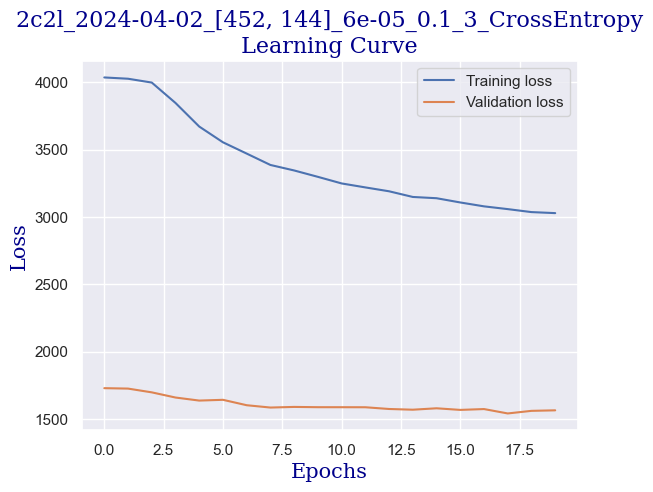

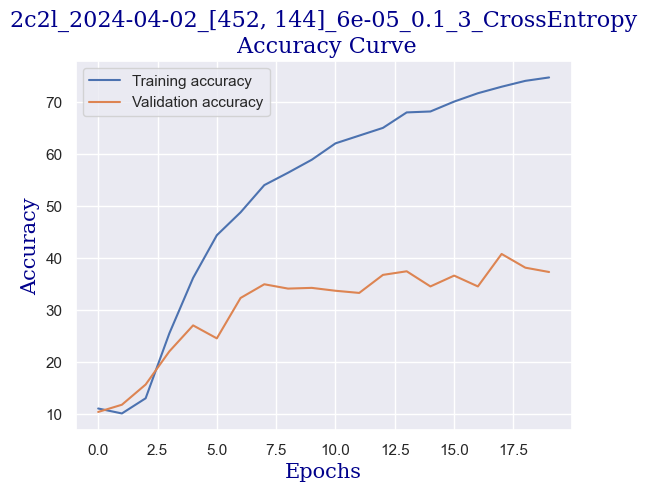

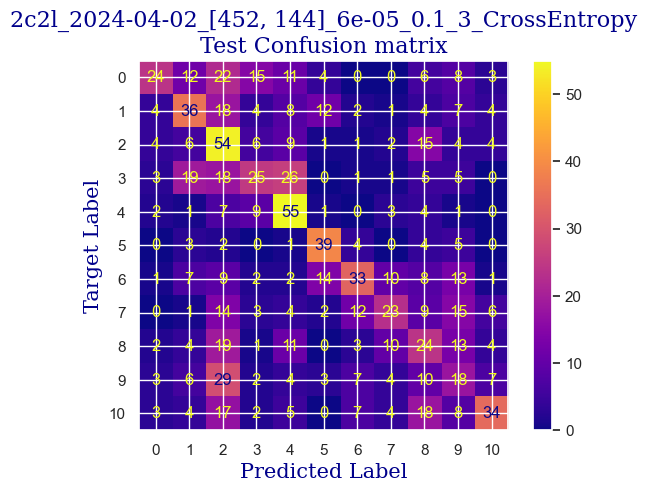

 
 END 2c2l [452, 144] Run Time:  6119.7207470680005
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
91712.944041818
91701.61496147701
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  7.079119571683521
validating...


  5%|██▎                                          | 1/20 [00:34<11:00, 34.76s/it]

validation accuracy:  8.460471567267684
Training...
train accuracy:  9.1017251635931
validating...


 10%|████▌                                        | 2/20 [01:09<10:28, 34.90s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.886377156454492
validating...


 15%|██████▊                                      | 3/20 [01:44<09:52, 34.88s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  14.991076740035695
validating...


 20%|█████████                                    | 4/20 [02:19<09:17, 34.86s/it]

validation accuracy:  19.972260748959776
Training...
train accuracy:  24.806662700773348
validating...


 25%|███████████▎                                 | 5/20 [02:54<08:43, 34.90s/it]

validation accuracy:  25.381414701803052
Training...
train accuracy:  32.897085068411656
validating...


 30%|█████████████▌                               | 6/20 [03:29<08:08, 34.86s/it]

validation accuracy:  30.235783633841883
Training...
train accuracy:  39.14336704342653
validating...


 35%|███████████████▋                             | 7/20 [04:04<07:33, 34.87s/it]

validation accuracy:  32.17753120665742
Training...
train accuracy:  43.24806662700773
validating...


 40%|██████████████████                           | 8/20 [04:38<06:58, 34.84s/it]

validation accuracy:  33.14840499306519
Training...
train accuracy:  46.22248661511005
validating...


 45%|████████████████████▎                        | 9/20 [05:13<06:22, 34.80s/it]

validation accuracy:  33.42579750346741
Training...
train accuracy:  49.196906603212376
validating...


 50%|██████████████████████                      | 10/20 [05:48<05:47, 34.78s/it]

validation accuracy:  35.64493758668516
Training...
train accuracy:  50.32718619869125
validating...


 55%|████████████████████████▏                   | 11/20 [06:23<05:13, 34.78s/it]

validation accuracy:  34.95145631067961
Training...
train accuracy:  53.004164187983335
validating...


 60%|██████████████████████████▍                 | 12/20 [06:57<04:38, 34.77s/it]

validation accuracy:  35.78363384188627
Training...
train accuracy:  54.66983938132064
validating...


 65%|████████████████████████████▌               | 13/20 [07:32<04:03, 34.78s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  58.12016656751934
validating...


 70%|██████████████████████████████▊             | 14/20 [08:07<03:28, 34.82s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  56.930398572278406
validating...


 75%|█████████████████████████████████           | 15/20 [08:42<02:54, 34.81s/it]

validation accuracy:  39.80582524271845
Training...
train accuracy:  59.42891136228435
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:17<02:19, 34.79s/it]

validation accuracy:  39.1123439667129
Training...
train accuracy:  60.08328375966686
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:51<01:44, 34.82s/it]

validation accuracy:  39.389736477115115
Training...
train accuracy:  61.1540749553837
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:26<01:09, 34.81s/it]

validation accuracy:  38.69625520110957
Training...
train accuracy:  61.68947055324212
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:01<00:34, 34.80s/it]

validation accuracy:  40.221914008321775
Training...
train accuracy:  64.06900654372397
validating...


100%|████████████████████████████████████████████| 20/20 [11:36<00:00, 34.82s/it]

validation accuracy:  39.1123439667129
Testing...


 
 train acc:  64.06900654372397
 
 val acc:  39.1123439667129
 
 test acc:  37.37864077669903


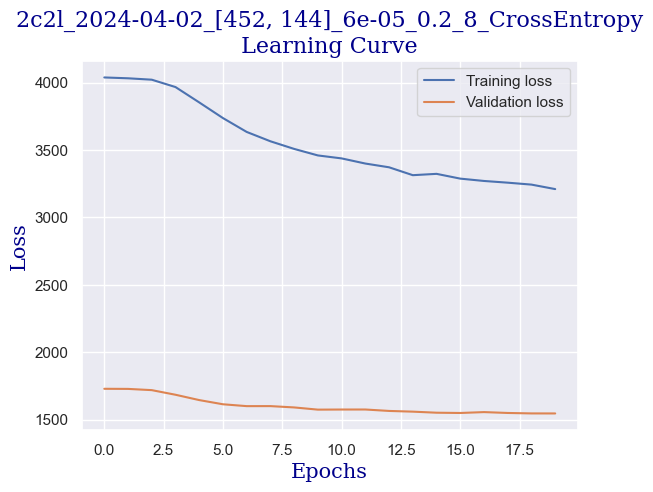

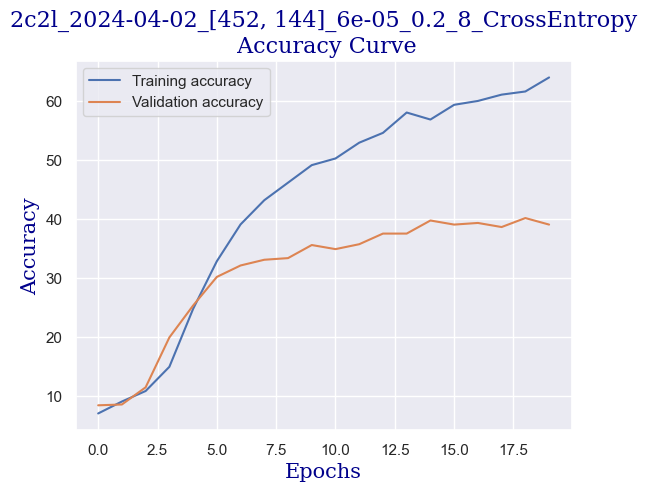

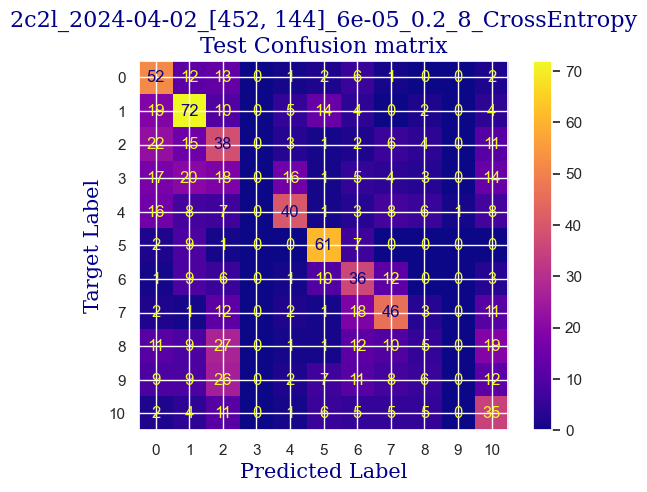

 
 END 2c2l [452, 144] Run Time:  6101.8398790079955
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
97814.785284634
97803.456198614
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.518143961927423
validating...


  5%|██▎                                          | 1/20 [00:34<10:59, 34.70s/it]

validation accuracy:  11.095700416088766
Training...
train accuracy:  18.79833432480666
validating...


 10%|████▌                                        | 2/20 [01:09<10:26, 34.78s/it]

validation accuracy:  26.49098474341193
Training...
train accuracy:  35.39559785841761
validating...


 15%|██████▊                                      | 3/20 [01:44<09:52, 34.83s/it]

validation accuracy:  31.900138696255205
Training...
train accuracy:  45.92504461629982
validating...


 20%|█████████                                    | 4/20 [02:19<09:16, 34.80s/it]

validation accuracy:  33.00970873786408
Training...
train accuracy:  51.45746579417013
validating...


 25%|███████████▎                                 | 5/20 [02:53<08:41, 34.79s/it]

validation accuracy:  36.754507628294036
Training...
train accuracy:  56.69244497323022
validating...


 30%|█████████████▌                               | 6/20 [03:28<08:06, 34.77s/it]

validation accuracy:  36.47711511789182
Training...
train accuracy:  59.60737656157049
validating...


 35%|███████████████▋                             | 7/20 [04:03<07:31, 34.75s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  62.522308149910764
validating...


 40%|██████████████████                           | 8/20 [04:38<06:56, 34.71s/it]

validation accuracy:  36.615811373092924
Training...
train accuracy:  65.79417013682331
validating...


 45%|████████████████████▎                        | 9/20 [05:12<06:21, 34.70s/it]

validation accuracy:  39.1123439667129
Training...
train accuracy:  66.86496133254015
validating...


 50%|██████████████████████                      | 10/20 [05:47<05:47, 34.74s/it]

validation accuracy:  39.80582524271845
Training...
train accuracy:  69.89886972040452
validating...


 55%|████████████████████████▏                   | 11/20 [06:22<05:12, 34.75s/it]

validation accuracy:  40.36061026352289
Training...
train accuracy:  71.86198691255206
validating...


 60%|██████████████████████████▍                 | 12/20 [06:57<04:38, 34.78s/it]

validation accuracy:  38.00277392510402
Training...
train accuracy:  73.64663890541344
validating...


 65%|████████████████████████████▌               | 13/20 [07:31<04:03, 34.78s/it]

validation accuracy:  38.28016643550624
Training...
train accuracy:  75.49077929803688
validating...


 70%|██████████████████████████████▊             | 14/20 [08:06<03:28, 34.76s/it]

validation accuracy:  39.528432732316226
Training...
train accuracy:  75.84770969660916
validating...


 75%|█████████████████████████████████           | 15/20 [08:41<02:53, 34.74s/it]

validation accuracy:  40.083217753120664
Training...
train accuracy:  77.27543129089828
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:16<02:19, 34.77s/it]

validation accuracy:  41.33148404993065
Training...
train accuracy:  78.04878048780488
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:50<01:44, 34.76s/it]

validation accuracy:  40.77669902912621
Training...
train accuracy:  79.06008328375967
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:25<01:09, 34.75s/it]

validation accuracy:  42.857142857142854
Training...
train accuracy:  79.41701368233196
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:00<00:34, 34.74s/it]

validation accuracy:  43.13453536754508
Training...
train accuracy:  80.9042236763831
validating...


100%|████████████████████████████████████████████| 20/20 [11:35<00:00, 34.76s/it]

validation accuracy:  43.828016643550626
Testing...


 
 train acc:  80.9042236763831
 
 val acc:  43.828016643550626
 
 test acc:  38.05825242718446


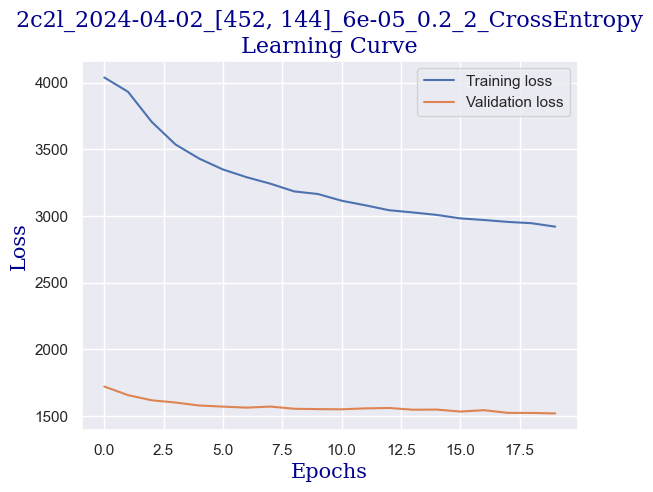

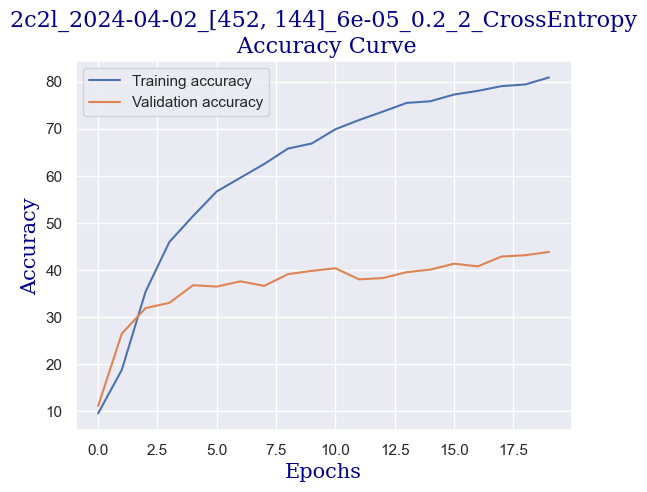

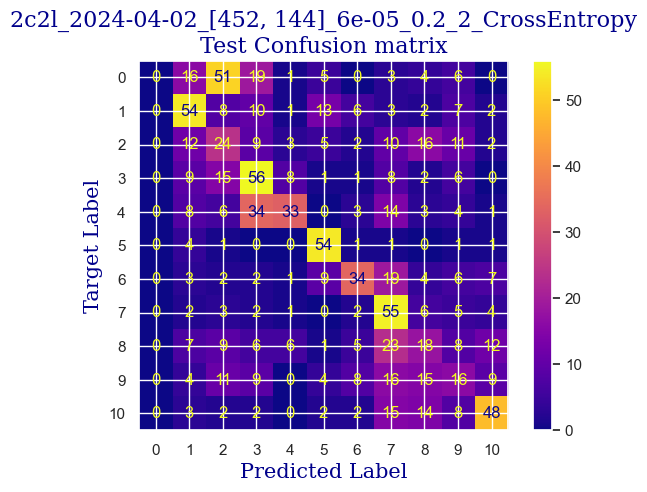

 
 END 2c2l [452, 144] Run Time:  6098.443735467008
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
103913.230026593
103901.900938893
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.280190362879239
validating...


  5%|██▎                                          | 1/20 [00:34<11:01, 34.81s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  9.57763236168947
validating...


 10%|████▌                                        | 2/20 [01:09<10:27, 34.85s/it]

validation accuracy:  9.847434119278779
Training...
train accuracy:  14.217727543129092
validating...


 15%|██████▊                                      | 3/20 [01:44<09:51, 34.80s/it]

validation accuracy:  17.337031900138697
Training...
train accuracy:  24.628197501487207
validating...


 20%|█████████                                    | 4/20 [02:19<09:17, 34.86s/it]

validation accuracy:  24.549237170596395
Training...
train accuracy:  35.455086258179655
validating...


 25%|███████████▎                                 | 5/20 [02:54<08:42, 34.85s/it]

validation accuracy:  30.929264909847433
Training...
train accuracy:  42.83164782867341
validating...


 30%|█████████████▌                               | 6/20 [03:28<08:07, 34.83s/it]

validation accuracy:  34.39667128987517
Training...
train accuracy:  49.07792980368828
validating...


 35%|███████████████▋                             | 7/20 [04:03<07:32, 34.84s/it]

validation accuracy:  38.141470180305134
Training...
train accuracy:  54.6103509815586
validating...


 40%|██████████████████                           | 8/20 [04:38<06:58, 34.83s/it]

validation accuracy:  38.141470180305134
Training...
train accuracy:  58.77453896490184
validating...


 45%|████████████████████▎                        | 9/20 [05:13<06:22, 34.79s/it]

validation accuracy:  40.36061026352289
Training...
train accuracy:  61.27305175490779
validating...


 50%|██████████████████████                      | 10/20 [05:48<05:47, 34.77s/it]

validation accuracy:  39.1123439667129
Training...
train accuracy:  63.950029744199874
validating...


 55%|████████████████████████▏                   | 11/20 [06:22<05:12, 34.76s/it]

validation accuracy:  40.221914008321775
Training...
train accuracy:  66.21058893515765
validating...


 60%|██████████████████████████▍                 | 12/20 [06:57<04:38, 34.77s/it]

validation accuracy:  40.49930651872399
Training...
train accuracy:  67.28138013087448
validating...


 65%|████████████████████████████▌               | 13/20 [07:32<04:03, 34.83s/it]

validation accuracy:  38.41886269070735
Training...
train accuracy:  67.45984533016062
validating...


 70%|██████████████████████████████▊             | 14/20 [08:07<03:28, 34.82s/it]

validation accuracy:  38.28016643550624
Training...
train accuracy:  69.54193932183225
validating...


 75%|█████████████████████████████████           | 15/20 [08:42<02:53, 34.80s/it]

validation accuracy:  39.25104022191401
Training...
train accuracy:  70.73170731707317
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:16<02:19, 34.80s/it]

validation accuracy:  38.141470180305134
Training...
train accuracy:  71.68352171326592
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:51<01:44, 34.79s/it]

validation accuracy:  40.36061026352289
Training...
train accuracy:  72.8138013087448
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:26<01:09, 34.80s/it]

validation accuracy:  37.86407766990291
Training...
train accuracy:  74.06305770374777
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:01<00:34, 34.79s/it]

validation accuracy:  40.77669902912621
Training...
train accuracy:  74.00356930398573
validating...


100%|████████████████████████████████████████████| 20/20 [11:36<00:00, 34.81s/it]

validation accuracy:  40.49930651872399
Testing...


 
 train acc:  74.00356930398573
 
 val acc:  40.49930651872399
 
 test acc:  37.4757281553398


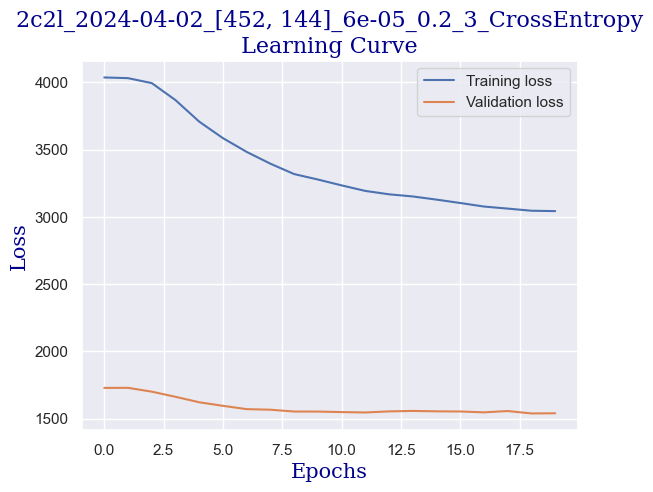

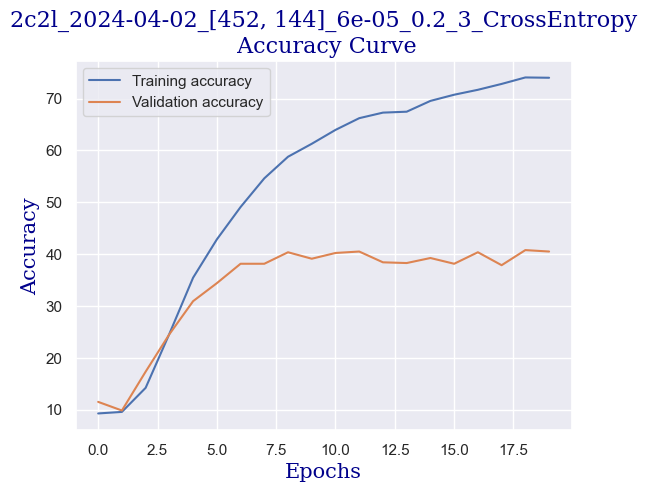

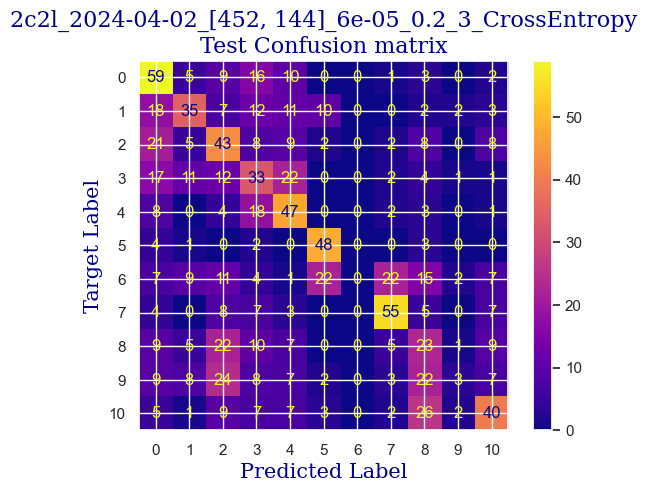

 
 END 2c2l [452, 144] Run Time:  6113.538742599005
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
110026.769981455
110015.440899266
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.74479476502082
validating...


  5%|██▎                                          | 1/20 [00:34<10:55, 34.51s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.982748364069007
validating...


 10%|████▌                                        | 2/20 [01:09<10:21, 34.50s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.982748364069007
validating...


 15%|██████▊                                      | 3/20 [01:43<09:47, 34.56s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.982748364069007
validating...


 20%|█████████                                    | 4/20 [02:18<09:14, 34.66s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.982748364069007
validating...


 25%|███████████▎                                 | 5/20 [02:52<08:39, 34.61s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.982748364069007
validating...


 30%|█████████████▌                               | 6/20 [03:27<08:04, 34.64s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.982748364069007
validating...


 35%|███████████████▋                             | 7/20 [04:02<07:30, 34.66s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.982748364069007
validating...


 40%|██████████████████                           | 8/20 [04:37<06:56, 34.74s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.982748364069007
validating...


 45%|████████████████████▎                        | 9/20 [05:12<06:22, 34.81s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.982748364069007
validating...


 50%|██████████████████████                      | 10/20 [05:47<05:48, 34.88s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.982748364069007
validating...


 55%|████████████████████████▏                   | 11/20 [06:22<05:13, 34.88s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.982748364069007
validating...


 60%|██████████████████████████▍                 | 12/20 [06:57<04:39, 34.95s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.982748364069007
validating...


 65%|████████████████████████████▌               | 13/20 [07:32<04:04, 34.95s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.982748364069007
validating...


 70%|██████████████████████████████▊             | 14/20 [08:07<03:29, 34.92s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.982748364069007
validating...


 75%|█████████████████████████████████           | 15/20 [08:41<02:54, 34.91s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.982748364069007
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:16<02:19, 34.94s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.982748364069007
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:51<01:44, 34.91s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.982748364069007
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:26<01:09, 34.94s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.982748364069007
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:01<00:34, 34.91s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.982748364069007
validating...


100%|████████████████████████████████████████████| 20/20 [11:36<00:00, 34.83s/it]

validation accuracy:  8.599167822468793
Testing...


 
 train acc:  8.982748364069007
 
 val acc:  8.599167822468793
 
 test acc:  8.737864077669903


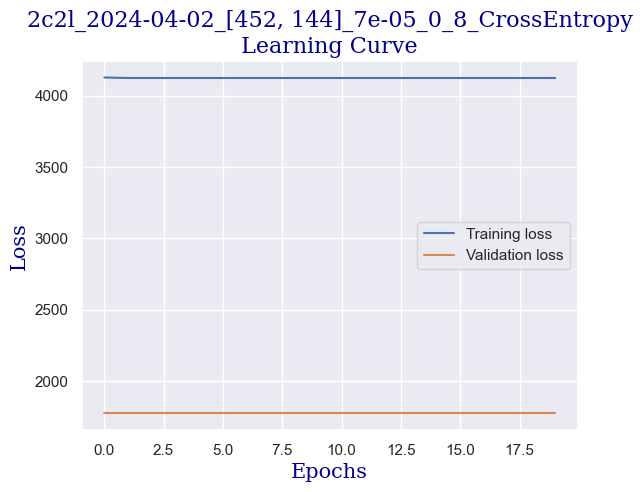

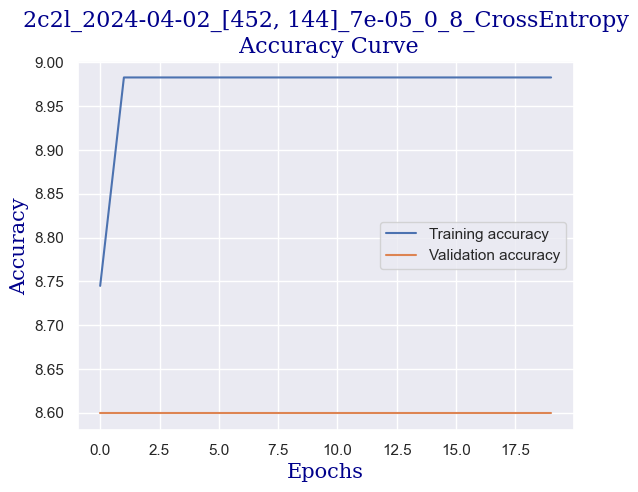

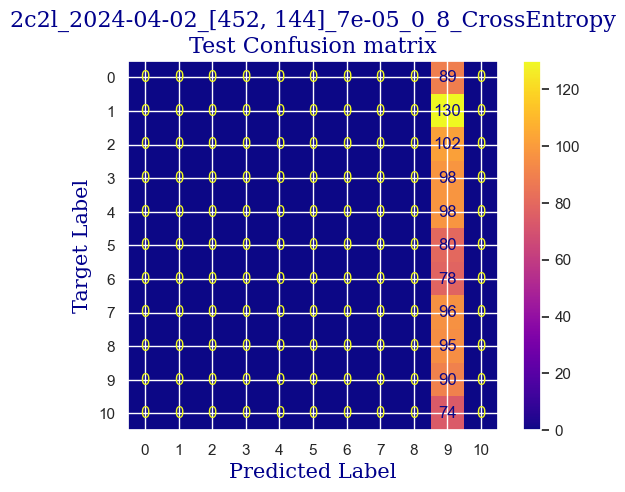

 
 END 2c2l [452, 144] Run Time:  6110.036209683007
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
116136.807141843
116125.478058704
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  10.053539559785841
validating...


  5%|██▎                                          | 1/20 [00:34<11:01, 34.82s/it]

validation accuracy:  14.285714285714285
Training...
train accuracy:  20.107079119571683
validating...


 10%|████▌                                        | 2/20 [01:09<10:28, 34.91s/it]

validation accuracy:  23.02357836338419
Training...
train accuracy:  35.27662105889352
validating...


 15%|██████▊                                      | 3/20 [01:44<09:52, 34.83s/it]

validation accuracy:  33.841886269070734
Training...
train accuracy:  48.483045806067814
validating...


 20%|█████████                                    | 4/20 [02:19<09:17, 34.83s/it]

validation accuracy:  39.25104022191401
Training...
train accuracy:  54.96728138013087
validating...


 25%|███████████▎                                 | 5/20 [02:54<08:41, 34.78s/it]

validation accuracy:  39.94452149791955
Training...
train accuracy:  59.369422962522314
validating...


 30%|█████████████▌                               | 6/20 [03:28<08:07, 34.80s/it]

validation accuracy:  41.33148404993065
Training...
train accuracy:  65.31826293872695
validating...


 35%|███████████████▋                             | 7/20 [04:03<07:32, 34.79s/it]

validation accuracy:  41.60887656033287
Training...
train accuracy:  68.29268292682927
validating...


 40%|██████████████████                           | 8/20 [04:38<06:57, 34.76s/it]

validation accuracy:  41.74757281553398
Training...
train accuracy:  70.79119571683522
validating...


 45%|████████████████████▎                        | 9/20 [05:13<06:22, 34.82s/it]

validation accuracy:  42.57975034674064
Training...
train accuracy:  73.82510410469958
validating...


 50%|██████████████████████                      | 10/20 [05:48<05:48, 34.83s/it]

validation accuracy:  43.13453536754508
Training...
train accuracy:  75.19333729922664
validating...


 55%|████████████████████████▏                   | 11/20 [06:22<05:13, 34.82s/it]

validation accuracy:  40.77669902912621
Training...
train accuracy:  76.02617489589531
validating...


 60%|██████████████████████████▍                 | 12/20 [06:57<04:38, 34.82s/it]

validation accuracy:  45.214979195561725
Training...
train accuracy:  78.52468768590126
validating...


 65%|████████████████████████████▌               | 13/20 [07:32<04:03, 34.77s/it]

validation accuracy:  41.47018030513176
Training...
train accuracy:  79.29803688280785
validating...


 70%|██████████████████████████████▊             | 14/20 [08:07<03:28, 34.81s/it]

validation accuracy:  43.828016643550626
Training...
train accuracy:  80.0118976799524
validating...


 75%|█████████████████████████████████           | 15/20 [08:42<02:53, 34.77s/it]

validation accuracy:  44.521497919556175
Training...
train accuracy:  80.96371207614516
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:16<02:19, 34.76s/it]

validation accuracy:  45.76976421636616
Training...
train accuracy:  82.92682926829268
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:51<01:44, 34.80s/it]

validation accuracy:  43.689320388349515
Training...
train accuracy:  83.4622248661511
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:26<01:09, 34.83s/it]

validation accuracy:  44.10540915395285
Training...
train accuracy:  84.41403926234385
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:01<00:34, 34.80s/it]

validation accuracy:  44.66019417475729
Training...
train accuracy:  84.1165972635336
validating...


100%|████████████████████████████████████████████| 20/20 [11:36<00:00, 34.80s/it]

validation accuracy:  44.9375866851595
Testing...


 
 train acc:  84.1165972635336
 
 val acc:  44.9375866851595
 
 test acc:  40.48543689320388


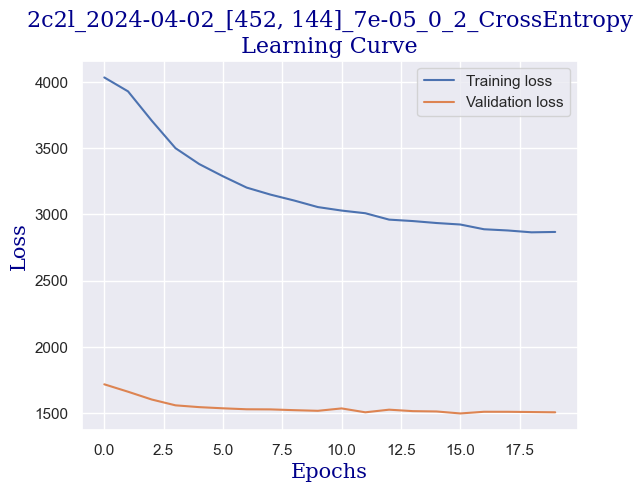

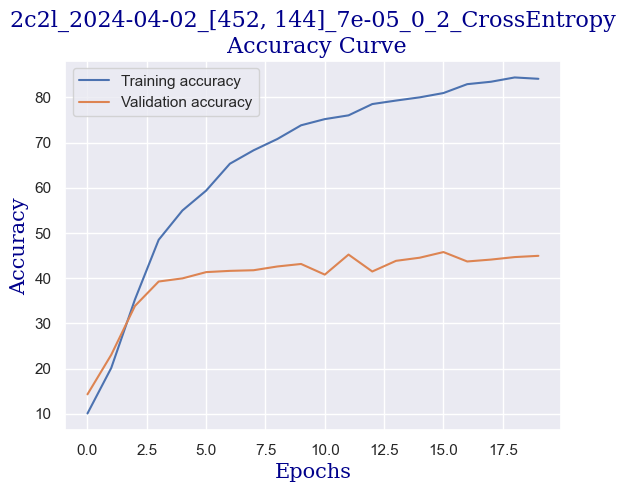

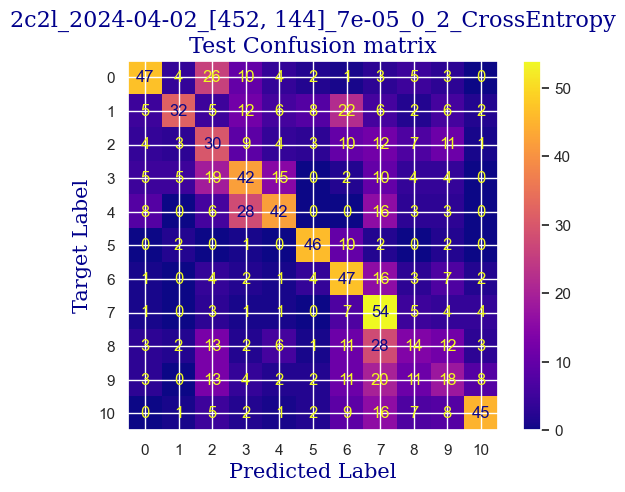

 
 END 2c2l [452, 144] Run Time:  6110.0669431259885
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
122246.875058526
122235.545978412
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  10.41046995835812
validating...


  5%|██▎                                          | 1/20 [00:34<10:57, 34.58s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  10.469958358120167
validating...


 10%|████▌                                        | 2/20 [01:09<10:22, 34.57s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  10.469958358120167
validating...


 15%|██████▊                                      | 3/20 [01:43<09:47, 34.58s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  10.469958358120167
validating...


 20%|█████████                                    | 4/20 [02:18<09:13, 34.61s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  10.469958358120167
validating...


 25%|███████████▎                                 | 5/20 [02:52<08:38, 34.60s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  10.469958358120167
validating...


 30%|█████████████▌                               | 6/20 [03:27<08:05, 34.66s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  10.469958358120167
validating...


 35%|███████████████▋                             | 7/20 [04:02<07:30, 34.62s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  9.934562760261748
validating...


 40%|██████████████████                           | 8/20 [04:36<06:55, 34.60s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.58893515764426
validating...


 45%|████████████████████▎                        | 9/20 [05:11<06:22, 34.73s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.58893515764426
validating...


 50%|██████████████████████                      | 10/20 [05:46<05:48, 34.83s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.58893515764426
validating...


 55%|████████████████████████▏                   | 11/20 [06:21<05:13, 34.86s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.23200475907198
validating...


 60%|██████████████████████████▍                 | 12/20 [06:56<04:38, 34.85s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  13.087447947650208
validating...


 65%|████████████████████████████▌               | 13/20 [07:31<04:03, 34.84s/it]

validation accuracy:  11.650485436893204
Training...
train accuracy:  23.31945270672219
validating...


 70%|██████████████████████████████▊             | 14/20 [08:06<03:29, 34.85s/it]

validation accuracy:  23.300970873786408
Training...
train accuracy:  35.693039857227845
validating...


 75%|█████████████████████████████████           | 15/20 [08:41<02:54, 34.84s/it]

validation accuracy:  29.126213592233007
Training...
train accuracy:  44.43783462224866
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:15<02:19, 34.82s/it]

validation accuracy:  31.761442441054093
Training...
train accuracy:  51.99286139202856
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:50<01:44, 34.81s/it]

validation accuracy:  33.56449375866852
Training...
train accuracy:  60.97560975609756
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:25<01:09, 34.84s/it]

validation accuracy:  35.92233009708738
Training...
train accuracy:  66.68649613325401
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:00<00:34, 34.83s/it]

validation accuracy:  37.447988904299585
Training...
train accuracy:  68.11421772754312
validating...


100%|████████████████████████████████████████████| 20/20 [11:35<00:00, 34.77s/it]

validation accuracy:  41.19278779472954
Testing...


 
 train acc:  68.11421772754312
 
 val acc:  41.19278779472954
 
 test acc:  37.86407766990291


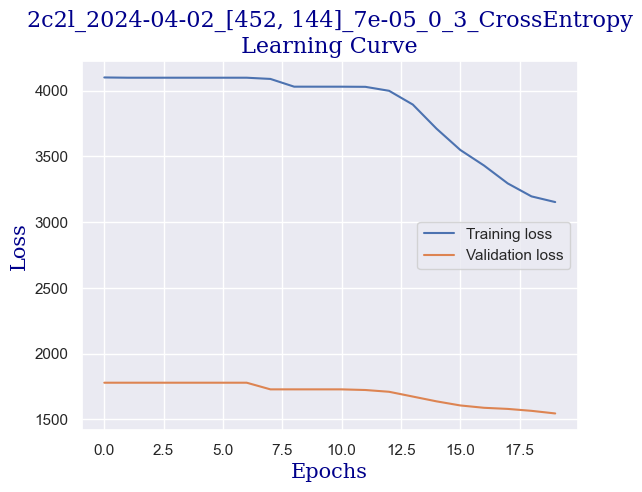

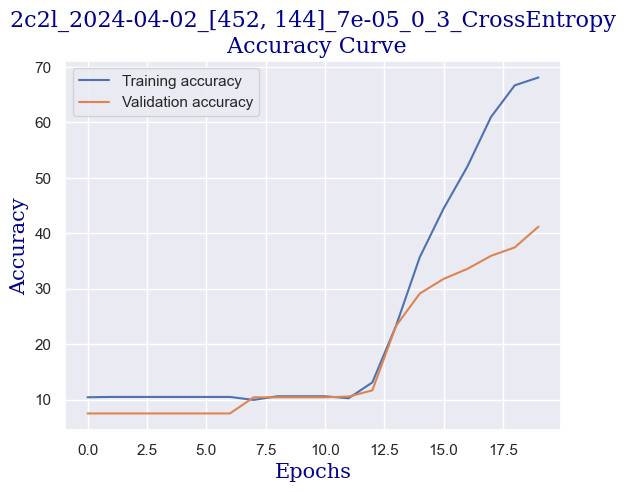

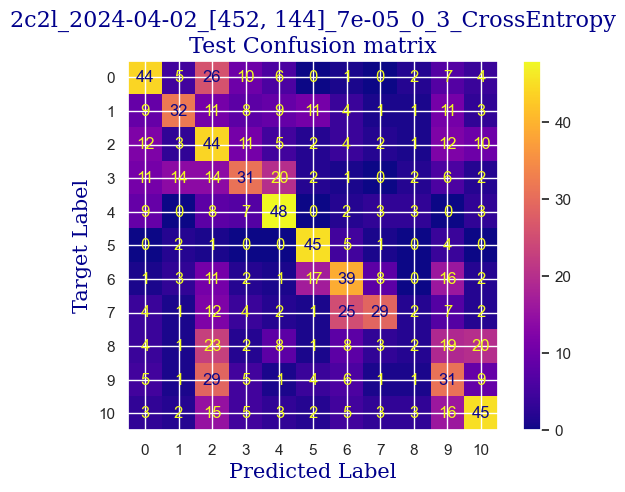

 
 END 2c2l [452, 144] Run Time:  6120.655051337002
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
128367.533279821
128356.204297014
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.57763236168947
validating...


  5%|██▎                                          | 1/20 [00:34<10:58, 34.64s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.005353955978585
validating...


 10%|████▌                                        | 2/20 [01:09<10:24, 34.70s/it]

validation accuracy:  18.030513176144243
Training...
train accuracy:  25.044616299821538
validating...


 15%|██████▊                                      | 3/20 [01:44<09:50, 34.72s/it]

validation accuracy:  24.826629680998614
Training...
train accuracy:  37.59666864961332
validating...


 20%|█████████                                    | 4/20 [02:18<09:16, 34.76s/it]

validation accuracy:  28.29403606102635
Training...
train accuracy:  47.531231409875076
validating...


 25%|███████████▎                                 | 5/20 [02:53<08:41, 34.74s/it]

validation accuracy:  30.097087378640776
Training...
train accuracy:  55.62165377751338
validating...


 30%|█████████████▌                               | 6/20 [03:28<08:06, 34.75s/it]

validation accuracy:  32.73231622746186
Training...
train accuracy:  62.10588935157644
validating...


 35%|███████████████▋                             | 7/20 [04:03<07:31, 34.70s/it]

validation accuracy:  32.73231622746186
Training...
train accuracy:  65.55621653777514
validating...


 40%|██████████████████                           | 8/20 [04:37<06:56, 34.72s/it]

validation accuracy:  32.73231622746186
Training...
train accuracy:  67.40035693039857
validating...


 45%|████████████████████▎                        | 9/20 [05:12<06:21, 34.71s/it]

validation accuracy:  36.1997226074896
Training...
train accuracy:  70.1368233194527
validating...


 50%|██████████████████████                      | 10/20 [05:47<05:46, 34.70s/it]

validation accuracy:  33.14840499306519
Training...
train accuracy:  72.33789411064842
validating...


 55%|████████████████████████▏                   | 11/20 [06:21<05:12, 34.70s/it]

validation accuracy:  37.7253814147018
Training...
train accuracy:  74.77691850089234
validating...


 60%|██████████████████████████▍                 | 12/20 [06:56<04:37, 34.75s/it]

validation accuracy:  35.22884882108183
Training...
train accuracy:  76.14515169541939
validating...


 65%|████████████████████████████▌               | 13/20 [07:31<04:03, 34.76s/it]

validation accuracy:  38.00277392510402
Training...
train accuracy:  77.45389649018442
validating...


 70%|██████████████████████████████▊             | 14/20 [08:06<03:28, 34.83s/it]

validation accuracy:  36.89320388349515
Training...
train accuracy:  78.58417608566329
validating...


 75%|█████████████████████████████████           | 15/20 [08:41<02:53, 34.80s/it]

validation accuracy:  36.061026352288486
Training...
train accuracy:  79.11957168352171
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:15<02:19, 34.77s/it]

validation accuracy:  36.754507628294036
Training...
train accuracy:  80.0118976799524
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:50<01:44, 34.82s/it]

validation accuracy:  38.69625520110957
Training...
train accuracy:  80.30933967876264
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:25<01:09, 34.84s/it]

validation accuracy:  37.03190013869626
Training...
train accuracy:  81.08268887566923
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:00<00:34, 34.80s/it]

validation accuracy:  38.41886269070735
Training...
train accuracy:  81.85603807257584
validating...


100%|████████████████████████████████████████████| 20/20 [11:35<00:00, 34.77s/it]

validation accuracy:  36.89320388349515
Testing...


 
 train acc:  81.85603807257584
 
 val acc:  36.89320388349515
 
 test acc:  34.077669902912625


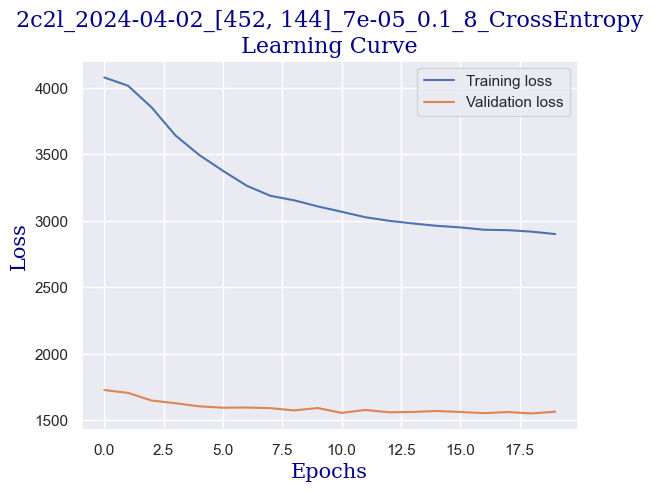

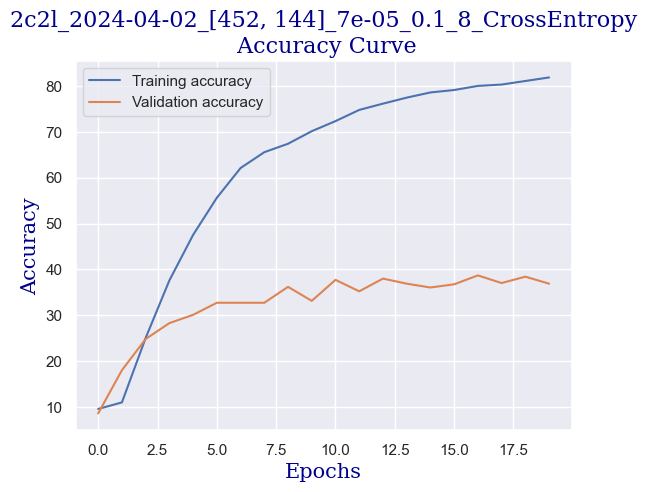

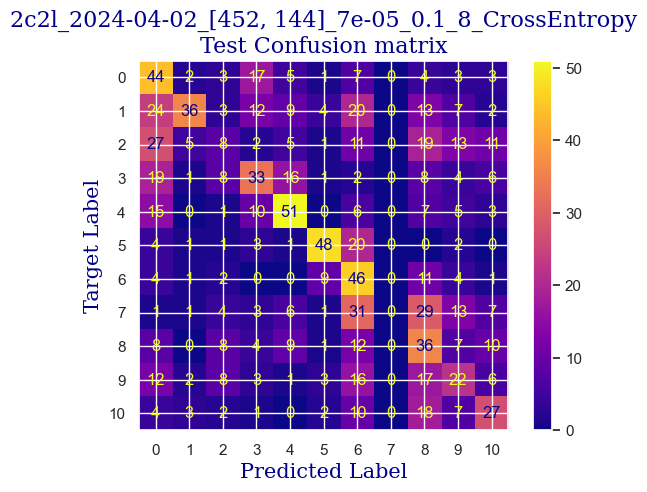

 
 END 2c2l [452, 144] Run Time:  6103.205249431005
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
134470.739617351
134459.410537411
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.75609756097561
validating...


  5%|██▎                                          | 1/20 [00:34<10:58, 34.68s/it]

validation accuracy:  10.679611650485436
Training...
train accuracy:  9.934562760261748
validating...


 10%|████▌                                        | 2/20 [01:09<10:25, 34.77s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.58893515764426
validating...


 15%|██████▊                                      | 3/20 [01:44<09:51, 34.80s/it]

validation accuracy:  13.314840499306518
Training...
train accuracy:  19.15526472337894
validating...


 20%|█████████                                    | 4/20 [02:19<09:16, 34.81s/it]

validation accuracy:  21.220527045769764
Training...
train accuracy:  33.31350386674599
validating...


 25%|███████████▎                                 | 5/20 [02:53<08:41, 34.78s/it]

validation accuracy:  34.11927877947296
Training...
train accuracy:  43.12908982748364
validating...


 30%|█████████████▌                               | 6/20 [03:28<08:07, 34.79s/it]

validation accuracy:  33.980582524271846
Training...
train accuracy:  49.494348602022605
validating...


 35%|███████████████▋                             | 7/20 [04:03<07:32, 34.82s/it]

validation accuracy:  36.061026352288486
Training...
train accuracy:  54.43188578227246
validating...


 40%|██████████████████                           | 8/20 [04:38<06:57, 34.77s/it]

validation accuracy:  37.309292649098474
Training...
train accuracy:  57.16835217132659
validating...


 45%|████████████████████▎                        | 9/20 [05:13<06:22, 34.76s/it]

validation accuracy:  37.86407766990291
Training...
train accuracy:  61.21356335514575
validating...


 50%|██████████████████████                      | 10/20 [05:47<05:47, 34.76s/it]

validation accuracy:  39.1123439667129
Training...
train accuracy:  62.998215348007136
validating...


 55%|████████████████████████▏                   | 11/20 [06:22<05:13, 34.82s/it]

validation accuracy:  39.25104022191401
Training...
train accuracy:  64.24747174301011
validating...


 60%|██████████████████████████▍                 | 12/20 [06:57<04:38, 34.84s/it]

validation accuracy:  40.77669902912621
Training...
train accuracy:  66.62700773349198
validating...


 65%|████████████████████████████▌               | 13/20 [07:32<04:03, 34.85s/it]

validation accuracy:  39.1123439667129
Training...
train accuracy:  68.82807852468768
validating...


 70%|██████████████████████████████▊             | 14/20 [08:07<03:29, 34.87s/it]

validation accuracy:  42.163661581137305
Training...
train accuracy:  70.85068411659726
validating...


 75%|█████████████████████████████████           | 15/20 [08:42<02:54, 34.87s/it]

validation accuracy:  38.97364771151179
Training...
train accuracy:  73.5871505056514
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:16<02:19, 34.83s/it]

validation accuracy:  43.27323162274618
Training...
train accuracy:  75.43129089827484
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:51<01:44, 34.80s/it]

validation accuracy:  44.79889042995839
Training...
train accuracy:  76.62105889351577
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:26<01:09, 34.80s/it]

validation accuracy:  46.3245492371706
Training...
train accuracy:  77.33491969066031
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:01<00:34, 34.78s/it]

validation accuracy:  43.828016643550626
Training...
train accuracy:  77.87031528851874
validating...


100%|████████████████████████████████████████████| 20/20 [11:36<00:00, 34.80s/it]

validation accuracy:  44.382801664355064
Testing...


 
 train acc:  77.87031528851874
 
 val acc:  44.382801664355064
 
 test acc:  42.9126213592233


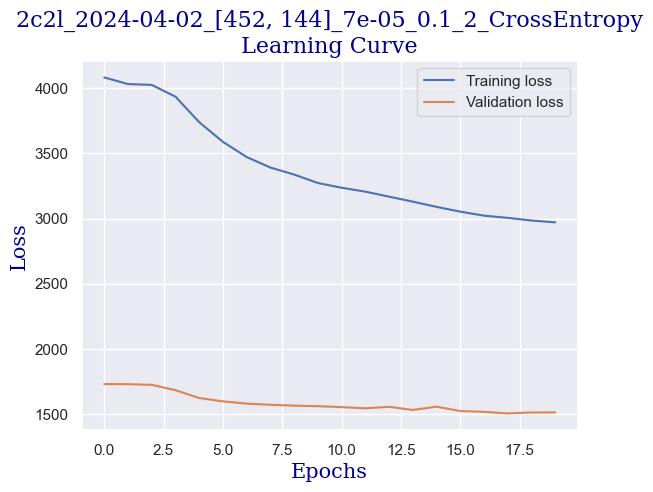

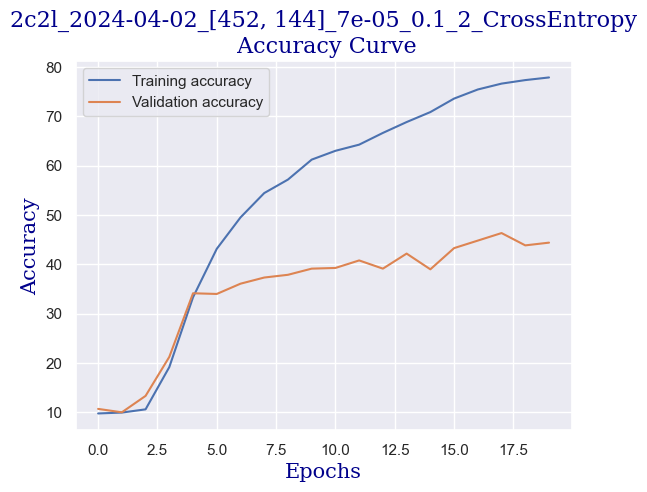

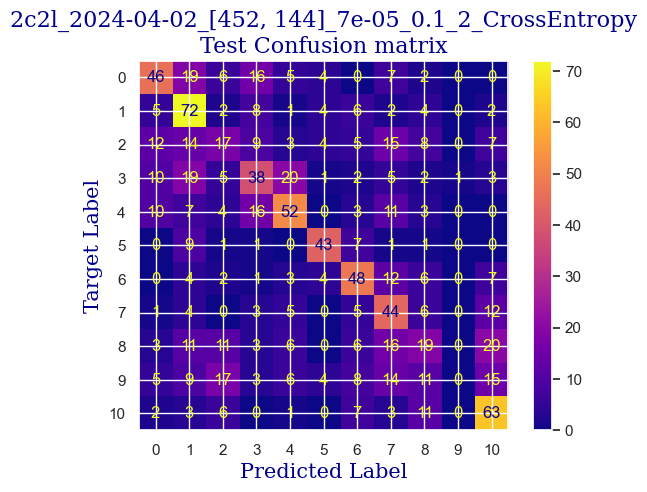

 
 END 2c2l [452, 144] Run Time:  6104.036116304982
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
140574.777103056
140563.448023218
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.39916716240333
validating...


  5%|██▎                                          | 1/20 [00:35<11:05, 35.03s/it]

validation accuracy:  8.183079056865465
Training...
train accuracy:  9.161213563355146
validating...


 10%|████▌                                        | 2/20 [01:09<10:29, 34.95s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  9.994051160023796
validating...


 15%|██████▊                                      | 3/20 [01:44<09:54, 34.95s/it]

validation accuracy:  10.124826629680998
Training...
train accuracy:  9.75609756097561
validating...


 20%|█████████                                    | 4/20 [02:19<09:18, 34.88s/it]

validation accuracy:  9.70873786407767
Training...
train accuracy:  11.838191552647235
validating...


 25%|███████████▎                                 | 5/20 [02:54<08:42, 34.86s/it]

validation accuracy:  12.343966712898752
Training...
train accuracy:  17.311124330755504
validating...


 30%|█████████████▌                               | 6/20 [03:29<08:08, 34.87s/it]

validation accuracy:  12.76005547850208
Training...
train accuracy:  25.758477096966093
validating...


 35%|███████████████▋                             | 7/20 [04:04<07:33, 34.85s/it]

validation accuracy:  22.74618585298197
Training...
train accuracy:  32.59964306960143
validating...


 40%|██████████████████                           | 8/20 [04:38<06:58, 34.84s/it]

validation accuracy:  26.629680998613036
Training...
train accuracy:  36.82331945270672
validating...


 45%|████████████████████▎                        | 9/20 [05:13<06:23, 34.85s/it]

validation accuracy:  27.045769764216367
Training...
train accuracy:  38.54848304580607
validating...


 50%|██████████████████████                      | 10/20 [05:48<05:48, 34.82s/it]

validation accuracy:  28.29403606102635
Training...
train accuracy:  40.63057703747769
validating...


 55%|████████████████████████▏                   | 11/20 [06:23<05:13, 34.84s/it]

validation accuracy:  27.461858529819693
Training...
train accuracy:  43.426531826293875
validating...


 60%|██████████████████████████▍                 | 12/20 [06:58<04:38, 34.87s/it]

validation accuracy:  29.680998613037445
Training...
train accuracy:  44.31885782272457
validating...


 65%|████████████████████████████▌               | 13/20 [07:33<04:03, 34.84s/it]

validation accuracy:  29.819694868238557
Training...
train accuracy:  46.46044021415824
validating...


 70%|██████████████████████████████▊             | 14/20 [08:08<03:29, 34.84s/it]

validation accuracy:  30.513176144244103
Training...
train accuracy:  48.54253420582986
validating...


 75%|█████████████████████████████████           | 15/20 [08:42<02:54, 34.86s/it]

validation accuracy:  33.56449375866852
Training...
train accuracy:  48.720999405116
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:17<02:19, 34.84s/it]

validation accuracy:  31.206657420249652
Training...
train accuracy:  50.148720999405114
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:52<01:44, 34.83s/it]

validation accuracy:  32.31622746185853
Training...
train accuracy:  51.45746579417013
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:27<01:09, 34.82s/it]

validation accuracy:  31.900138696255205
Training...
train accuracy:  51.99286139202856
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:02<00:34, 34.83s/it]

validation accuracy:  32.17753120665742
Training...
train accuracy:  53.599048185603806
validating...


100%|████████████████████████████████████████████| 20/20 [11:37<00:00, 34.86s/it]

validation accuracy:  34.535367545076284
Testing...


 
 train acc:  53.599048185603806
 
 val acc:  34.535367545076284
 
 test acc:  31.359223300970875


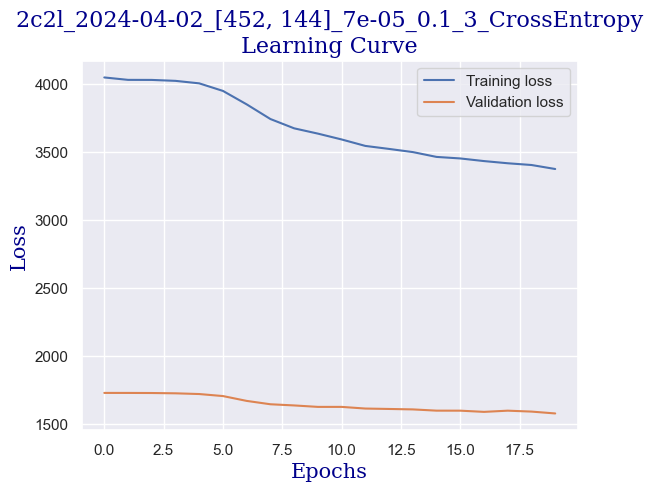

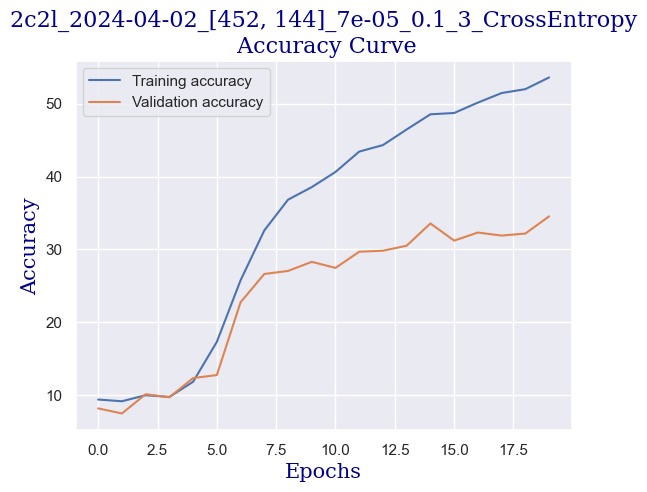

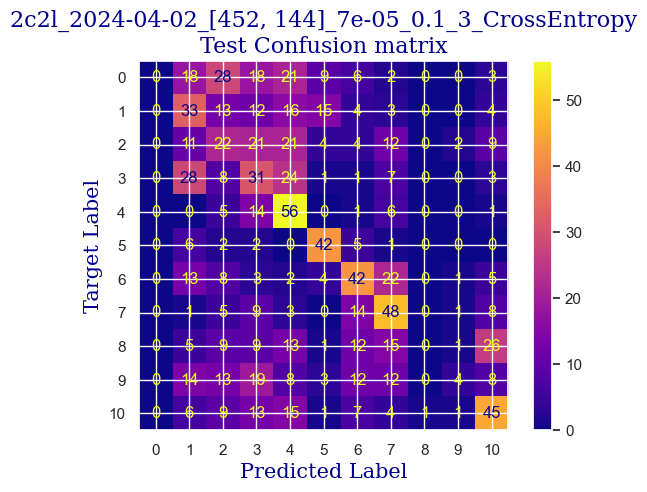

 
 END 2c2l [452, 144] Run Time:  6118.353603113006
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
146693.131873324
146681.802823727
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  10.291493158834028
validating...


  5%|██▎                                          | 1/20 [00:34<10:56, 34.53s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 10%|████▌                                        | 2/20 [01:08<10:20, 34.45s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 15%|██████▊                                      | 3/20 [01:43<09:45, 34.46s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 20%|█████████                                    | 4/20 [02:17<09:11, 34.44s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 25%|███████████▎                                 | 5/20 [02:52<08:36, 34.42s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 30%|█████████████▌                               | 6/20 [03:26<08:01, 34.41s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 35%|███████████████▋                             | 7/20 [04:00<07:26, 34.35s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 40%|██████████████████                           | 8/20 [04:35<06:52, 34.35s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 45%|████████████████████▎                        | 9/20 [05:09<06:17, 34.33s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 50%|██████████████████████                      | 10/20 [05:43<05:43, 34.37s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 55%|████████████████████████▏                   | 11/20 [06:18<05:09, 34.37s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.053539559785841
validating...


 60%|██████████████████████████▍                 | 12/20 [06:52<04:35, 34.39s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  9.637120761451518
validating...


 65%|████████████████████████████▌               | 13/20 [07:27<04:02, 34.57s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  9.637120761451518
validating...


 70%|██████████████████████████████▊             | 14/20 [08:02<03:28, 34.70s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  9.637120761451518
validating...


 75%|█████████████████████████████████           | 15/20 [08:37<02:53, 34.76s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  9.637120761451518
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:12<02:19, 34.81s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  9.637120761451518
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:47<01:44, 34.88s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  9.637120761451518
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:22<01:09, 34.88s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  9.637120761451518
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [10:57<00:34, 34.99s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  9.637120761451518
validating...


100%|████████████████████████████████████████████| 20/20 [11:32<00:00, 34.63s/it]

validation accuracy:  10.540915395284326
Testing...


 
 train acc:  9.637120761451518
 
 val acc:  10.540915395284326
 
 test acc:  9.514563106796116


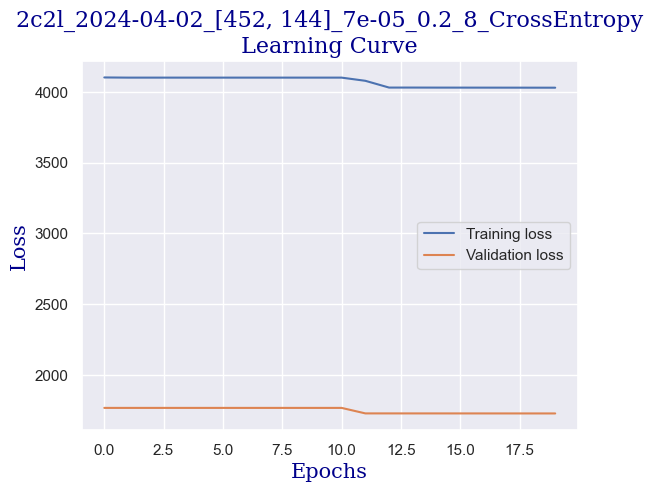

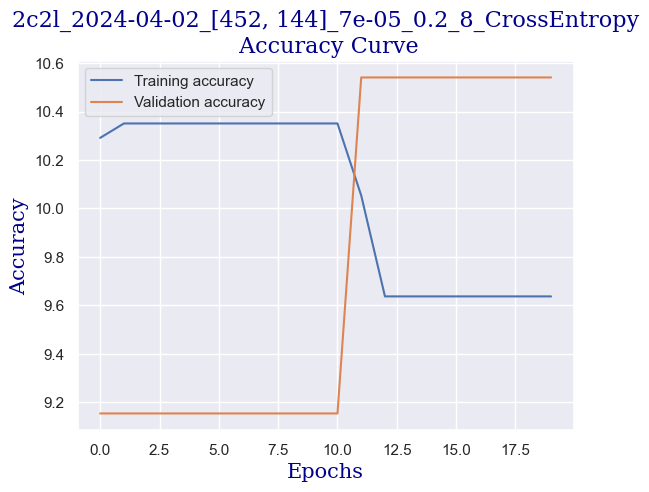

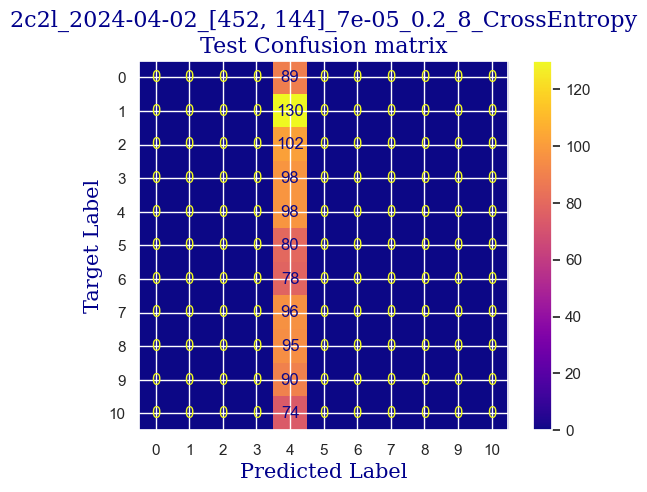

 
 END 2c2l [452, 144] Run Time:  6140.24281185001
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
152833.375971358
152822.046886863
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.506841165972636
validating...


  5%|██▎                                          | 1/20 [00:34<11:01, 34.81s/it]

validation accuracy:  8.737864077669903
Training...
train accuracy:  10.826888756692444
validating...


 10%|████▌                                        | 2/20 [01:09<10:27, 34.84s/it]

validation accuracy:  16.08876560332871
Training...
train accuracy:  21.713265913146937
validating...


 15%|██████▊                                      | 3/20 [01:44<09:51, 34.80s/it]

validation accuracy:  25.79750346740638
Training...
train accuracy:  36.94229625223082
validating...


 20%|█████████                                    | 4/20 [02:19<09:16, 34.80s/it]

validation accuracy:  28.57142857142857
Training...
train accuracy:  46.400951814396194
validating...


 25%|███████████▎                                 | 5/20 [02:54<08:42, 34.82s/it]

validation accuracy:  34.11927877947296
Training...
train accuracy:  53.95597858417609
validating...


 30%|█████████████▌                               | 6/20 [03:29<08:08, 34.86s/it]

validation accuracy:  36.33841886269071
Training...
train accuracy:  59.72635336109459
validating...


 35%|███████████████▋                             | 7/20 [04:03<07:32, 34.80s/it]

validation accuracy:  39.1123439667129
Training...
train accuracy:  64.84235574063058
validating...


 40%|██████████████████                           | 8/20 [04:38<06:58, 34.88s/it]

validation accuracy:  41.88626907073509
Training...
train accuracy:  69.42296252230815
validating...


 45%|████████████████████▎                        | 9/20 [05:13<06:23, 34.82s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  70.73170731707317
validating...


 50%|██████████████████████                      | 10/20 [05:48<05:48, 34.82s/it]

validation accuracy:  39.1123439667129
Training...
train accuracy:  73.4681737061273
validating...


 55%|████████████████████████▏                   | 11/20 [06:23<05:13, 34.80s/it]

validation accuracy:  40.6380027739251
Training...
train accuracy:  74.53896490184414
validating...


 60%|██████████████████████████▍                 | 12/20 [06:57<04:38, 34.79s/it]

validation accuracy:  39.80582524271845
Training...
train accuracy:  76.08566329565734
validating...


 65%|████████████████████████████▌               | 13/20 [07:32<04:03, 34.79s/it]

validation accuracy:  39.94452149791955
Training...
train accuracy:  77.57287328970851
validating...


 70%|██████████████████████████████▊             | 14/20 [08:07<03:28, 34.79s/it]

validation accuracy:  39.80582524271845
Training...
train accuracy:  77.63236168947056
validating...


 75%|█████████████████████████████████           | 15/20 [08:42<02:54, 34.82s/it]

validation accuracy:  41.88626907073509
Training...
train accuracy:  78.16775728732898
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:17<02:19, 34.83s/it]

validation accuracy:  41.88626907073509
Training...
train accuracy:  79.83343248066626
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:51<01:44, 34.81s/it]

validation accuracy:  40.49930651872399
Training...
train accuracy:  80.07138607971446
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:26<01:09, 34.88s/it]

validation accuracy:  41.60887656033287
Training...
train accuracy:  80.48780487804879
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:01<00:34, 34.86s/it]

validation accuracy:  40.36061026352289
Training...
train accuracy:  80.96371207614516
validating...


100%|████████████████████████████████████████████| 20/20 [11:36<00:00, 34.83s/it]

validation accuracy:  43.5506241331484
Testing...


 
 train acc:  80.96371207614516
 
 val acc:  43.5506241331484
 
 test acc:  40.3883495145631


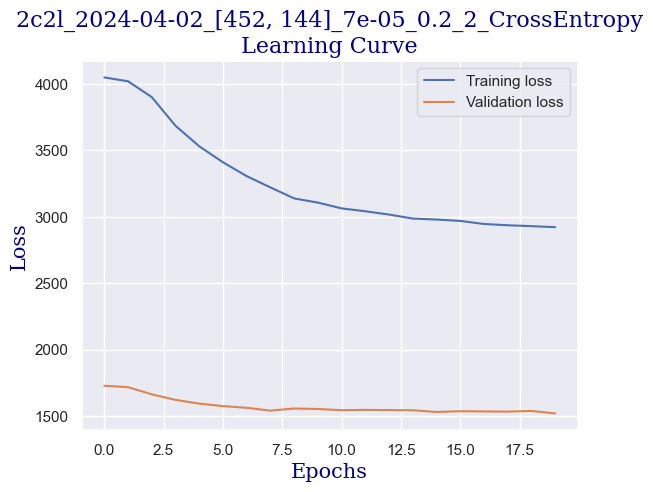

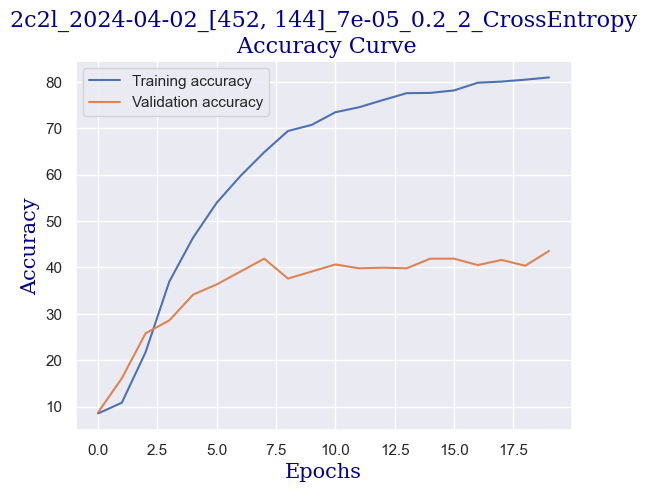

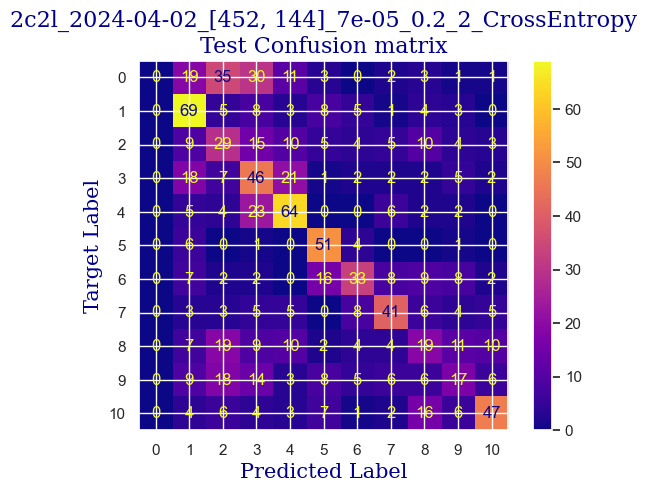

 
 END 2c2l [452, 144] Run Time:  6110.274726798001
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
158943.651760583
158932.322680944
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  10.469958358120167
validating...


  5%|██▎                                          | 1/20 [00:34<11:00, 34.77s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  13.027959547888162
validating...


 10%|████▌                                        | 2/20 [01:09<10:26, 34.81s/it]

validation accuracy:  17.198335644937586
Training...
train accuracy:  24.211778703152888
validating...


 15%|██████▊                                      | 3/20 [01:44<09:51, 34.78s/it]

validation accuracy:  24.549237170596395
Training...
train accuracy:  36.52587745389649
validating...


 20%|█████████                                    | 4/20 [02:19<09:17, 34.81s/it]

validation accuracy:  31.761442441054093
Training...
train accuracy:  46.04402141582391
validating...


 25%|███████████▎                                 | 5/20 [02:53<08:41, 34.79s/it]

validation accuracy:  33.56449375866852
Training...
train accuracy:  51.39797739440809
validating...


 30%|█████████████▌                               | 6/20 [03:28<08:07, 34.79s/it]

validation accuracy:  34.535367545076284
Training...
train accuracy:  55.20523497917906
validating...


 35%|███████████████▋                             | 7/20 [04:03<07:32, 34.83s/it]

validation accuracy:  36.1997226074896
Training...
train accuracy:  58.65556216537775
validating...


 40%|██████████████████                           | 8/20 [04:38<06:58, 34.89s/it]

validation accuracy:  38.141470180305134
Training...
train accuracy:  61.45151695419393
validating...


 45%|████████████████████▎                        | 9/20 [05:13<06:23, 34.87s/it]

validation accuracy:  39.389736477115115
Training...
train accuracy:  63.890541344437835
validating...


 50%|██████████████████████                      | 10/20 [05:48<05:48, 34.89s/it]

validation accuracy:  39.528432732316226
Training...
train accuracy:  64.90184414039263
validating...


 55%|████████████████████████▏                   | 11/20 [06:23<05:13, 34.86s/it]

validation accuracy:  41.47018030513176
Training...
train accuracy:  66.74598453301607
validating...


 60%|██████████████████████████▍                 | 12/20 [06:58<04:38, 34.83s/it]

validation accuracy:  41.88626907073509
Training...
train accuracy:  69.18500892325996
validating...


 65%|████████████████████████████▌               | 13/20 [07:32<04:03, 34.84s/it]

validation accuracy:  43.689320388349515
Training...
train accuracy:  70.37477691850088
validating...


 70%|██████████████████████████████▊             | 14/20 [08:07<03:29, 34.87s/it]

validation accuracy:  43.689320388349515
Training...
train accuracy:  73.23022010707912
validating...


 75%|█████████████████████████████████           | 15/20 [08:42<02:54, 34.86s/it]

validation accuracy:  43.5506241331484
Training...
train accuracy:  75.0148720999405
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:17<02:19, 34.86s/it]

validation accuracy:  44.24410540915395
Training...
train accuracy:  74.95538370017847
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:52<01:44, 34.84s/it]

validation accuracy:  45.07628294036061
Training...
train accuracy:  76.32361689470554
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:27<01:09, 34.87s/it]

validation accuracy:  42.57975034674064
Training...
train accuracy:  76.68054729327781
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:02<00:34, 34.85s/it]

validation accuracy:  43.689320388349515
Training...
train accuracy:  76.68054729327781
validating...


100%|████████████████████████████████████████████| 20/20 [11:36<00:00, 34.84s/it]

validation accuracy:  45.49237170596394
Testing...


 
 train acc:  76.68054729327781
 
 val acc:  45.49237170596394
 
 test acc:  43.49514563106796


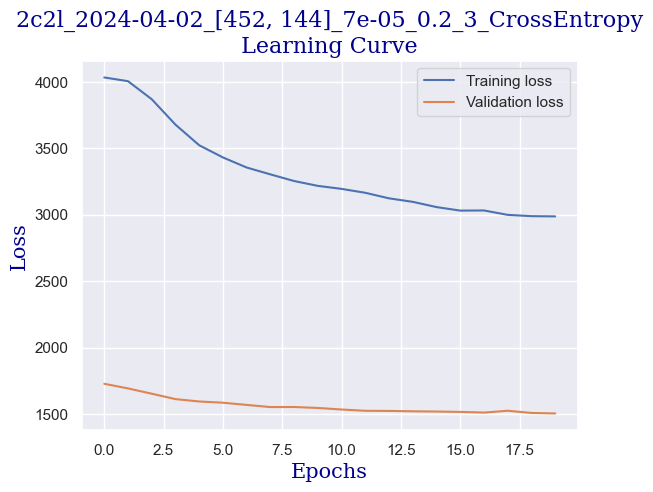

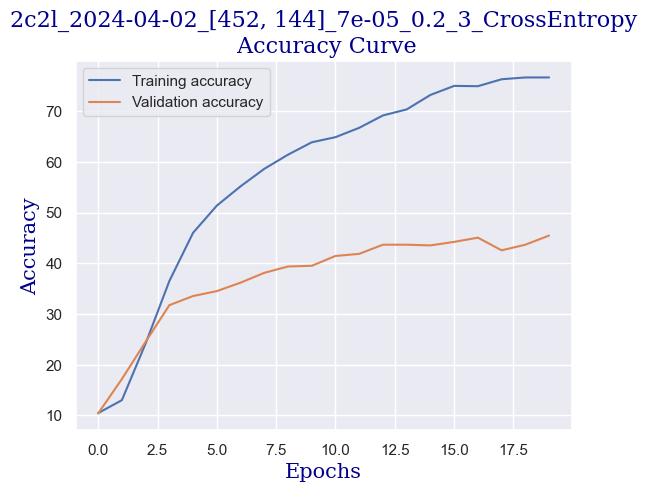

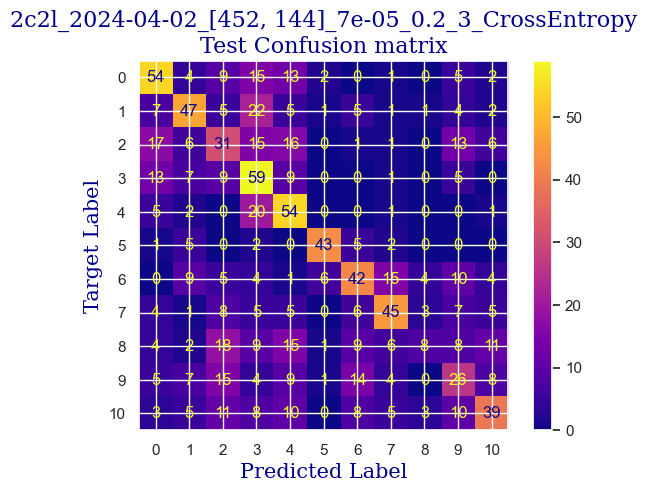

 
 END 2c2l [452, 144] Run Time:  6123.579373624001
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
165067.232170961
165055.9030897
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.696609161213564
validating...


  5%|██▎                                          | 1/20 [00:34<11:01, 34.82s/it]

validation accuracy:  9.015256588072122
Training...
train accuracy:  11.183819155264723
validating...


 10%|████▌                                        | 2/20 [01:09<10:26, 34.81s/it]

validation accuracy:  9.847434119278779
Training...
train accuracy:  18.500892325996432
validating...


 15%|██████▊                                      | 3/20 [01:44<09:51, 34.81s/it]

validation accuracy:  22.46879334257975
Training...
train accuracy:  30.636525877453895
validating...


 20%|█████████                                    | 4/20 [02:19<09:18, 34.92s/it]

validation accuracy:  28.29403606102635
Training...
train accuracy:  39.50029744199881
validating...


 25%|███████████▎                                 | 5/20 [02:54<08:43, 34.89s/it]

validation accuracy:  29.680998613037445
Training...
train accuracy:  44.97323022010708
validating...


 30%|█████████████▌                               | 6/20 [03:29<08:07, 34.85s/it]

validation accuracy:  30.235783633841883
Training...
train accuracy:  53.36109458655562
validating...


 35%|███████████████▋                             | 7/20 [04:04<07:33, 34.89s/it]

validation accuracy:  35.09015256588072
Training...
train accuracy:  58.89351576442594
validating...


 40%|██████████████████                           | 8/20 [04:39<06:58, 34.90s/it]

validation accuracy:  37.309292649098474
Training...
train accuracy:  63.5930993456276
validating...


 45%|████████████████████▎                        | 9/20 [05:13<06:23, 34.87s/it]

validation accuracy:  34.11927877947296
Training...
train accuracy:  65.73468173706128
validating...


 50%|██████████████████████                      | 10/20 [05:48<05:48, 34.87s/it]

validation accuracy:  36.89320388349515
Training...
train accuracy:  67.40035693039857
validating...


 55%|████████████████████████▏                   | 11/20 [06:23<05:13, 34.84s/it]

validation accuracy:  39.94452149791955
Training...
train accuracy:  70.73170731707317
validating...


 60%|██████████████████████████▍                 | 12/20 [06:58<04:38, 34.84s/it]

validation accuracy:  38.141470180305134
Training...
train accuracy:  71.80249851279001
validating...


 65%|████████████████████████████▌               | 13/20 [07:33<04:03, 34.81s/it]

validation accuracy:  37.447988904299585
Training...
train accuracy:  74.360499702558
validating...


 70%|██████████████████████████████▊             | 14/20 [08:07<03:28, 34.81s/it]

validation accuracy:  39.94452149791955
Training...
train accuracy:  74.18203450327186
validating...


 75%|█████████████████████████████████           | 15/20 [08:42<02:54, 34.81s/it]

validation accuracy:  38.41886269070735
Training...
train accuracy:  76.14515169541939
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:17<02:19, 34.83s/it]

validation accuracy:  40.6380027739251
Training...
train accuracy:  77.8108268887567
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:52<01:44, 34.80s/it]

validation accuracy:  37.309292649098474
Training...
train accuracy:  77.45389649018442
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:27<01:09, 34.81s/it]

validation accuracy:  39.25104022191401
Training...
train accuracy:  78.58417608566329
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:01<00:34, 34.83s/it]

validation accuracy:  39.94452149791955
Training...
train accuracy:  78.52468768590126
validating...


100%|████████████████████████████████████████████| 20/20 [11:36<00:00, 34.84s/it]

validation accuracy:  39.80582524271845
Testing...


 
 train acc:  78.52468768590126
 
 val acc:  39.80582524271845
 
 test acc:  38.543689320388346


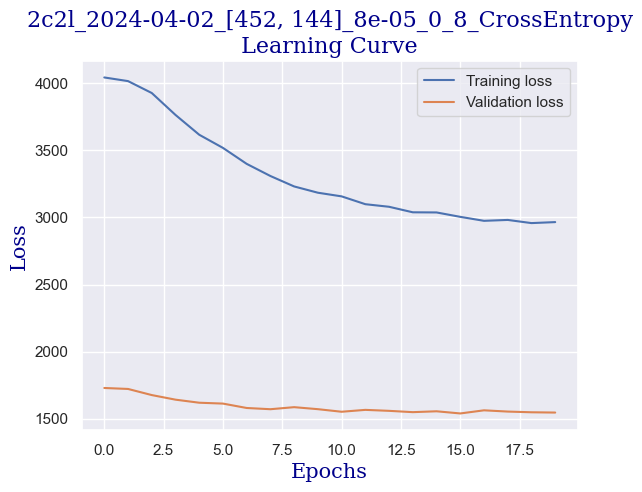

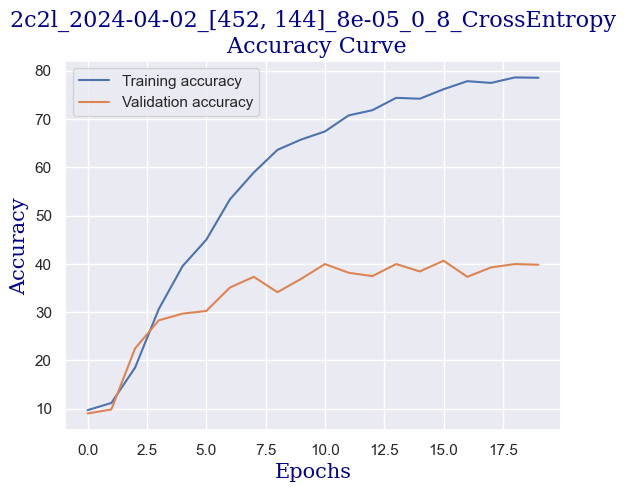

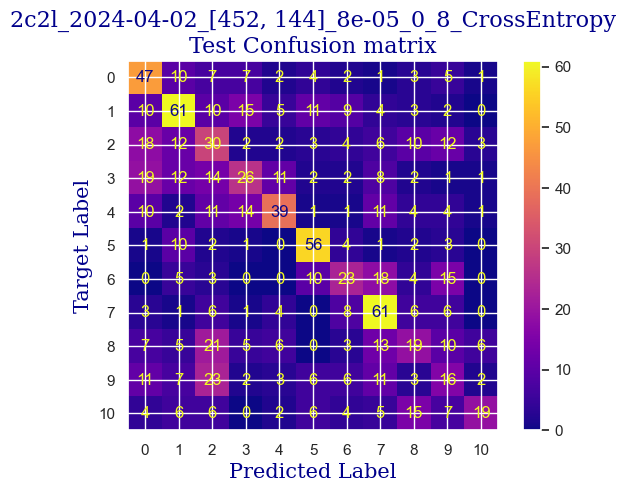

 
 END 2c2l [452, 144] Run Time:  6118.486773008975
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
171185.71981744
171174.390736244
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  10.469958358120167
validating...


  5%|██▎                                          | 1/20 [00:34<11:00, 34.76s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.58893515764426
validating...


 10%|████▌                                        | 2/20 [01:09<10:26, 34.80s/it]

validation accuracy:  11.789181692094314
Training...
train accuracy:  22.48661511005354
validating...


 15%|██████▊                                      | 3/20 [01:44<09:51, 34.80s/it]

validation accuracy:  22.46879334257975
Training...
train accuracy:  34.443783462224864
validating...


 20%|█████████                                    | 4/20 [02:19<09:18, 34.88s/it]

validation accuracy:  23.300970873786408
Training...
train accuracy:  43.48602022605592
validating...


 25%|███████████▎                                 | 5/20 [02:54<08:42, 34.84s/it]

validation accuracy:  28.71012482662968
Training...
train accuracy:  50.26769779892921
validating...


 30%|█████████████▌                               | 6/20 [03:28<08:07, 34.81s/it]

validation accuracy:  33.00970873786408
Training...
train accuracy:  55.02676977989292
validating...


 35%|███████████████▋                             | 7/20 [04:03<07:32, 34.78s/it]

validation accuracy:  33.56449375866852
Training...
train accuracy:  61.1540749553837
validating...


 40%|██████████████████                           | 8/20 [04:38<06:57, 34.78s/it]

validation accuracy:  36.47711511789182
Training...
train accuracy:  65.67519333729923
validating...


 45%|████████████████████▎                        | 9/20 [05:13<06:22, 34.80s/it]

validation accuracy:  38.41886269070735
Training...
train accuracy:  67.57882212968471
validating...


 50%|██████████████████████                      | 10/20 [05:48<05:48, 34.83s/it]

validation accuracy:  36.33841886269071
Training...
train accuracy:  69.54193932183225
validating...


 55%|████████████████████████▏                   | 11/20 [06:22<05:13, 34.78s/it]

validation accuracy:  39.1123439667129
Training...
train accuracy:  72.09994051160024
validating...


 60%|██████████████████████████▍                 | 12/20 [06:57<04:38, 34.82s/it]

validation accuracy:  40.915395284327325
Training...
train accuracy:  74.30101130279596
validating...


 65%|████████████████████████████▌               | 13/20 [07:32<04:03, 34.82s/it]

validation accuracy:  39.528432732316226
Training...
train accuracy:  76.50208209399167
validating...


 70%|██████████████████████████████▊             | 14/20 [08:07<03:28, 34.80s/it]

validation accuracy:  41.88626907073509
Training...
train accuracy:  77.69185008923259
validating...


 75%|█████████████████████████████████           | 15/20 [08:42<02:53, 34.80s/it]

validation accuracy:  40.915395284327325
Training...
train accuracy:  77.33491969066031
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:16<02:19, 34.81s/it]

validation accuracy:  41.74757281553398
Training...
train accuracy:  79.59547888161809
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:51<01:44, 34.81s/it]

validation accuracy:  40.49930651872399
Training...
train accuracy:  81.49910767400357
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:26<01:09, 34.84s/it]

validation accuracy:  43.41192787794729
Training...
train accuracy:  81.49910767400357
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:01<00:34, 34.83s/it]

validation accuracy:  40.49930651872399
Training...
train accuracy:  83.04580606781677
validating...


100%|████████████████████████████████████████████| 20/20 [11:36<00:00, 34.82s/it]

validation accuracy:  42.857142857142854
Testing...


 
 train acc:  83.04580606781677
 
 val acc:  42.857142857142854
 
 test acc:  37.96116504854369


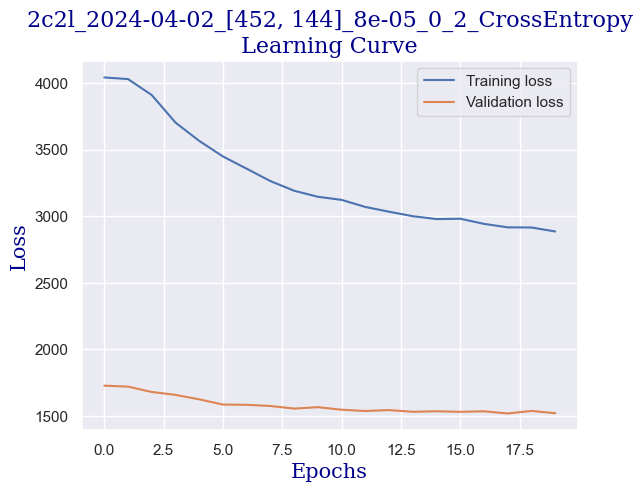

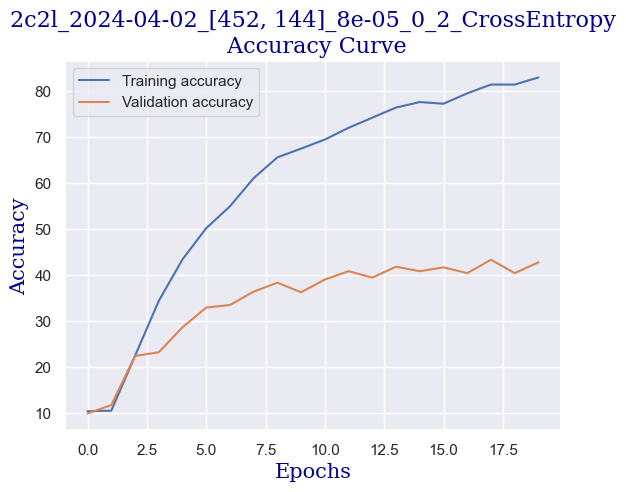

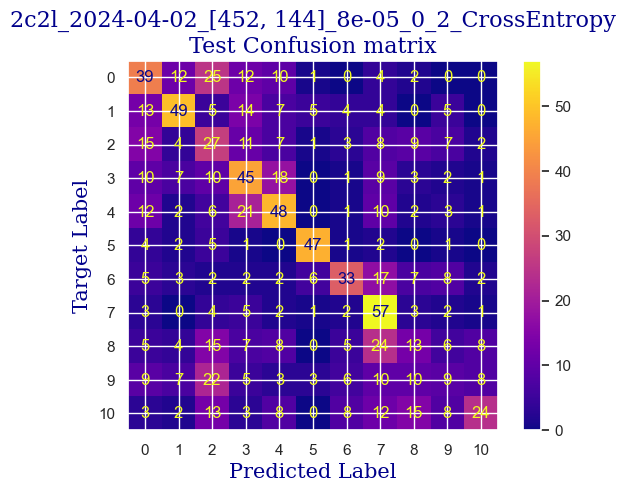

 
 END 2c2l [452, 144] Run Time:  6109.128002965997
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
177294.848770391
177283.519686459
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.1017251635931
validating...


  5%|██▎                                          | 1/20 [00:34<11:03, 34.94s/it]

validation accuracy:  9.847434119278779
Training...
train accuracy:  13.801308744794765
validating...


 10%|████▌                                        | 2/20 [01:09<10:27, 34.87s/it]

validation accuracy:  18.446601941747574
Training...
train accuracy:  29.268292682926827
validating...


 15%|██████▊                                      | 3/20 [01:44<09:53, 34.89s/it]

validation accuracy:  27.184466019417474
Training...
train accuracy:  40.749553837001784
validating...


 20%|█████████                                    | 4/20 [02:19<09:18, 34.88s/it]

validation accuracy:  30.235783633841883
Training...
train accuracy:  48.30458060678168
validating...


 25%|███████████▎                                 | 5/20 [02:54<08:43, 34.87s/it]

validation accuracy:  37.7253814147018
Training...
train accuracy:  55.3837001784652
validating...


 30%|█████████████▌                               | 6/20 [03:29<08:07, 34.86s/it]

validation accuracy:  40.221914008321775
Training...
train accuracy:  60.02379535990482
validating...


 35%|███████████████▋                             | 7/20 [04:04<07:33, 34.86s/it]

validation accuracy:  38.41886269070735
Training...
train accuracy:  63.652587745389646
validating...


 40%|██████████████████                           | 8/20 [04:39<06:58, 34.89s/it]

validation accuracy:  39.66712898751734
Training...
train accuracy:  67.22189173111244
validating...


 45%|████████████████████▎                        | 9/20 [05:13<06:23, 34.86s/it]

validation accuracy:  39.66712898751734
Training...
train accuracy:  70.01784651992861
validating...


 50%|██████████████████████                      | 10/20 [05:48<05:48, 34.87s/it]

validation accuracy:  40.49930651872399
Training...
train accuracy:  71.50505651397977
validating...


 55%|████████████████████████▏                   | 11/20 [06:23<05:13, 34.85s/it]

validation accuracy:  40.221914008321775
Training...
train accuracy:  72.39738251041047
validating...


 60%|██████████████████████████▍                 | 12/20 [06:58<04:39, 34.88s/it]

validation accuracy:  41.05409153952843
Training...
train accuracy:  73.5871505056514
validating...


 65%|████████████████████████████▌               | 13/20 [07:33<04:03, 34.84s/it]

validation accuracy:  41.05409153952843
Training...
train accuracy:  75.96668649613325
validating...


 70%|██████████████████████████████▊             | 14/20 [08:08<03:28, 34.83s/it]

validation accuracy:  39.25104022191401
Training...
train accuracy:  76.56157049375372
validating...


 75%|█████████████████████████████████           | 15/20 [08:42<02:54, 34.85s/it]

validation accuracy:  39.1123439667129
Training...
train accuracy:  78.34622248661512
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:17<02:19, 34.86s/it]

validation accuracy:  39.66712898751734
Training...
train accuracy:  79.47650208209399
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:52<01:44, 34.84s/it]

validation accuracy:  41.19278779472954
Training...
train accuracy:  79.77394408090423
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:27<01:09, 34.83s/it]

validation accuracy:  39.389736477115115
Training...
train accuracy:  81.0232004759072
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:02<00:34, 34.83s/it]

validation accuracy:  39.66712898751734
Training...
train accuracy:  82.74836406900654
validating...


100%|████████████████████████████████████████████| 20/20 [11:37<00:00, 34.85s/it]

validation accuracy:  41.05409153952843
Testing...


 
 train acc:  82.74836406900654
 
 val acc:  41.05409153952843
 
 test acc:  39.80582524271845


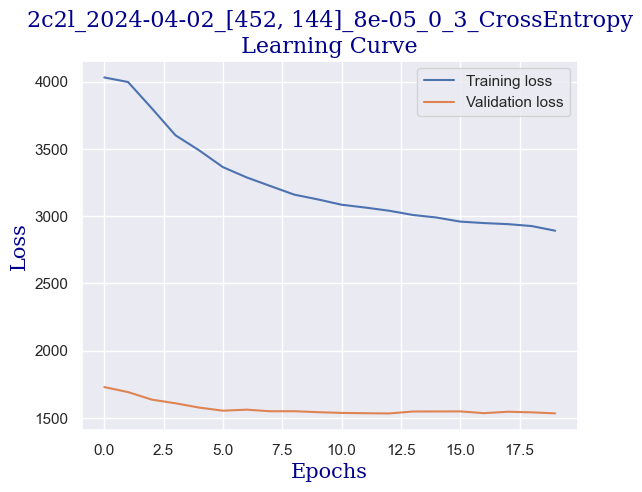

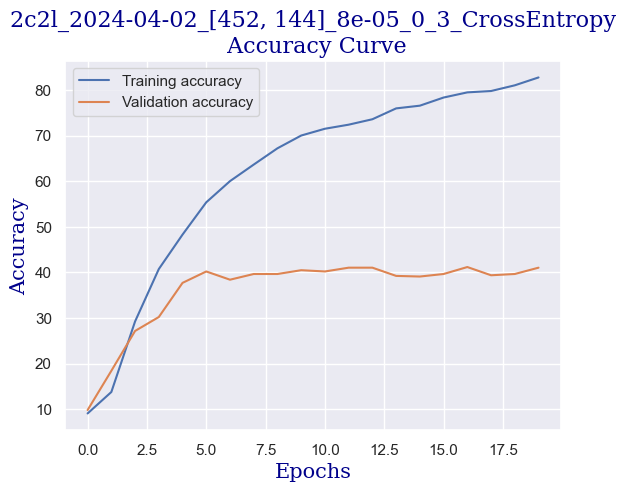

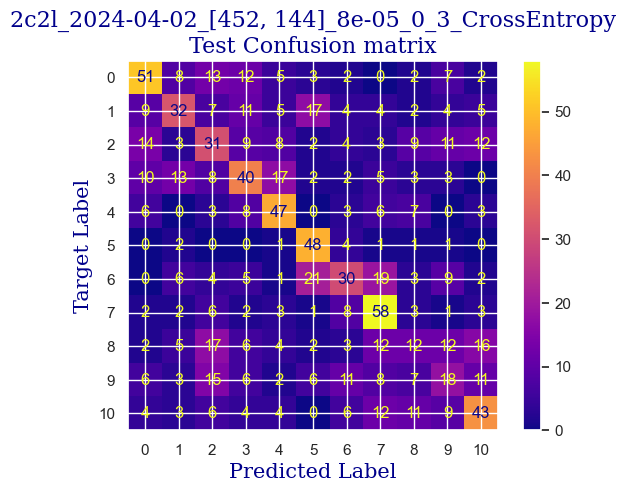

 
 END 2c2l [452, 144] Run Time:  6114.887080554996
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
183409.736884363
183398.407802387
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.149910767400357
validating...


  5%|██▎                                          | 1/20 [00:34<10:58, 34.63s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.26888756692445
validating...


 10%|████▌                                        | 2/20 [01:09<10:22, 34.58s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.26888756692445
validating...


 15%|██████▊                                      | 3/20 [01:43<09:48, 34.61s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.26888756692445
validating...


 20%|█████████                                    | 4/20 [02:18<09:14, 34.66s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.26888756692445
validating...


 25%|███████████▎                                 | 5/20 [02:53<08:39, 34.64s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.26888756692445
validating...


 30%|█████████████▌                               | 6/20 [03:27<08:05, 34.70s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.26888756692445
validating...


 35%|███████████████▋                             | 7/20 [04:02<07:31, 34.73s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.26888756692445
validating...


 40%|██████████████████                           | 8/20 [04:37<06:56, 34.71s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.26888756692445
validating...


 45%|████████████████████▎                        | 9/20 [05:12<06:21, 34.71s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.26888756692445
validating...


 50%|██████████████████████                      | 10/20 [05:46<05:47, 34.71s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.26888756692445
validating...


 55%|████████████████████████▏                   | 11/20 [06:21<05:12, 34.74s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.26888756692445
validating...


 60%|██████████████████████████▍                 | 12/20 [06:56<04:38, 34.76s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.149910767400357
validating...


 65%|████████████████████████████▌               | 13/20 [07:31<04:03, 34.74s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.113027959547887
validating...


 70%|██████████████████████████████▊             | 14/20 [08:06<03:28, 34.81s/it]

validation accuracy:  14.979195561719832
Training...
train accuracy:  20.166567519333732
validating...


 75%|█████████████████████████████████           | 15/20 [08:41<02:54, 34.83s/it]

validation accuracy:  27.600554785020805
Training...
train accuracy:  35.455086258179655
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:15<02:19, 34.81s/it]

validation accuracy:  30.929264909847433
Training...
train accuracy:  45.211183819155266
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:50<01:44, 34.86s/it]

validation accuracy:  35.92233009708738
Training...
train accuracy:  50.803093396787624
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:25<01:09, 34.84s/it]

validation accuracy:  37.17059639389736
Training...
train accuracy:  56.454491374182034
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:00<00:34, 34.82s/it]

validation accuracy:  38.55755894590846
Training...
train accuracy:  60.678167757287326
validating...


100%|████████████████████████████████████████████| 20/20 [11:35<00:00, 34.76s/it]

validation accuracy:  39.94452149791955
Testing...


 
 train acc:  60.678167757287326
 
 val acc:  39.94452149791955
 
 test acc:  39.32038834951456


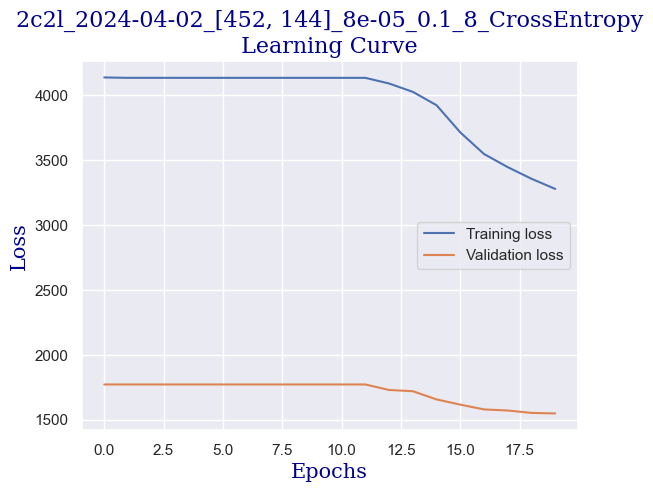

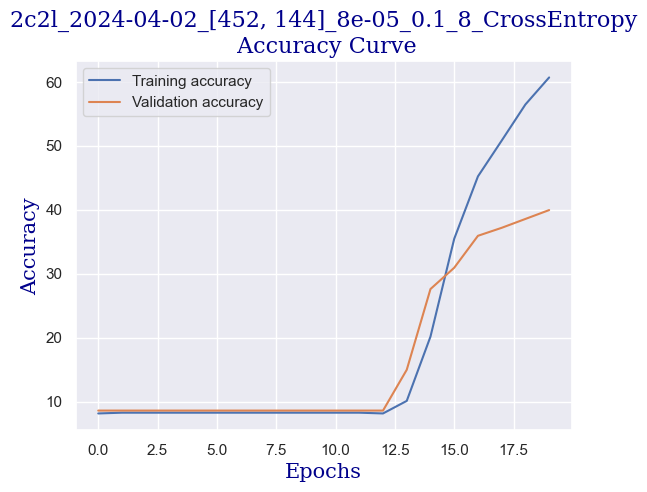

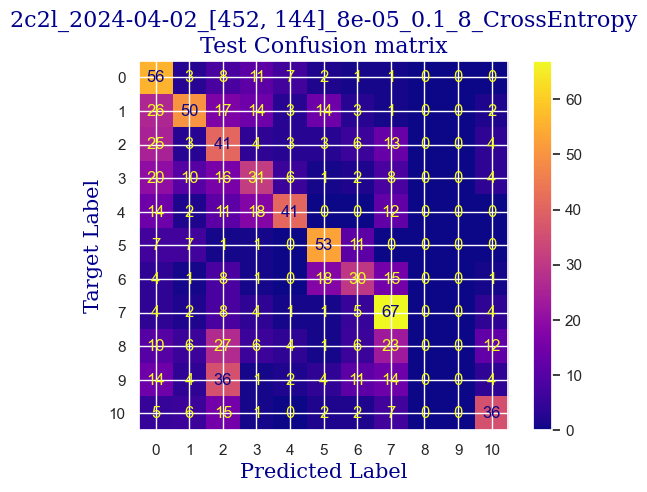

 
 END 2c2l [452, 144] Run Time:  6125.888508260017
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
189535.626613133
189524.297534065
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  7.792980368828078
validating...


  5%|██▎                                          | 1/20 [00:34<11:00, 34.77s/it]

validation accuracy:  9.847434119278779
Training...
train accuracy:  10.58893515764426
validating...


 10%|████▌                                        | 2/20 [01:09<10:25, 34.78s/it]

validation accuracy:  16.36615811373093
Training...
train accuracy:  23.914336704342652
validating...


 15%|██████▊                                      | 3/20 [01:44<09:51, 34.81s/it]

validation accuracy:  26.0748959778086
Training...
train accuracy:  39.73825104104699
validating...


 20%|█████████                                    | 4/20 [02:19<09:16, 34.79s/it]

validation accuracy:  33.980582524271846
Training...
train accuracy:  51.69541939321832
validating...


 25%|███████████▎                                 | 5/20 [02:53<08:41, 34.79s/it]

validation accuracy:  34.11927877947296
Training...
train accuracy:  59.904818560380726
validating...


 30%|█████████████▌                               | 6/20 [03:28<08:07, 34.83s/it]

validation accuracy:  38.28016643550624
Training...
train accuracy:  65.91314693634742
validating...


 35%|███████████████▋                             | 7/20 [04:03<07:32, 34.81s/it]

validation accuracy:  39.94452149791955
Training...
train accuracy:  70.37477691850088
validating...


 40%|██████████████████                           | 8/20 [04:38<06:57, 34.80s/it]

validation accuracy:  42.163661581137305
Training...
train accuracy:  74.12254610350982
validating...


 45%|████████████████████▎                        | 9/20 [05:13<06:22, 34.81s/it]

validation accuracy:  41.05409153952843
Training...
train accuracy:  74.71743010113028
validating...


 50%|██████████████████████                      | 10/20 [05:47<05:47, 34.79s/it]

validation accuracy:  42.71844660194174
Training...
train accuracy:  77.09696609161215
validating...


 55%|████████████████████████▏                   | 11/20 [06:22<05:13, 34.81s/it]

validation accuracy:  43.828016643550626
Training...
train accuracy:  77.8108268887567
validating...


 60%|██████████████████████████▍                 | 12/20 [06:57<04:38, 34.83s/it]

validation accuracy:  42.71844660194174
Training...
train accuracy:  79.06008328375967
validating...


 65%|████████████████████████████▌               | 13/20 [07:32<04:03, 34.81s/it]

validation accuracy:  41.47018030513176
Training...
train accuracy:  80.66627007733493
validating...


 70%|██████████████████████████████▊             | 14/20 [08:07<03:28, 34.82s/it]

validation accuracy:  45.07628294036061
Training...
train accuracy:  82.27245687091018
validating...


 75%|█████████████████████████████████           | 15/20 [08:42<02:54, 34.83s/it]

validation accuracy:  44.79889042995839
Training...
train accuracy:  83.75966686496133
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:16<02:19, 34.81s/it]

validation accuracy:  43.5506241331484
Training...
train accuracy:  84.05710886377157
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:51<01:44, 34.80s/it]

validation accuracy:  45.49237170596394
Training...
train accuracy:  84.94943486020226
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:26<01:09, 34.78s/it]

validation accuracy:  47.8502080443828
Training...
train accuracy:  86.19869125520523
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:01<00:34, 34.79s/it]

validation accuracy:  46.18585298196949
Training...
train accuracy:  86.9125520523498
validating...


100%|████████████████████████████████████████████| 20/20 [11:36<00:00, 34.80s/it]

validation accuracy:  45.63106796116505
Testing...


 
 train acc:  86.9125520523498
 
 val acc:  45.63106796116505
 
 test acc:  41.359223300970875


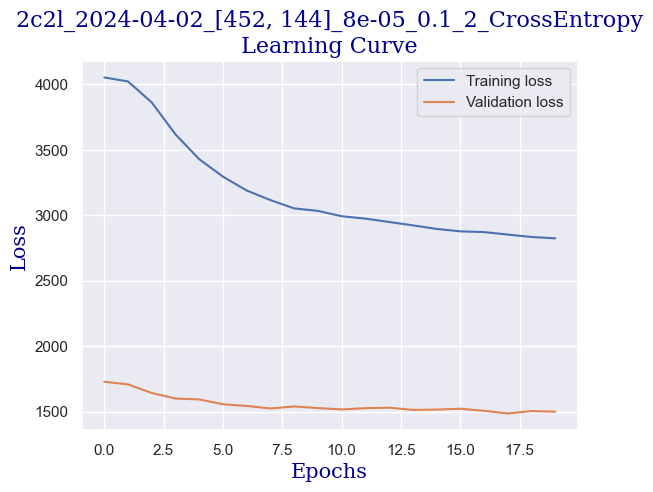

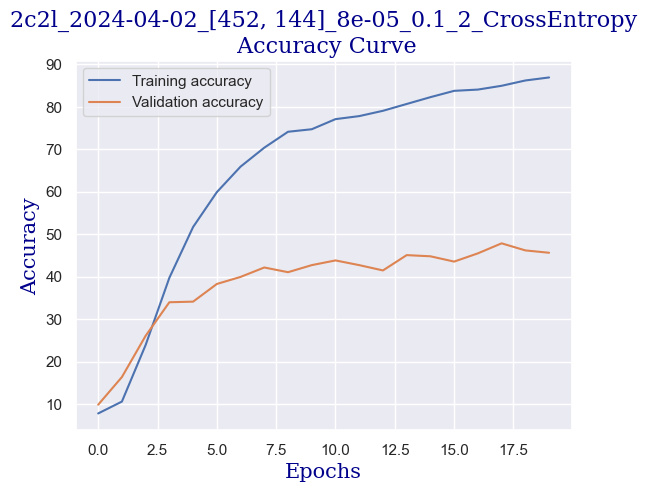

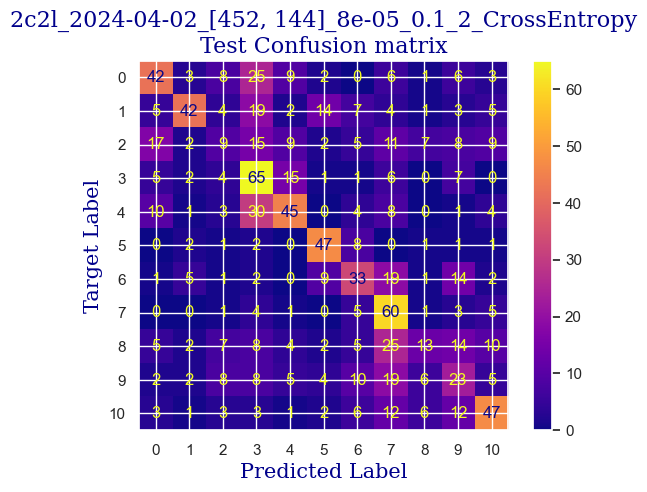

 
 END 2c2l [452, 144] Run Time:  6104.10212337799
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
195639.729942142
195628.400859127
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.815585960737657
validating...


  5%|██▎                                          | 1/20 [00:34<11:01, 34.82s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  10.41046995835812
validating...


 10%|████▌                                        | 2/20 [01:09<10:29, 34.97s/it]

validation accuracy:  12.066574202496533
Training...
train accuracy:  12.07614515169542
validating...


 15%|██████▊                                      | 3/20 [01:44<09:53, 34.91s/it]

validation accuracy:  12.343966712898752
Training...
train accuracy:  21.772754312908983
validating...


 20%|█████████                                    | 4/20 [02:19<09:17, 34.87s/it]

validation accuracy:  19.972260748959776
Training...
train accuracy:  34.146341463414636
validating...


 25%|███████████▎                                 | 5/20 [02:54<08:42, 34.83s/it]

validation accuracy:  24.410540915395284
Training...
train accuracy:  42.71267102914932
validating...


 30%|█████████████▌                               | 6/20 [03:29<08:07, 34.83s/it]

validation accuracy:  30.097087378640776
Training...
train accuracy:  48.54253420582986
validating...


 35%|███████████████▋                             | 7/20 [04:03<07:32, 34.82s/it]

validation accuracy:  32.038834951456316
Training...
train accuracy:  53.42058298631767
validating...


 40%|██████████████████                           | 8/20 [04:38<06:57, 34.83s/it]

validation accuracy:  32.73231622746186
Training...
train accuracy:  58.06067816775729
validating...


 45%|████████████████████▎                        | 9/20 [05:13<06:23, 34.85s/it]

validation accuracy:  34.25797503467407
Training...
train accuracy:  61.74895895300416
validating...


 50%|██████████████████████                      | 10/20 [05:48<05:48, 34.83s/it]

validation accuracy:  35.50624133148405
Training...
train accuracy:  66.74598453301607
validating...


 55%|████████████████████████▏                   | 11/20 [06:23<05:13, 34.83s/it]

validation accuracy:  39.66712898751734
Training...
train accuracy:  68.47114812611541
validating...


 60%|██████████████████████████▍                 | 12/20 [06:58<04:38, 34.86s/it]

validation accuracy:  39.389736477115115
Training...
train accuracy:  71.68352171326592
validating...


 65%|████████████████████████████▌               | 13/20 [07:33<04:03, 34.84s/it]

validation accuracy:  41.74757281553398
Training...
train accuracy:  73.94408090422367
validating...


 70%|██████████████████████████████▊             | 14/20 [08:07<03:29, 34.87s/it]

validation accuracy:  40.49930651872399
Training...
train accuracy:  74.24152290303391
validating...


 75%|█████████████████████████████████           | 15/20 [08:42<02:54, 34.82s/it]

validation accuracy:  41.60887656033287
Training...
train accuracy:  77.63236168947056
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:17<02:19, 34.81s/it]

validation accuracy:  39.66712898751734
Training...
train accuracy:  79.11957168352171
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:52<01:44, 34.84s/it]

validation accuracy:  44.382801664355064
Training...
train accuracy:  80.2498512790006
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:27<01:09, 34.81s/it]

validation accuracy:  40.49930651872399
Training...
train accuracy:  80.84473527662107
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:02<00:34, 34.85s/it]

validation accuracy:  42.857142857142854
Training...
train accuracy:  81.49910767400357
validating...


100%|████████████████████████████████████████████| 20/20 [11:37<00:00, 34.85s/it]

validation accuracy:  43.828016643550626
Testing...


 
 train acc:  81.49910767400357
 
 val acc:  43.828016643550626
 
 test acc:  40.0


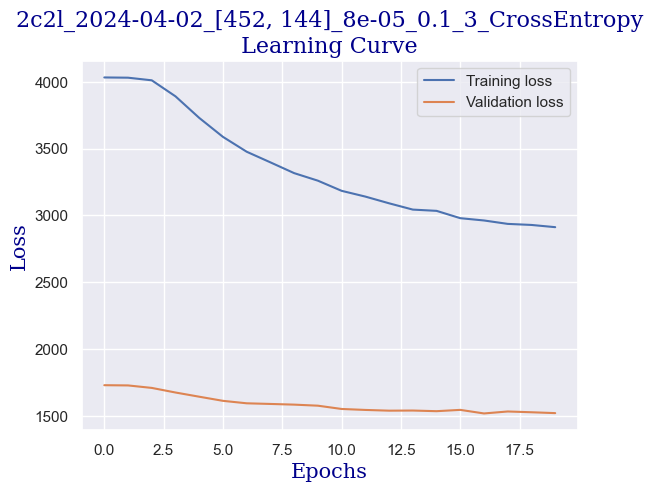

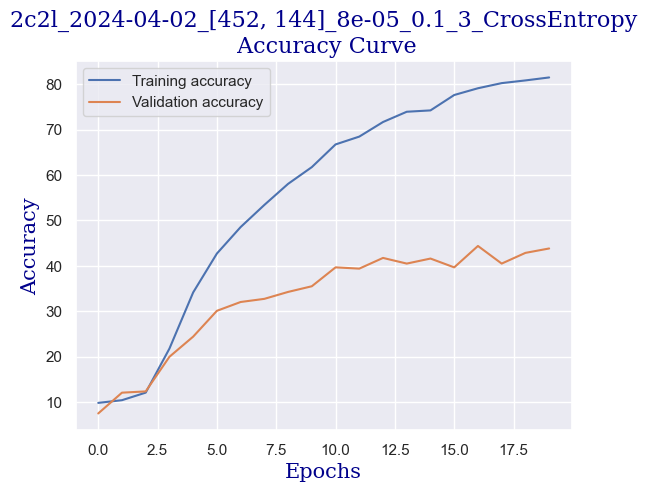

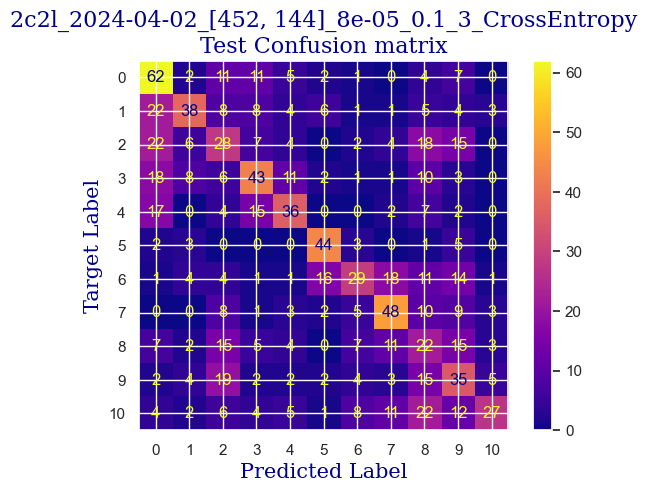

 
 END 2c2l [452, 144] Run Time:  6126.478833439003
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
201766.211567106
201754.882511001
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.863771564544914
validating...


  5%|██▎                                          | 1/20 [00:34<11:02, 34.89s/it]

validation accuracy:  12.343966712898752
Training...
train accuracy:  15.645449137418204
validating...


 10%|████▌                                        | 2/20 [01:09<10:28, 34.92s/it]

validation accuracy:  25.24271844660194
Training...
train accuracy:  31.112433075550268
validating...


 15%|██████▊                                      | 3/20 [01:44<09:53, 34.90s/it]

validation accuracy:  31.206657420249652
Training...
train accuracy:  43.426531826293875
validating...


 20%|█████████                                    | 4/20 [02:19<09:18, 34.88s/it]

validation accuracy:  34.812760055478506
Training...
train accuracy:  49.732302201070794
validating...


 25%|███████████▎                                 | 5/20 [02:54<08:43, 34.87s/it]

validation accuracy:  34.39667128987517
Training...
train accuracy:  55.02676977989292
validating...


 30%|█████████████▌                               | 6/20 [03:29<08:08, 34.88s/it]

validation accuracy:  34.95145631067961
Training...
train accuracy:  58.35812016656752
validating...


 35%|███████████████▋                             | 7/20 [04:04<07:32, 34.84s/it]

validation accuracy:  35.64493758668516
Training...
train accuracy:  62.224866151100535
validating...


 40%|██████████████████                           | 8/20 [04:39<06:58, 34.88s/it]

validation accuracy:  35.22884882108183
Training...
train accuracy:  64.54491374182034
validating...


 45%|████████████████████▎                        | 9/20 [05:13<06:23, 34.89s/it]

validation accuracy:  37.17059639389736
Training...
train accuracy:  66.86496133254015
validating...


 50%|██████████████████████                      | 10/20 [05:48<05:48, 34.89s/it]

validation accuracy:  34.39667128987517
Training...
train accuracy:  67.40035693039857
validating...


 55%|████████████████████████▏                   | 11/20 [06:23<05:13, 34.85s/it]

validation accuracy:  32.73231622746186
Training...
train accuracy:  69.18500892325996
validating...


 60%|██████████████████████████▍                 | 12/20 [06:58<04:38, 34.83s/it]

validation accuracy:  33.14840499306519
Training...
train accuracy:  69.60142772159429
validating...


 65%|████████████████████████████▌               | 13/20 [07:33<04:03, 34.83s/it]

validation accuracy:  36.754507628294036
Training...
train accuracy:  70.2558001189768
validating...


 70%|██████████████████████████████▊             | 14/20 [08:07<03:28, 34.82s/it]

validation accuracy:  35.367545076282944
Training...
train accuracy:  72.27840571088637
validating...


 75%|█████████████████████████████████           | 15/20 [08:42<02:54, 34.80s/it]

validation accuracy:  32.45492371705964
Training...
train accuracy:  71.62403331350387
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:17<02:19, 34.80s/it]

validation accuracy:  34.11927877947296
Training...
train accuracy:  74.12254610350982
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:52<01:44, 34.81s/it]

validation accuracy:  35.92233009708738
Training...
train accuracy:  74.30101130279596
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:27<01:09, 34.83s/it]

validation accuracy:  32.45492371705964
Training...
train accuracy:  74.24152290303391
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:02<00:34, 34.82s/it]

validation accuracy:  33.980582524271846
Training...
train accuracy:  75.60975609756098
validating...


100%|████████████████████████████████████████████| 20/20 [11:36<00:00, 34.85s/it]

validation accuracy:  35.92233009708738
Testing...


 
 train acc:  75.60975609756098
 
 val acc:  35.92233009708738
 
 test acc:  34.75728155339806


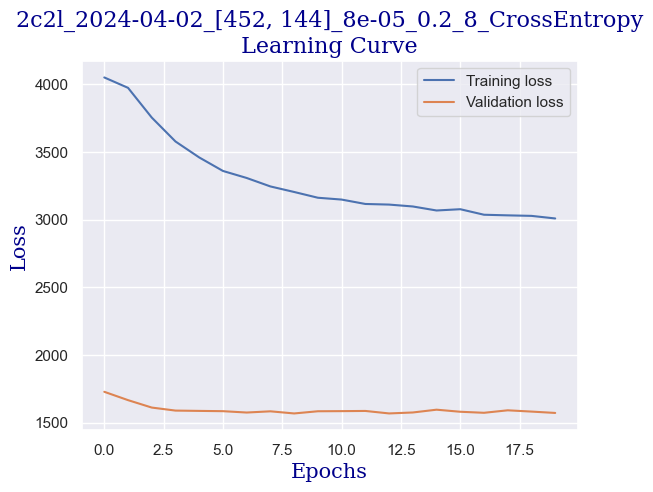

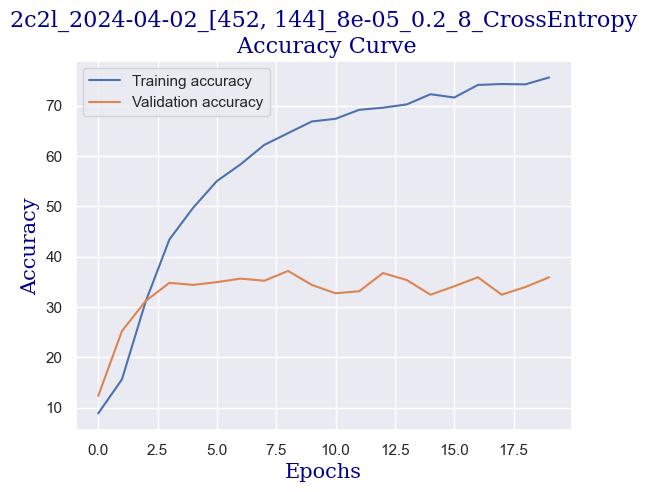

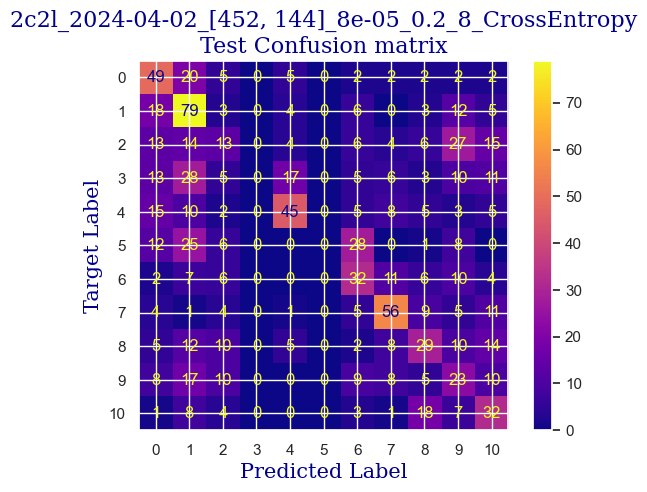

 
 END 2c2l [452, 144] Run Time:  6120.630143889022
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
207886.842794157
207875.513714468
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  10.707911957168353
validating...


  5%|██▎                                          | 1/20 [00:34<11:00, 34.77s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.637120761451518
validating...


 10%|████▌                                        | 2/20 [01:09<10:26, 34.81s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  13.56335514574658
validating...


 15%|██████▊                                      | 3/20 [01:44<09:52, 34.88s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  21.29684711481261
validating...


 20%|█████████                                    | 4/20 [02:19<09:17, 34.84s/it]

validation accuracy:  18.58529819694868
Training...
train accuracy:  30.160618679357526
validating...


 25%|███████████▎                                 | 5/20 [02:54<08:42, 34.87s/it]

validation accuracy:  25.79750346740638
Training...
train accuracy:  35.693039857227845
validating...


 30%|█████████████▌                               | 6/20 [03:29<08:08, 34.91s/it]

validation accuracy:  27.877947295423024
Training...
train accuracy:  39.321832242712674
validating...


 35%|███████████████▋                             | 7/20 [04:04<07:33, 34.88s/it]

validation accuracy:  30.097087378640776
Training...
train accuracy:  46.57941701368233
validating...


 40%|██████████████████                           | 8/20 [04:38<06:58, 34.85s/it]

validation accuracy:  31.206657420249652
Training...
train accuracy:  49.196906603212376
validating...


 45%|████████████████████▎                        | 9/20 [05:13<06:23, 34.88s/it]

validation accuracy:  31.900138696255205
Training...
train accuracy:  50.62462819750149
validating...


 50%|██████████████████████                      | 10/20 [05:48<05:48, 34.87s/it]

validation accuracy:  31.206657420249652
Training...
train accuracy:  52.58774538964902
validating...


 55%|████████████████████████▏                   | 11/20 [06:23<05:13, 34.85s/it]

validation accuracy:  28.71012482662968
Training...
train accuracy:  53.42058298631767
validating...


 60%|██████████████████████████▍                 | 12/20 [06:58<04:38, 34.83s/it]

validation accuracy:  29.126213592233007
Training...
train accuracy:  56.157049375371805
validating...


 65%|████████████████████████████▌               | 13/20 [07:33<04:03, 34.83s/it]

validation accuracy:  31.345353675450767
Training...
train accuracy:  56.69244497323022
validating...


 70%|██████████████████████████████▊             | 14/20 [08:07<03:29, 34.84s/it]

validation accuracy:  34.674063800277395
Training...
train accuracy:  58.83402736466389
validating...


 75%|█████████████████████████████████           | 15/20 [08:42<02:54, 34.84s/it]

validation accuracy:  35.09015256588072
Training...
train accuracy:  59.60737656157049
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:17<02:19, 34.85s/it]

validation accuracy:  35.50624133148405
Training...
train accuracy:  61.1540749553837
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:52<01:44, 34.86s/it]

validation accuracy:  34.535367545076284
Training...
train accuracy:  63.950029744199874
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:27<01:09, 34.81s/it]

validation accuracy:  37.7253814147018
Training...
train accuracy:  64.00951814396193
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:02<00:34, 34.83s/it]

validation accuracy:  36.1997226074896
Training...
train accuracy:  65.79417013682331
validating...


100%|████████████████████████████████████████████| 20/20 [11:36<00:00, 34.84s/it]

validation accuracy:  36.754507628294036
Testing...


 
 train acc:  65.79417013682331
 
 val acc:  36.754507628294036
 
 test acc:  35.24271844660194


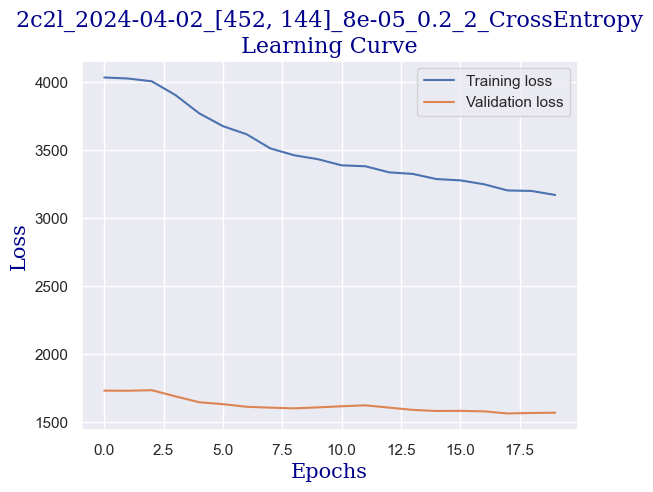

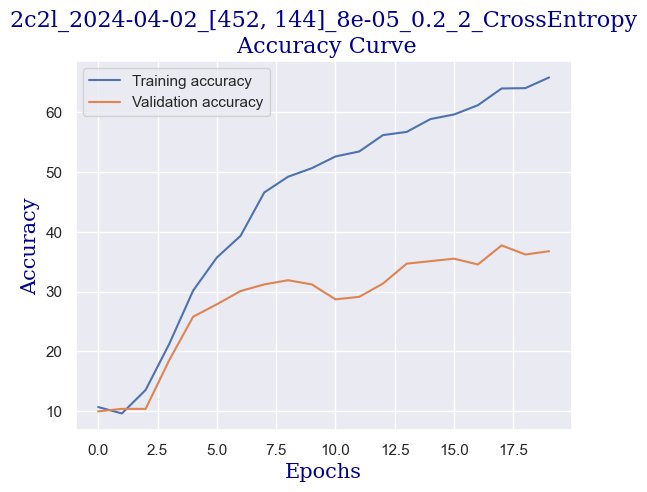

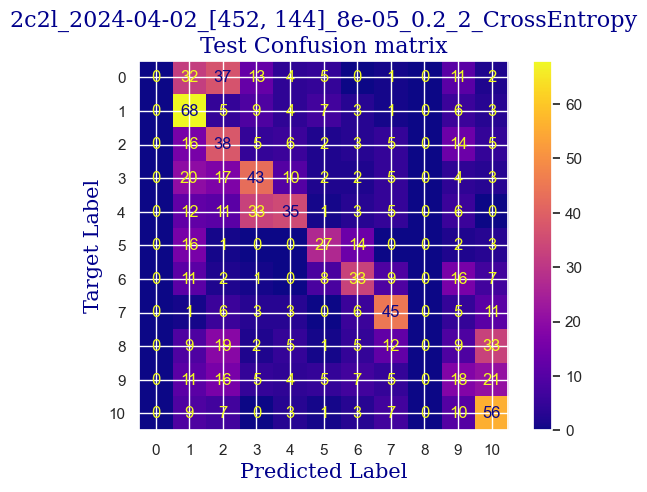

 
 END 2c2l [452, 144] Run Time:  6115.861518756981
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
214002.705230198
213991.37614848602
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  10.350981558596075
validating...


  5%|██▎                                          | 1/20 [00:34<11:02, 34.86s/it]

validation accuracy:  8.876560332871012
Training...
train accuracy:  14.931588340273647
validating...


 10%|████▌                                        | 2/20 [01:09<10:28, 34.92s/it]

validation accuracy:  19.14008321775312
Training...
train accuracy:  32.00475907198096
validating...


 15%|██████▊                                      | 3/20 [01:44<09:52, 34.85s/it]

validation accuracy:  29.126213592233007
Training...
train accuracy:  44.02141582391434
validating...


 20%|█████████                                    | 4/20 [02:19<09:18, 34.90s/it]

validation accuracy:  31.206657420249652
Training...
train accuracy:  53.896490184414034
validating...


 25%|███████████▎                                 | 5/20 [02:54<08:42, 34.86s/it]

validation accuracy:  38.41886269070735
Training...
train accuracy:  61.86793575252826
validating...


 30%|█████████████▌                               | 6/20 [03:29<08:07, 34.82s/it]

validation accuracy:  39.94452149791955
Training...
train accuracy:  66.50803093396787
validating...


 35%|███████████████▋                             | 7/20 [04:03<07:32, 34.80s/it]

validation accuracy:  43.41192787794729
Training...
train accuracy:  71.08863771564545
validating...


 40%|██████████████████                           | 8/20 [04:38<06:58, 34.83s/it]

validation accuracy:  41.74757281553398
Training...
train accuracy:  73.76561570493753
validating...


 45%|████████████████████▎                        | 9/20 [05:13<06:23, 34.82s/it]

validation accuracy:  42.302357836338416
Training...
train accuracy:  74.71743010113028
validating...


 50%|██████████████████████                      | 10/20 [05:48<05:48, 34.85s/it]

validation accuracy:  45.07628294036061
Training...
train accuracy:  76.56157049375372
validating...


 55%|████████████████████████▏                   | 11/20 [06:23<05:13, 34.85s/it]

validation accuracy:  44.24410540915395
Training...
train accuracy:  79.29803688280785
validating...


 60%|██████████████████████████▍                 | 12/20 [06:58<04:38, 34.83s/it]

validation accuracy:  45.07628294036061
Training...
train accuracy:  80.84473527662107
validating...


 65%|████████████████████████████▌               | 13/20 [07:33<04:04, 34.87s/it]

validation accuracy:  45.214979195561725
Training...
train accuracy:  82.21296847114813
validating...


 70%|██████████████████████████████▊             | 14/20 [08:07<03:29, 34.89s/it]

validation accuracy:  45.214979195561725
Training...
train accuracy:  82.62938726948245
validating...


 75%|█████████████████████████████████           | 15/20 [08:42<02:54, 34.85s/it]

validation accuracy:  43.13453536754508
Training...
train accuracy:  84.77096966091612
validating...


 80%|███████████████████████████████████▏        | 16/20 [09:17<02:19, 34.86s/it]

validation accuracy:  44.382801664355064
Training...
train accuracy:  84.94943486020226
validating...


 85%|█████████████████████████████████████▍      | 17/20 [09:52<01:44, 34.84s/it]

validation accuracy:  47.57281553398058
Training...
train accuracy:  84.53301606186794
validating...


 90%|███████████████████████████████████████▌    | 18/20 [10:27<01:09, 34.83s/it]

validation accuracy:  45.63106796116505
Training...
train accuracy:  85.72278405710885
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [11:02<00:34, 34.82s/it]

validation accuracy:  47.43411927877948
Training...
train accuracy:  86.0202260559191
validating...


100%|████████████████████████████████████████████| 20/20 [11:36<00:00, 34.84s/it]

validation accuracy:  45.35367545076283
Testing...


 
 train acc:  86.0202260559191
 
 val acc:  45.35367545076283
 
 test acc:  40.0


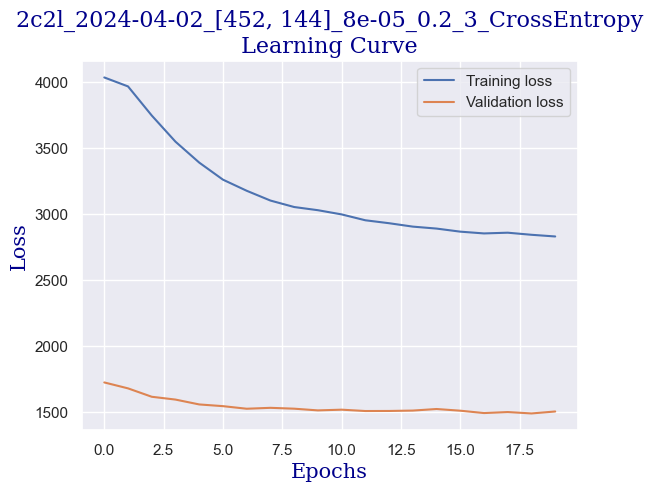

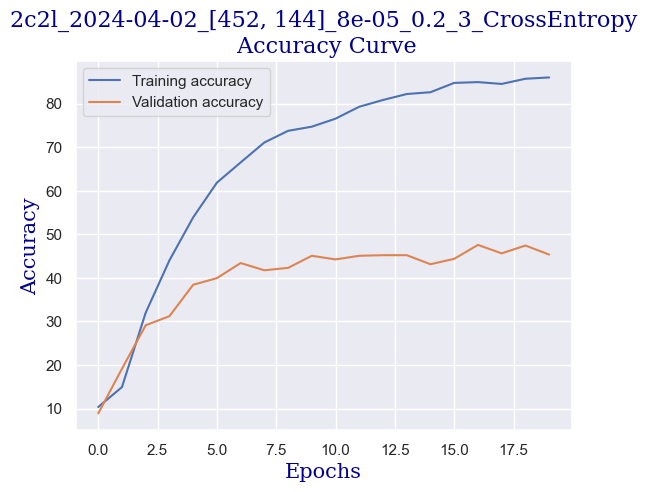

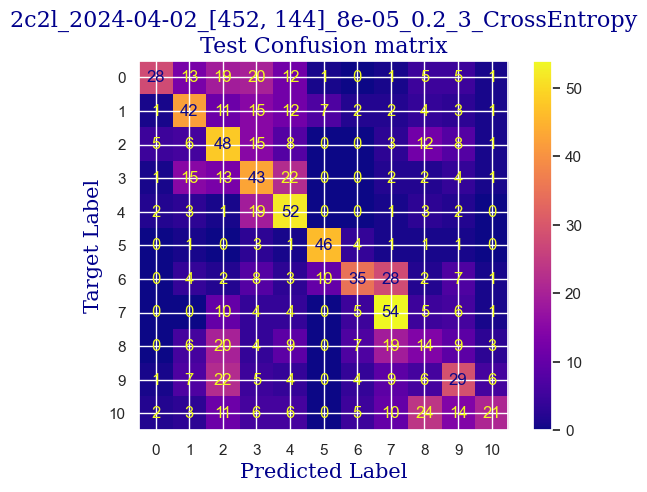

 
 END 2c2l [452, 144] Run Time:  6121.538388228015
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
220124.244531441
220112.915450892
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  10.291493158834028
validating...


  5%|██▎                                          | 1/20 [00:13<04:14, 13.38s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.113027959547887
validating...


 10%|████▌                                        | 2/20 [00:26<03:57, 13.22s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.719214753123142
validating...


 15%|██████▊                                      | 3/20 [00:39<03:44, 13.20s/it]

validation accuracy:  13.314840499306518
Training...
train accuracy:  21.534800713860797
validating...


 20%|█████████                                    | 4/20 [00:52<03:29, 13.12s/it]

validation accuracy:  26.768377253814148
Training...
train accuracy:  30.339083878643663
validating...


 25%|███████████▎                                 | 5/20 [01:06<03:19, 13.32s/it]

validation accuracy:  32.87101248266297
Training...
train accuracy:  35.63355145746579
validating...


 30%|█████████████▌                               | 6/20 [01:19<03:05, 13.28s/it]

validation accuracy:  33.70319001386963
Training...
train accuracy:  39.08387864366449
validating...


 35%|███████████████▋                             | 7/20 [01:32<02:51, 13.19s/it]

validation accuracy:  33.00970873786408
Training...
train accuracy:  42.1772754312909
validating...


 40%|██████████████████                           | 8/20 [01:45<02:37, 13.16s/it]

validation accuracy:  32.87101248266297
Training...
train accuracy:  45.508625817965495
validating...


 45%|████████████████████▎                        | 9/20 [01:59<02:26, 13.29s/it]

validation accuracy:  35.09015256588072
Training...
train accuracy:  47.055324211778704
validating...


 50%|██████████████████████                      | 10/20 [02:12<02:12, 13.22s/it]

validation accuracy:  35.367545076282944
Training...
train accuracy:  48.423557406305775
validating...


 55%|████████████████████████▏                   | 11/20 [02:25<01:58, 13.18s/it]

validation accuracy:  37.03190013869626
Training...
train accuracy:  50.98155859607376
validating...


 60%|██████████████████████████▍                 | 12/20 [02:38<01:45, 13.15s/it]

validation accuracy:  34.535367545076284
Training...
train accuracy:  51.99286139202856
validating...


 65%|████████████████████████████▌               | 13/20 [02:51<01:32, 13.15s/it]

validation accuracy:  35.64493758668516
Training...
train accuracy:  54.25342058298632
validating...


 70%|██████████████████████████████▊             | 14/20 [03:04<01:18, 13.16s/it]

validation accuracy:  37.447988904299585
Training...
train accuracy:  56.03807257584771
validating...


 75%|█████████████████████████████████           | 15/20 [03:17<01:05, 13.11s/it]

validation accuracy:  38.00277392510402
Training...
train accuracy:  58.17965496728138
validating...


 80%|███████████████████████████████████▏        | 16/20 [03:30<00:52, 13.08s/it]

validation accuracy:  38.97364771151179
Training...
train accuracy:  59.19095776323617
validating...


 85%|█████████████████████████████████████▍      | 17/20 [03:44<00:39, 13.22s/it]

validation accuracy:  38.83495145631068
Training...
train accuracy:  60.73765615704938
validating...


 90%|███████████████████████████████████████▌    | 18/20 [03:57<00:26, 13.19s/it]

validation accuracy:  39.94452149791955
Training...
train accuracy:  61.09458655562165
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [04:10<00:13, 13.14s/it]

validation accuracy:  40.221914008321775
Training...
train accuracy:  62.10588935157644
validating...


100%|████████████████████████████████████████████| 20/20 [04:23<00:00, 13.18s/it]

validation accuracy:  40.083217753120664
Testing...


 
 train acc:  62.10588935157644
 
 val acc:  40.083217753120664
 
 test acc:  37.76699029126214


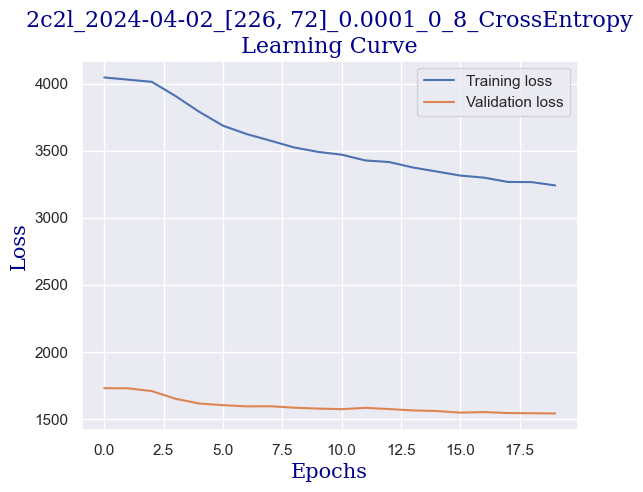

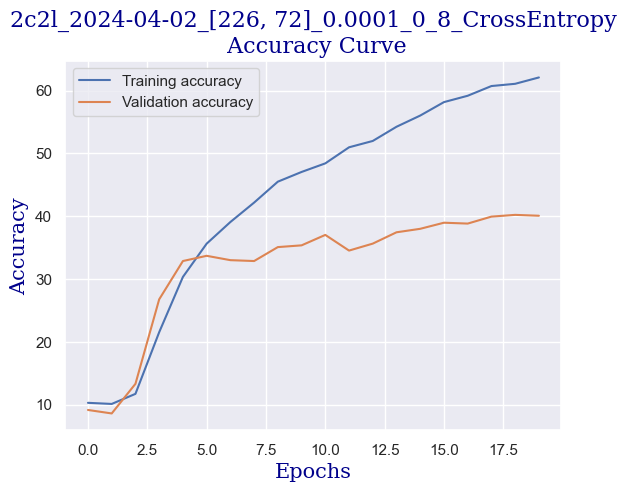

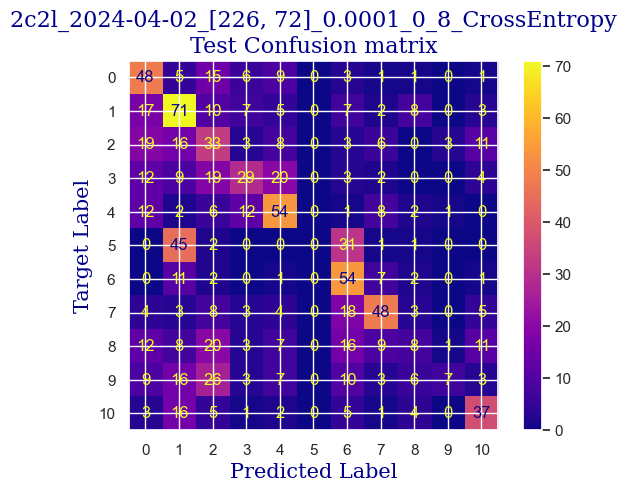

 
 END 2c2l [226, 72] Run Time:  4324.084626838972
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
224448.330130981
224437.001048531
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.75609756097561
validating...


  5%|██▎                                          | 1/20 [00:13<04:10, 13.20s/it]

validation accuracy:  11.650485436893204
Training...
train accuracy:  15.288518738845925
validating...


 10%|████▌                                        | 2/20 [00:26<03:57, 13.21s/it]

validation accuracy:  17.475728155339805
Training...
train accuracy:  27.72159428911362
validating...


 15%|██████▊                                      | 3/20 [00:39<03:43, 13.17s/it]

validation accuracy:  26.907073509015255
Training...
train accuracy:  35.336109458655564
validating...


 20%|█████████                                    | 4/20 [00:52<03:30, 13.13s/it]

validation accuracy:  30.374479889042995
Training...
train accuracy:  40.92801903628792
validating...


 25%|███████████▎                                 | 5/20 [01:06<03:21, 13.42s/it]

validation accuracy:  31.206657420249652
Training...
train accuracy:  45.92504461629982
validating...


 30%|█████████████▌                               | 6/20 [01:19<03:06, 13.31s/it]

validation accuracy:  30.929264909847433
Training...
train accuracy:  48.30458060678168
validating...


 35%|███████████████▋                             | 7/20 [01:32<02:52, 13.26s/it]

validation accuracy:  32.45492371705964
Training...
train accuracy:  51.16002379535991
validating...


 40%|██████████████████                           | 8/20 [01:45<02:38, 13.18s/it]

validation accuracy:  30.929264909847433
Training...
train accuracy:  54.729327781082695
validating...


 45%|████████████████████▎                        | 9/20 [01:58<02:24, 13.14s/it]

validation accuracy:  33.287101248266296
Training...
train accuracy:  59.13146936347412
validating...


 50%|██████████████████████                      | 10/20 [02:12<02:12, 13.20s/it]

validation accuracy:  36.33841886269071
Training...
train accuracy:  59.60737656157049
validating...


 55%|████████████████████████▏                   | 11/20 [02:25<01:58, 13.19s/it]

validation accuracy:  32.87101248266297
Training...
train accuracy:  62.0464009518144
validating...


 60%|██████████████████████████▍                 | 12/20 [02:38<01:45, 13.15s/it]

validation accuracy:  33.00970873786408
Training...
train accuracy:  62.0464009518144
validating...


 65%|████████████████████████████▌               | 13/20 [02:51<01:31, 13.11s/it]

validation accuracy:  34.674063800277395
Training...
train accuracy:  64.30696014277217
validating...


 70%|██████████████████████████████▊             | 14/20 [03:05<01:19, 13.26s/it]

validation accuracy:  34.812760055478506
Training...
train accuracy:  65.19928613920285
validating...


 75%|█████████████████████████████████           | 15/20 [03:18<01:05, 13.20s/it]

validation accuracy:  35.92233009708738
Training...
train accuracy:  64.78286734086853
validating...


 80%|███████████████████████████████████▏        | 16/20 [03:31<00:52, 13.18s/it]

validation accuracy:  37.447988904299585
Training...
train accuracy:  68.05472932778109
validating...


 85%|█████████████████████████████████████▍      | 17/20 [03:44<00:39, 13.20s/it]

validation accuracy:  38.55755894590846
Training...
train accuracy:  68.29268292682927
validating...


 90%|███████████████████████████████████████▌    | 18/20 [03:58<00:26, 13.30s/it]

validation accuracy:  36.754507628294036
Training...
train accuracy:  70.43426531826293
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [04:11<00:13, 13.21s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  71.20761451516954
validating...


100%|████████████████████████████████████████████| 20/20 [04:24<00:00, 13.20s/it]

validation accuracy:  37.447988904299585
Testing...


 
 train acc:  71.20761451516954
 
 val acc:  37.447988904299585
 
 test acc:  36.407766990291265


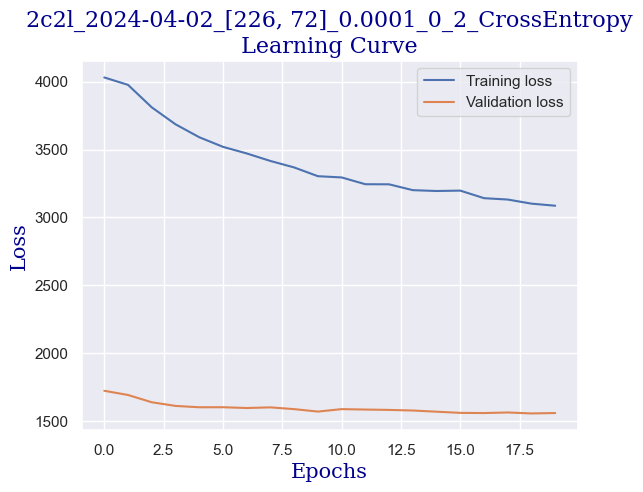

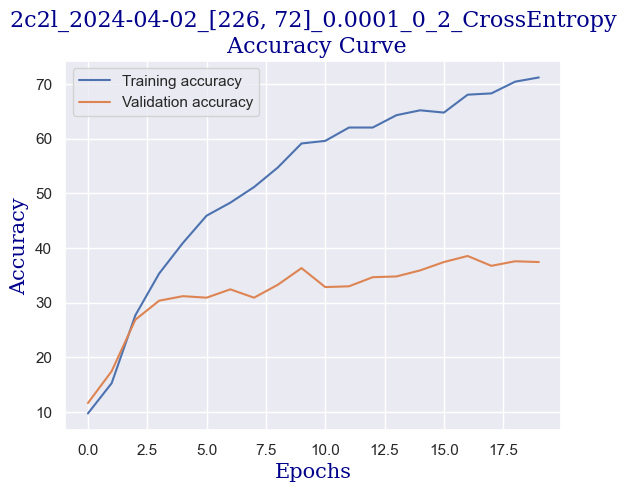

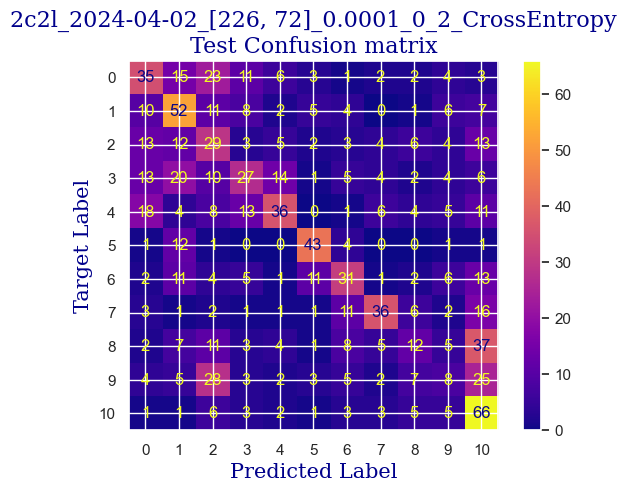

 
 END 2c2l [226, 72] Run Time:  4331.335611294024
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
228779.666777578
228768.33769726902
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.696609161213564
validating...


  5%|██▎                                          | 1/20 [00:13<04:13, 13.35s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  15.050565139797738
validating...


 10%|████▌                                        | 2/20 [00:26<03:57, 13.18s/it]

validation accuracy:  21.081830790568652
Training...
train accuracy:  31.290898274836408
validating...


 15%|██████▊                                      | 3/20 [00:39<03:43, 13.14s/it]

validation accuracy:  33.980582524271846
Training...
train accuracy:  41.46341463414634
validating...


 20%|█████████                                    | 4/20 [00:52<03:30, 13.16s/it]

validation accuracy:  37.447988904299585
Training...
train accuracy:  47.293277810826886
validating...


 25%|███████████▎                                 | 5/20 [01:05<03:17, 13.14s/it]

validation accuracy:  37.86407766990291
Training...
train accuracy:  51.45746579417013
validating...


 30%|█████████████▌                               | 6/20 [01:19<03:05, 13.22s/it]

validation accuracy:  38.83495145631068
Training...
train accuracy:  53.12314098750743
validating...


 35%|███████████████▋                             | 7/20 [01:32<02:51, 13.19s/it]

validation accuracy:  39.389736477115115
Training...
train accuracy:  55.44318857822724
validating...


 40%|██████████████████                           | 8/20 [01:45<02:37, 13.15s/it]

validation accuracy:  39.1123439667129
Training...
train accuracy:  56.930398572278406
validating...


 45%|████████████████████▎                        | 9/20 [01:58<02:24, 13.13s/it]

validation accuracy:  42.163661581137305
Training...
train accuracy:  60.85663295657346
validating...


 50%|██████████████████████                      | 10/20 [02:12<02:12, 13.27s/it]

validation accuracy:  44.24410540915395
Training...
train accuracy:  61.629982153480064
validating...


 55%|████████████████████████▏                   | 11/20 [02:25<01:59, 13.25s/it]

validation accuracy:  47.156726768377254
Training...
train accuracy:  61.808447352766215
validating...


 60%|██████████████████████████▍                 | 12/20 [02:38<01:45, 13.20s/it]

validation accuracy:  43.689320388349515
Training...
train accuracy:  63.236168947055326
validating...


 65%|████████████████████████████▌               | 13/20 [02:51<01:32, 13.21s/it]

validation accuracy:  40.49930651872399
Training...
train accuracy:  63.77156454491374
validating...


 70%|██████████████████████████████▊             | 14/20 [03:05<01:19, 13.31s/it]

validation accuracy:  44.24410540915395
Training...
train accuracy:  65.97263533610946
validating...


 75%|█████████████████████████████████           | 15/20 [03:18<01:06, 13.29s/it]

validation accuracy:  45.35367545076283
Training...
train accuracy:  65.13979773944081
validating...


 80%|███████████████████████████████████▏        | 16/20 [03:31<00:52, 13.24s/it]

validation accuracy:  44.24410540915395
Training...
train accuracy:  66.56751933372992
validating...


 85%|█████████████████████████████████████▍      | 17/20 [03:44<00:39, 13.21s/it]

validation accuracy:  42.995839112343965
Training...
train accuracy:  67.87626412849494
validating...


 90%|███████████████████████████████████████▌    | 18/20 [03:58<00:26, 13.38s/it]

validation accuracy:  44.9375866851595
Training...
train accuracy:  69.83938132064247
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [04:11<00:13, 13.27s/it]

validation accuracy:  45.35367545076283
Training...
train accuracy:  69.72040452111838
validating...


100%|████████████████████████████████████████████| 20/20 [04:24<00:00, 13.23s/it]

validation accuracy:  45.63106796116505
Testing...


 
 train acc:  69.72040452111838
 
 val acc:  45.63106796116505
 
 test acc:  42.52427184466019


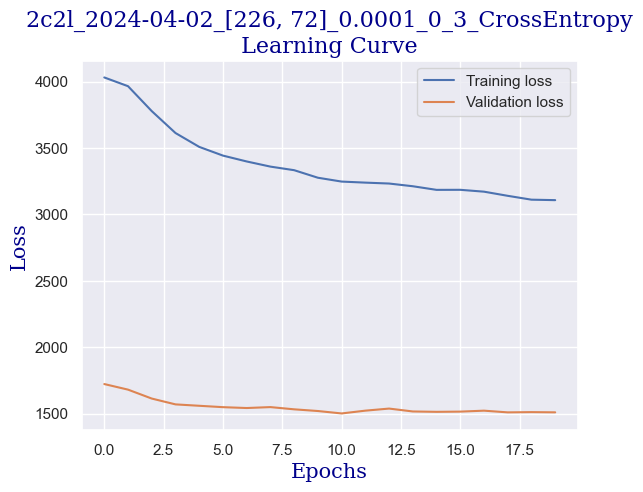

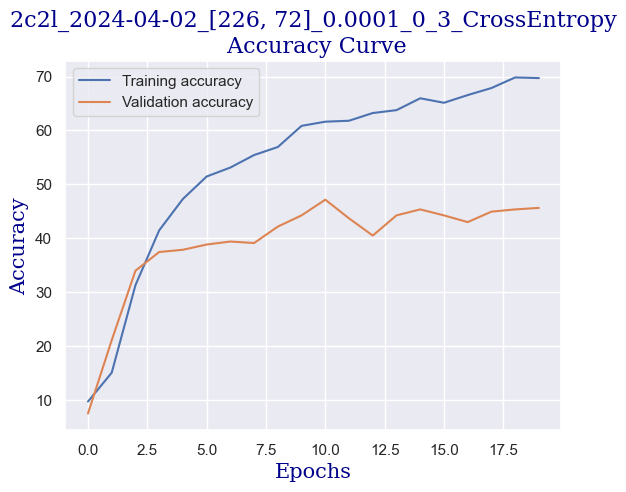

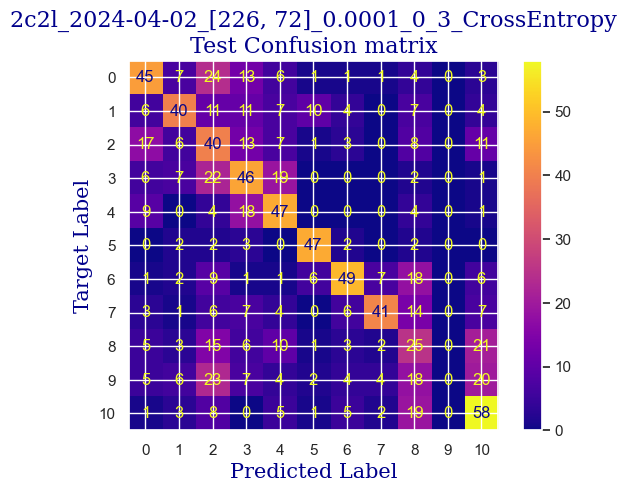

 
 END 2c2l [226, 72] Run Time:  4351.688226002996
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
233131.356377734
233120.027305335
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.161213563355146
validating...


  5%|██▎                                          | 1/20 [00:13<04:15, 13.47s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  13.146936347412256
validating...


 10%|████▌                                        | 2/20 [00:26<03:58, 13.24s/it]

validation accuracy:  20.665742024965326
Training...
train accuracy:  25.10410469958358
validating...


 15%|██████▊                                      | 3/20 [00:39<03:44, 13.20s/it]

validation accuracy:  28.71012482662968
Training...
train accuracy:  33.135038667459845
validating...


 20%|█████████                                    | 4/20 [00:52<03:30, 13.19s/it]

validation accuracy:  33.287101248266296
Training...
train accuracy:  38.54848304580607
validating...


 25%|███████████▎                                 | 5/20 [01:05<03:17, 13.16s/it]

validation accuracy:  38.28016643550624
Training...
train accuracy:  43.66448542534206
validating...


 30%|█████████████▌                               | 6/20 [01:19<03:05, 13.24s/it]

validation accuracy:  39.1123439667129
Training...
train accuracy:  46.04402141582391
validating...


 35%|███████████████▋                             | 7/20 [01:32<02:51, 13.18s/it]

validation accuracy:  40.6380027739251
Training...
train accuracy:  49.01844140392623
validating...


 40%|██████████████████                           | 8/20 [01:45<02:37, 13.15s/it]

validation accuracy:  41.19278779472954
Training...
train accuracy:  50.743604997025585
validating...


 45%|████████████████████▎                        | 9/20 [01:58<02:24, 13.12s/it]

validation accuracy:  41.19278779472954
Training...
train accuracy:  52.88518738845925
validating...


 50%|██████████████████████                      | 10/20 [02:11<02:11, 13.20s/it]

validation accuracy:  41.74757281553398
Training...
train accuracy:  54.90779298036883
validating...


 55%|████████████████████████▏                   | 11/20 [02:25<01:58, 13.17s/it]

validation accuracy:  40.221914008321775
Training...
train accuracy:  56.51397977394408
validating...


 60%|██████████████████████████▍                 | 12/20 [02:38<01:45, 13.17s/it]

validation accuracy:  40.083217753120664
Training...
train accuracy:  57.22784057108864
validating...


 65%|████████████████████████████▌               | 13/20 [02:51<01:31, 13.13s/it]

validation accuracy:  40.083217753120664
Training...
train accuracy:  60.559190957763235
validating...


 70%|██████████████████████████████▊             | 14/20 [03:04<01:19, 13.28s/it]

validation accuracy:  39.66712898751734
Training...
train accuracy:  60.61867935752529
validating...


 75%|█████████████████████████████████           | 15/20 [03:17<01:05, 13.19s/it]

validation accuracy:  39.94452149791955
Training...
train accuracy:  61.21356335514575
validating...


 80%|███████████████████████████████████▏        | 16/20 [03:31<00:52, 13.18s/it]

validation accuracy:  40.36061026352289
Training...
train accuracy:  61.51100535395598
validating...


 85%|█████████████████████████████████████▍      | 17/20 [03:44<00:39, 13.15s/it]

validation accuracy:  41.74757281553398
Training...
train accuracy:  61.629982153480064
validating...


 90%|███████████████████████████████████████▌    | 18/20 [03:57<00:26, 13.33s/it]

validation accuracy:  39.94452149791955
Training...
train accuracy:  63.117192147531235
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [04:10<00:13, 13.26s/it]

validation accuracy:  40.083217753120664
Training...
train accuracy:  63.5930993456276
validating...


100%|████████████████████████████████████████████| 20/20 [04:24<00:00, 13.20s/it]

validation accuracy:  40.77669902912621
Testing...


 
 train acc:  63.5930993456276
 
 val acc:  40.77669902912621
 
 test acc:  38.640776699029125


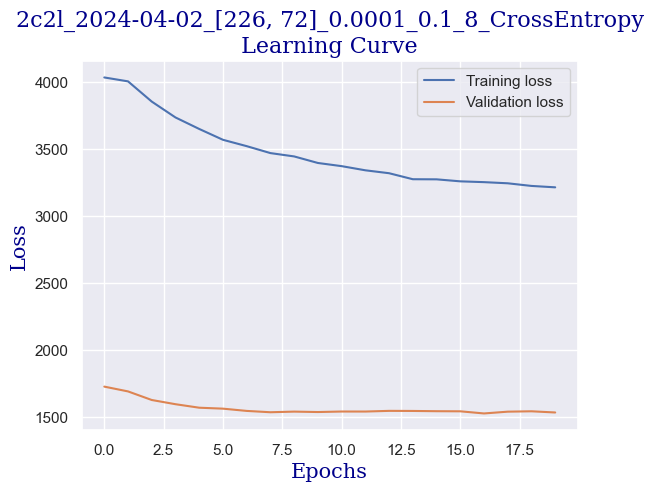

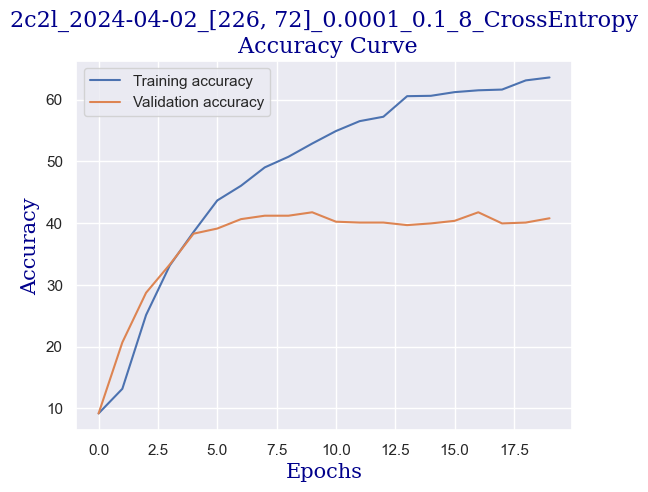

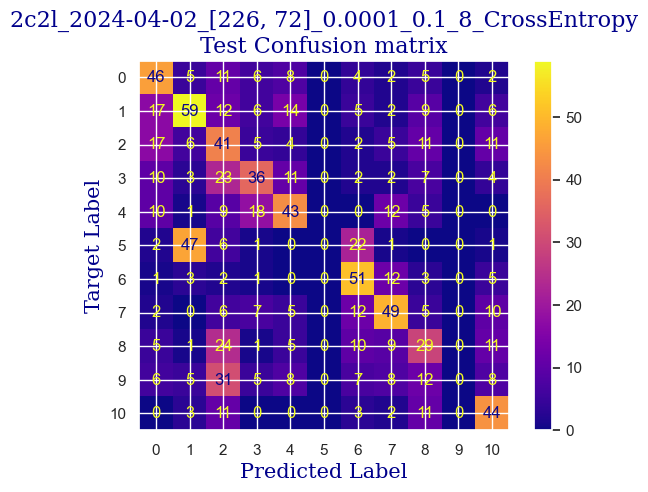

 
 END 2c2l [226, 72] Run Time:  4337.663415736024
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
237469.020853618
237457.691777145
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.447352766210589
validating...


  5%|██▎                                          | 1/20 [00:13<04:19, 13.65s/it]

validation accuracy:  8.876560332871012
Training...
train accuracy:  9.161213563355146
validating...


 10%|████▌                                        | 2/20 [00:26<04:00, 13.36s/it]

validation accuracy:  7.212205270457697
Training...
train accuracy:  9.339678762641284
validating...


 15%|██████▊                                      | 3/20 [00:39<03:44, 13.23s/it]

validation accuracy:  8.876560332871012
Training...
train accuracy:  10.350981558596075
validating...


 20%|█████████                                    | 4/20 [00:52<03:30, 13.18s/it]

validation accuracy:  10.818307905686545
Training...
train accuracy:  14.158239143367043
validating...


 25%|███████████▎                                 | 5/20 [01:06<03:17, 13.20s/it]

validation accuracy:  17.337031900138697
Training...
train accuracy:  24.806662700773348
validating...


 30%|█████████████▌                               | 6/20 [01:19<03:06, 13.33s/it]

validation accuracy:  27.184466019417474
Training...
train accuracy:  32.123735871505055
validating...


 35%|███████████████▋                             | 7/20 [01:32<02:52, 13.27s/it]

validation accuracy:  30.929264909847433
Training...
train accuracy:  37.35871505056514
validating...


 40%|██████████████████                           | 8/20 [01:45<02:38, 13.18s/it]

validation accuracy:  31.761442441054093
Training...
train accuracy:  39.440809042236765
validating...


 45%|████████████████████▎                        | 9/20 [01:59<02:25, 13.18s/it]

validation accuracy:  32.87101248266297
Training...
train accuracy:  42.653182629387274
validating...


 50%|██████████████████████                      | 10/20 [02:12<02:12, 13.21s/it]

validation accuracy:  33.56449375866852
Training...
train accuracy:  44.31885782272457
validating...


 55%|████████████████████████▏                   | 11/20 [02:25<01:58, 13.14s/it]

validation accuracy:  32.87101248266297
Training...
train accuracy:  46.34146341463415
validating...


 60%|██████████████████████████▍                 | 12/20 [02:38<01:45, 13.13s/it]

validation accuracy:  34.535367545076284
Training...
train accuracy:  48.54253420582986
validating...


 65%|████████████████████████████▌               | 13/20 [02:51<01:31, 13.11s/it]

validation accuracy:  31.900138696255205
Training...
train accuracy:  49.256395002974415
validating...


 70%|██████████████████████████████▊             | 14/20 [03:04<01:19, 13.17s/it]

validation accuracy:  32.73231622746186
Training...
train accuracy:  50.32718619869125
validating...


 75%|█████████████████████████████████           | 15/20 [03:18<01:05, 13.18s/it]

validation accuracy:  33.287101248266296
Training...
train accuracy:  51.576442593694225
validating...


 80%|███████████████████████████████████▏        | 16/20 [03:31<00:52, 13.18s/it]

validation accuracy:  34.95145631067961
Training...
train accuracy:  52.944675788221296
validating...


 85%|█████████████████████████████████████▍      | 17/20 [03:44<00:39, 13.15s/it]

validation accuracy:  36.89320388349515
Training...
train accuracy:  53.182629387269486
validating...


 90%|███████████████████████████████████████▌    | 18/20 [03:57<00:26, 13.28s/it]

validation accuracy:  34.674063800277395
Training...
train accuracy:  55.20523497917906
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [04:11<00:13, 13.25s/it]

validation accuracy:  34.39667128987517
Training...
train accuracy:  56.157049375371805
validating...


100%|████████████████████████████████████████████| 20/20 [04:24<00:00, 13.21s/it]

validation accuracy:  35.09015256588072
Testing...


 
 train acc:  56.157049375371805
 
 val acc:  35.09015256588072
 
 test acc:  35.728155339805824


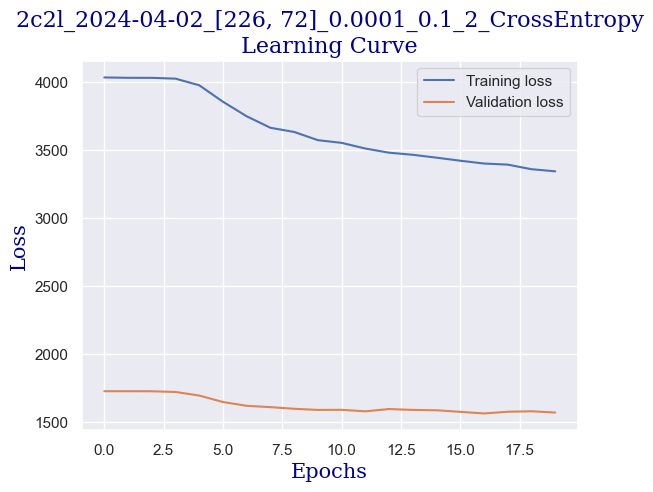

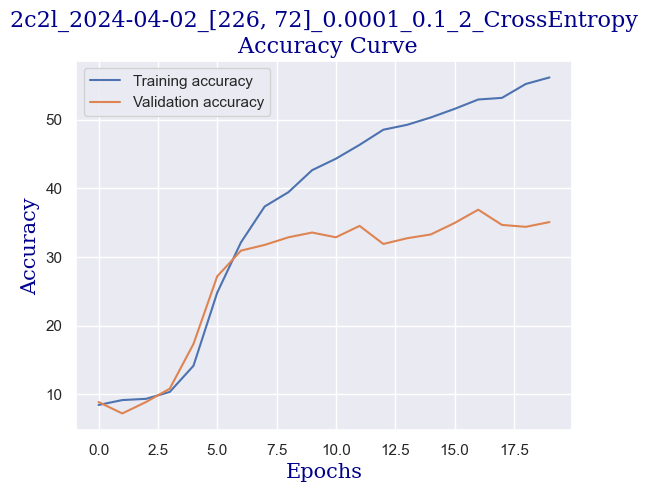

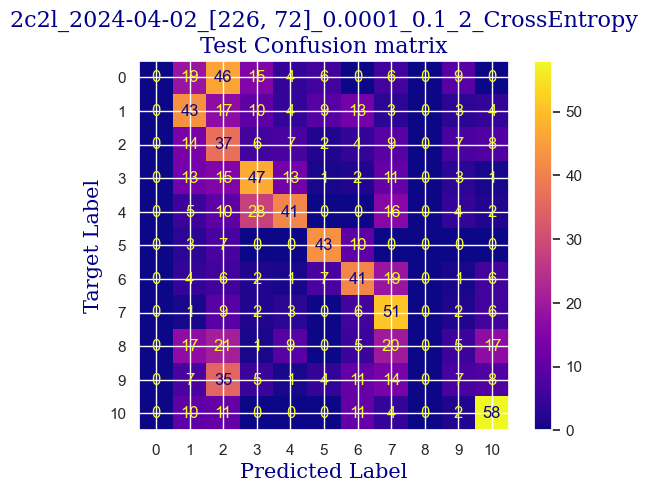

 
 END 2c2l [226, 72] Run Time:  4341.612819084985
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
241810.634575721
241799.305491383
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.637120761451518
validating...


  5%|██▎                                          | 1/20 [00:13<04:18, 13.60s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  10.58893515764426
validating...


 10%|████▌                                        | 2/20 [00:26<03:59, 13.33s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  20.761451516954192
validating...


 15%|██████▊                                      | 3/20 [00:39<03:44, 13.20s/it]

validation accuracy:  20.943134535367545
Training...
train accuracy:  31.588340273646637
validating...


 20%|█████████                                    | 4/20 [00:52<03:31, 13.20s/it]

validation accuracy:  30.513176144244103
Training...
train accuracy:  37.9535990481856
validating...


 25%|███████████▎                                 | 5/20 [01:06<03:18, 13.22s/it]

validation accuracy:  32.87101248266297
Training...
train accuracy:  42.1772754312909
validating...


 30%|█████████████▌                               | 6/20 [01:19<03:07, 13.37s/it]

validation accuracy:  33.980582524271846
Training...
train accuracy:  45.56811421772755
validating...


 35%|███████████████▋                             | 7/20 [01:32<02:52, 13.28s/it]

validation accuracy:  36.47711511789182
Training...
train accuracy:  48.78048780487805
validating...


 40%|██████████████████                           | 8/20 [01:46<02:39, 13.26s/it]

validation accuracy:  37.7253814147018
Training...
train accuracy:  51.04104699583581
validating...


 45%|████████████████████▎                        | 9/20 [01:59<02:25, 13.23s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  52.29030339083879
validating...


 50%|██████████████████████                      | 10/20 [02:12<02:13, 13.34s/it]

validation accuracy:  39.80582524271845
Training...
train accuracy:  56.03807257584771
validating...


 55%|████████████████████████▏                   | 11/20 [02:26<01:59, 13.25s/it]

validation accuracy:  40.77669902912621
Training...
train accuracy:  58.239143367043425
validating...


 60%|██████████████████████████▍                 | 12/20 [02:39<01:45, 13.22s/it]

validation accuracy:  41.33148404993065
Training...
train accuracy:  59.60737656157049
validating...


 65%|████████████████████████████▌               | 13/20 [02:52<01:32, 13.18s/it]

validation accuracy:  44.24410540915395
Training...
train accuracy:  60.916121356335516
validating...


 70%|██████████████████████████████▊             | 14/20 [03:05<01:19, 13.25s/it]

validation accuracy:  40.083217753120664
Training...
train accuracy:  62.34384295062463
validating...


 75%|█████████████████████████████████           | 15/20 [03:18<01:06, 13.23s/it]

validation accuracy:  40.77669902912621
Training...
train accuracy:  62.998215348007136
validating...


 80%|███████████████████████████████████▏        | 16/20 [03:31<00:52, 13.19s/it]

validation accuracy:  43.13453536754508
Training...
train accuracy:  64.42593694229625
validating...


 85%|█████████████████████████████████████▍      | 17/20 [03:45<00:39, 13.16s/it]

validation accuracy:  41.88626907073509
Training...
train accuracy:  65.2587745389649
validating...


 90%|███████████████████████████████████████▌    | 18/20 [03:58<00:26, 13.13s/it]

validation accuracy:  41.74757281553398
Training...
train accuracy:  65.73468173706128
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [04:11<00:13, 13.20s/it]

validation accuracy:  43.41192787794729
Training...
train accuracy:  65.31826293872695
validating...


100%|████████████████████████████████████████████| 20/20 [04:24<00:00, 13.23s/it]

validation accuracy:  43.27323162274618
Testing...


 
 train acc:  65.31826293872695
 
 val acc:  43.27323162274618
 
 test acc:  44.271844660194176


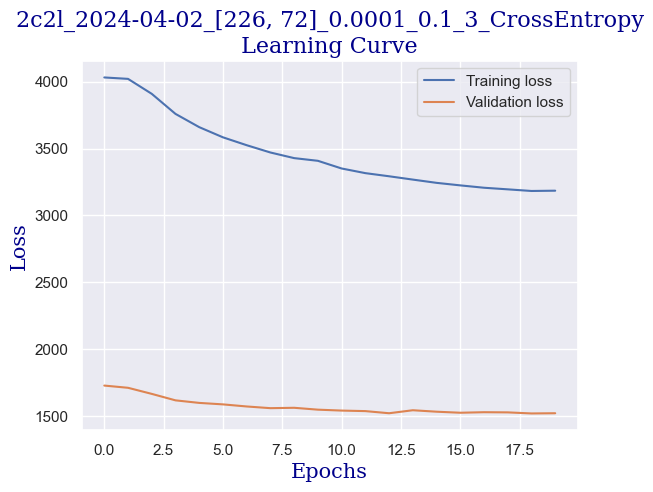

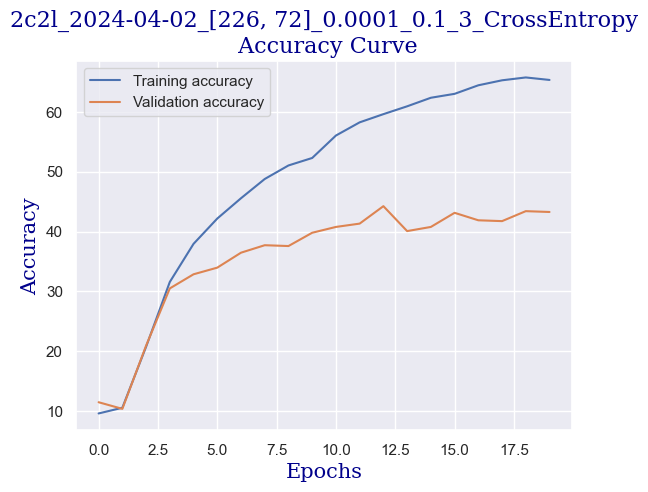

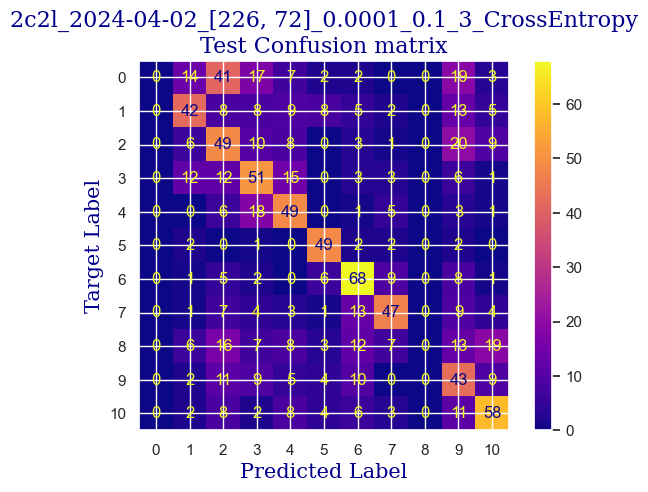

 
 END 2c2l [226, 72] Run Time:  4351.769277465006
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
246162.405128897
246151.076084274
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.934562760261748
validating...


  5%|██▎                                          | 1/20 [00:13<04:11, 13.24s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.113027959547887
validating...


 10%|████▌                                        | 2/20 [00:26<04:02, 13.45s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.934562760261748
validating...


 15%|██████▊                                      | 3/20 [00:39<03:45, 13.29s/it]

validation accuracy:  9.57004160887656
Training...
train accuracy:  10.23200475907198
validating...


 20%|█████████                                    | 4/20 [00:53<03:31, 13.21s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  14.455681142177276
validating...


 25%|███████████▎                                 | 5/20 [01:06<03:18, 13.22s/it]

validation accuracy:  15.53398058252427
Training...
train accuracy:  20.880428316478287
validating...


 30%|█████████████▌                               | 6/20 [01:19<03:07, 13.36s/it]

validation accuracy:  22.88488210818308
Training...
train accuracy:  30.220107079119572
validating...


 35%|███████████████▋                             | 7/20 [01:32<02:52, 13.27s/it]

validation accuracy:  28.43273231622746
Training...
train accuracy:  39.38132064247471
validating...


 40%|██████████████████                           | 8/20 [01:46<02:38, 13.25s/it]

validation accuracy:  33.42579750346741
Training...
train accuracy:  45.27067221891731
validating...


 45%|████████████████████▎                        | 9/20 [01:59<02:25, 13.19s/it]

validation accuracy:  36.89320388349515
Training...
train accuracy:  50.148720999405114
validating...


 50%|██████████████████████                      | 10/20 [02:12<02:13, 13.36s/it]

validation accuracy:  35.64493758668516
Training...
train accuracy:  52.0523497917906
validating...


 55%|████████████████████████▏                   | 11/20 [02:26<01:59, 13.30s/it]

validation accuracy:  34.812760055478506
Training...
train accuracy:  54.96728138013087
validating...


 60%|██████████████████████████▍                 | 12/20 [02:39<01:45, 13.24s/it]

validation accuracy:  36.061026352288486
Training...
train accuracy:  55.02676977989292
validating...


 65%|████████████████████████████▌               | 13/20 [02:52<01:32, 13.24s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  57.70374776918501
validating...


 70%|██████████████████████████████▊             | 14/20 [03:05<01:19, 13.23s/it]

validation accuracy:  38.83495145631068
Training...
train accuracy:  59.60737656157049
validating...


 75%|█████████████████████████████████           | 15/20 [03:18<01:06, 13.22s/it]

validation accuracy:  41.05409153952843
Training...
train accuracy:  60.142772159428915
validating...


 80%|███████████████████████████████████▏        | 16/20 [03:31<00:52, 13.18s/it]

validation accuracy:  38.97364771151179
Training...
train accuracy:  62.76026174895895
validating...


 85%|█████████████████████████████████████▍      | 17/20 [03:45<00:39, 13.14s/it]

validation accuracy:  39.80582524271845
Training...
train accuracy:  63.41463414634146
validating...


 90%|███████████████████████████████████████▌    | 18/20 [03:58<00:26, 13.14s/it]

validation accuracy:  40.36061026352289
Training...
train accuracy:  65.08030933967876
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [04:11<00:13, 13.31s/it]

validation accuracy:  40.36061026352289
Training...
train accuracy:  66.21058893515765
validating...


100%|████████████████████████████████████████████| 20/20 [04:25<00:00, 13.25s/it]

validation accuracy:  39.1123439667129
Testing...


 
 train acc:  66.21058893515765
 
 val acc:  39.1123439667129
 
 test acc:  37.86407766990291


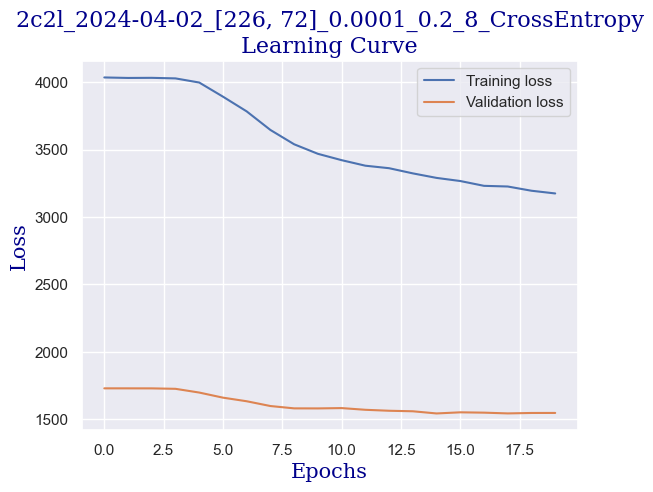

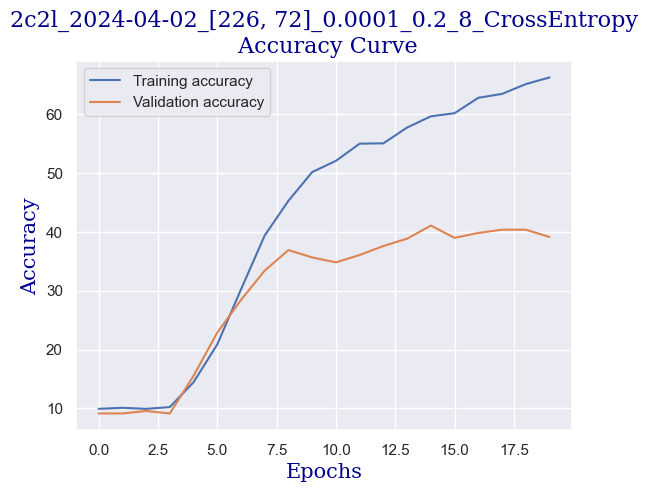

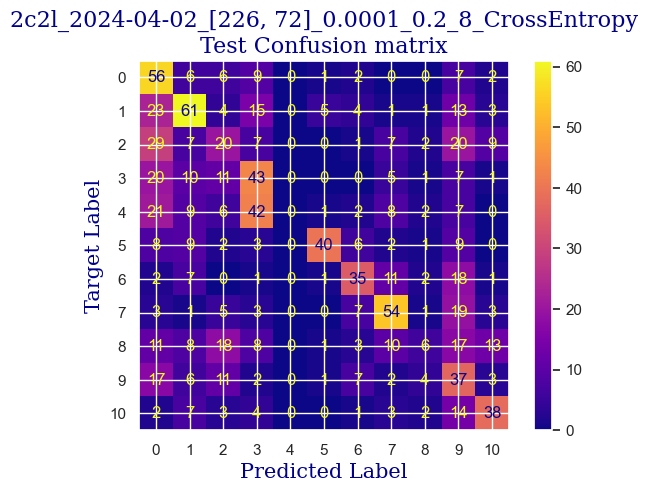

 
 END 2c2l [226, 72] Run Time:  4357.823837442003
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
250520.230224858
250508.901143967
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.815585960737657
validating...


  5%|██▎                                          | 1/20 [00:13<04:08, 13.06s/it]

validation accuracy:  10.124826629680998
Training...
train accuracy:  10.58893515764426
validating...


 10%|████▌                                        | 2/20 [00:26<03:57, 13.20s/it]

validation accuracy:  11.927877947295423
Training...
train accuracy:  17.19214753123141
validating...


 15%|██████▊                                      | 3/20 [00:39<03:43, 13.14s/it]

validation accuracy:  22.74618585298197
Training...
train accuracy:  30.220107079119572
validating...


 20%|█████████                                    | 4/20 [00:52<03:30, 13.14s/it]

validation accuracy:  29.126213592233007
Training...
train accuracy:  39.321832242712674
validating...


 25%|███████████▎                                 | 5/20 [01:05<03:16, 13.11s/it]

validation accuracy:  31.06796116504854
Training...
train accuracy:  45.56811421772755
validating...


 30%|█████████████▌                               | 6/20 [01:19<03:05, 13.24s/it]

validation accuracy:  31.761442441054093
Training...
train accuracy:  50.148720999405114
validating...


 35%|███████████████▋                             | 7/20 [01:32<02:52, 13.26s/it]

validation accuracy:  34.39667128987517
Training...
train accuracy:  52.409280190362885
validating...


 40%|██████████████████                           | 8/20 [01:45<02:38, 13.17s/it]

validation accuracy:  36.061026352288486
Training...
train accuracy:  56.39500297441998
validating...


 45%|████████████████████▎                        | 9/20 [01:58<02:24, 13.13s/it]

validation accuracy:  36.754507628294036
Training...
train accuracy:  56.811421772754315
validating...


 50%|██████████████████████                      | 10/20 [02:11<02:12, 13.26s/it]

validation accuracy:  37.17059639389736
Training...
train accuracy:  58.65556216537775
validating...


 55%|████████████████████████▏                   | 11/20 [02:25<01:59, 13.24s/it]

validation accuracy:  37.309292649098474
Training...
train accuracy:  60.916121356335516
validating...


 60%|██████████████████████████▍                 | 12/20 [02:38<01:45, 13.20s/it]

validation accuracy:  36.47711511789182
Training...
train accuracy:  62.7007733491969
validating...


 65%|████████████████████████████▌               | 13/20 [02:51<01:32, 13.18s/it]

validation accuracy:  38.55755894590846
Training...
train accuracy:  62.28435455086259
validating...


 70%|██████████████████████████████▊             | 14/20 [03:04<01:19, 13.18s/it]

validation accuracy:  39.80582524271845
Training...
train accuracy:  64.42593694229625
validating...


 75%|█████████████████████████████████           | 15/20 [03:17<01:06, 13.21s/it]

validation accuracy:  38.141470180305134
Training...
train accuracy:  65.02082093991672
validating...


 80%|███████████████████████████████████▏        | 16/20 [03:31<00:52, 13.19s/it]

validation accuracy:  41.33148404993065
Training...
train accuracy:  67.57882212968471
validating...


 85%|█████████████████████████████████████▍      | 17/20 [03:44<00:39, 13.21s/it]

validation accuracy:  38.28016643550624
Training...
train accuracy:  67.16240333135039
validating...


 90%|███████████████████████████████████████▌    | 18/20 [03:57<00:26, 13.16s/it]

validation accuracy:  40.77669902912621
Training...
train accuracy:  68.5901249256395
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [04:10<00:13, 13.27s/it]

validation accuracy:  41.47018030513176
Training...
train accuracy:  69.72040452111838
validating...


100%|████████████████████████████████████████████| 20/20 [04:24<00:00, 13.20s/it]

validation accuracy:  40.6380027739251
Testing...


 
 train acc:  69.72040452111838
 
 val acc:  40.6380027739251
 
 test acc:  37.0873786407767


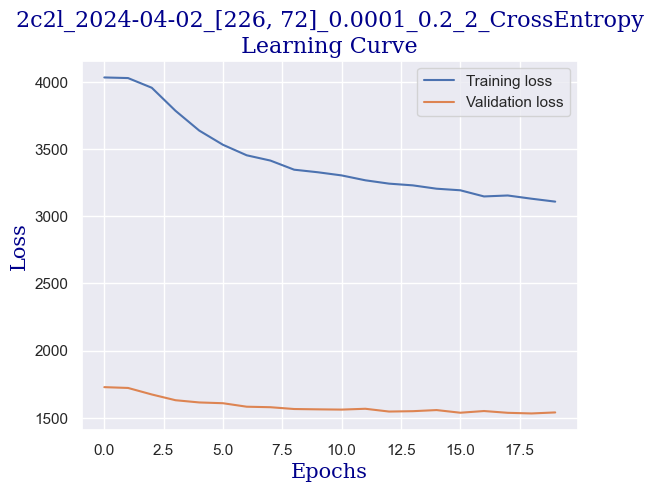

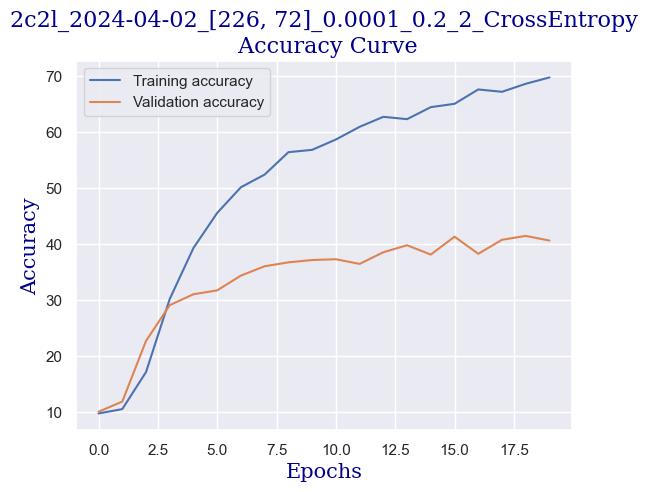

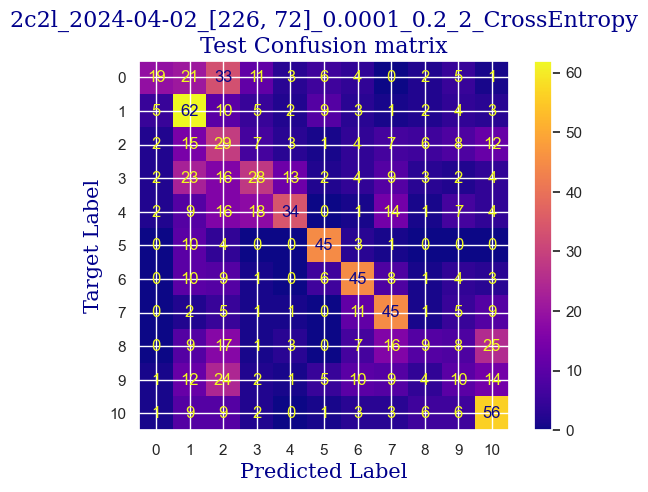

 
 END 2c2l [226, 72] Run Time:  4337.673015617998
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
254857.904425039
254846.57534284602
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.815585960737657
validating...


  5%|██▎                                          | 1/20 [00:12<04:06, 13.00s/it]

validation accuracy:  9.57004160887656
Training...
train accuracy:  10.172516359309935
validating...


 10%|████▌                                        | 2/20 [00:26<03:59, 13.29s/it]

validation accuracy:  11.234396671289876
Training...
train accuracy:  16.597263533610946
validating...


 15%|██████▊                                      | 3/20 [00:39<03:44, 13.21s/it]

validation accuracy:  20.665742024965326
Training...
train accuracy:  26.76977989292088
validating...


 20%|█████████                                    | 4/20 [00:52<03:30, 13.18s/it]

validation accuracy:  27.877947295423024
Training...
train accuracy:  32.3022010707912
validating...


 25%|███████████▎                                 | 5/20 [01:05<03:17, 13.17s/it]

validation accuracy:  31.484049930651874
Training...
train accuracy:  37.83462224866151
validating...


 30%|█████████████▌                               | 6/20 [01:19<03:07, 13.38s/it]

validation accuracy:  34.25797503467407
Training...
train accuracy:  43.48602022605592
validating...


 35%|███████████████▋                             | 7/20 [01:32<02:52, 13.29s/it]

validation accuracy:  36.061026352288486
Training...
train accuracy:  46.936347412254605
validating...


 40%|██████████████████                           | 8/20 [01:45<02:38, 13.24s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  50.148720999405114
validating...


 45%|████████████████████▎                        | 9/20 [01:59<02:25, 13.20s/it]

validation accuracy:  39.80582524271845
Training...
train accuracy:  51.81439619274242
validating...


 50%|██████████████████████                      | 10/20 [02:12<02:12, 13.23s/it]

validation accuracy:  40.6380027739251
Training...
train accuracy:  53.65853658536586
validating...


 55%|████████████████████████▏                   | 11/20 [02:25<01:58, 13.19s/it]

validation accuracy:  40.49930651872399
Training...
train accuracy:  56.87091017251637
validating...


 60%|██████████████████████████▍                 | 12/20 [02:38<01:45, 13.17s/it]

validation accuracy:  41.47018030513176
Training...
train accuracy:  59.54788816180845
validating...


 65%|████████████████████████████▌               | 13/20 [02:51<01:31, 13.14s/it]

validation accuracy:  43.41192787794729
Training...
train accuracy:  59.4883997620464
validating...


 70%|██████████████████████████████▊             | 14/20 [03:04<01:18, 13.15s/it]

validation accuracy:  43.5506241331484
Training...
train accuracy:  61.74895895300416
validating...


 75%|█████████████████████████████████           | 15/20 [03:18<01:05, 13.19s/it]

validation accuracy:  45.63106796116505
Training...
train accuracy:  62.819750148721
validating...


 80%|███████████████████████████████████▏        | 16/20 [03:31<00:52, 13.14s/it]

validation accuracy:  42.57975034674064
Training...
train accuracy:  64.66389054134444
validating...


 85%|█████████████████████████████████████▍      | 17/20 [03:44<00:39, 13.12s/it]

validation accuracy:  43.5506241331484
Training...
train accuracy:  64.78286734086853
validating...


 90%|███████████████████████████████████████▌    | 18/20 [03:57<00:26, 13.06s/it]

validation accuracy:  43.96671289875174
Training...
train accuracy:  69.12552052349793
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [04:10<00:13, 13.23s/it]

validation accuracy:  43.96671289875174
Training...
train accuracy:  70.31528851873885
validating...


100%|████████████████████████████████████████████| 20/20 [04:23<00:00, 13.19s/it]

validation accuracy:  45.49237170596394
Testing...


 
 train acc:  70.31528851873885
 
 val acc:  45.49237170596394
 
 test acc:  45.43689320388349


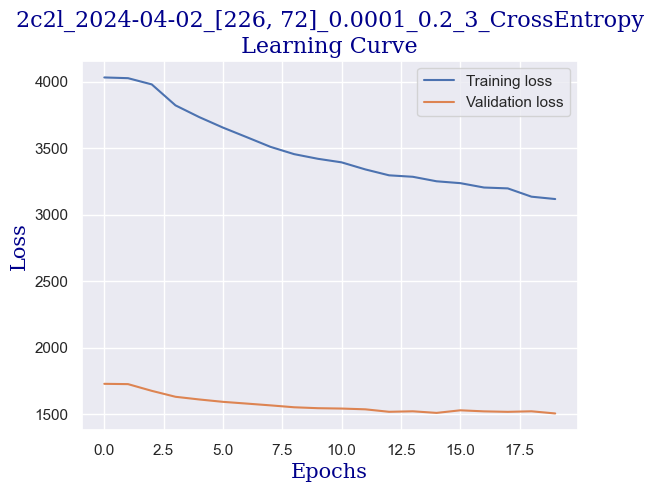

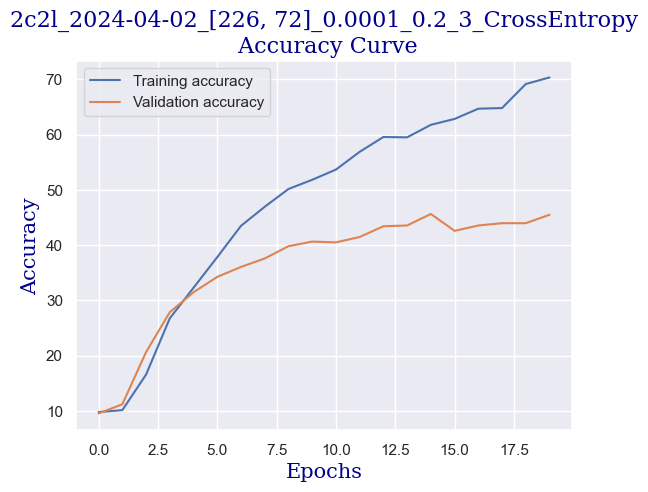

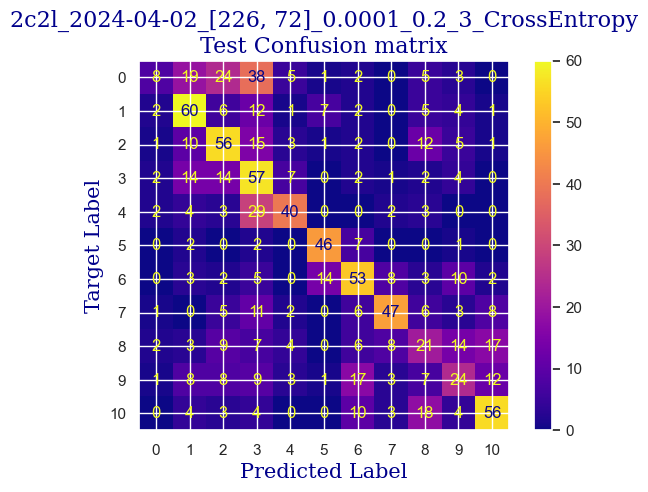

 
 END 2c2l [226, 72] Run Time:  4340.646163821977
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
259198.551734958
259187.222660191
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.280190362879239
validating...


  5%|██▎                                          | 1/20 [00:13<04:10, 13.16s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  10.350981558596075
validating...


 10%|████▌                                        | 2/20 [00:26<04:01, 13.44s/it]

validation accuracy:  9.70873786407767
Training...
train accuracy:  9.994051160023796
validating...


 15%|██████▊                                      | 3/20 [00:39<03:45, 13.26s/it]

validation accuracy:  10.124826629680998
Training...
train accuracy:  12.492563950029744
validating...


 20%|█████████                                    | 4/20 [00:52<03:31, 13.20s/it]

validation accuracy:  15.256588072122051
Training...
train accuracy:  17.19214753123141
validating...


 25%|███████████▎                                 | 5/20 [01:06<03:17, 13.18s/it]

validation accuracy:  19.694868238557557
Training...
train accuracy:  24.033313503866747
validating...


 30%|█████████████▌                               | 6/20 [01:19<03:06, 13.31s/it]

validation accuracy:  23.1622746185853
Training...
train accuracy:  28.61392028554432
validating...


 35%|███████████████▋                             | 7/20 [01:33<02:53, 13.34s/it]

validation accuracy:  24.826629680998614
Training...
train accuracy:  33.55145746579417
validating...


 40%|██████████████████                           | 8/20 [01:46<02:38, 13.24s/it]

validation accuracy:  27.461858529819693
Training...
train accuracy:  37.23973825104105
validating...


 45%|████████████████████▎                        | 9/20 [01:59<02:25, 13.20s/it]

validation accuracy:  28.57142857142857
Training...
train accuracy:  41.2849494348602
validating...


 50%|██████████████████████                      | 10/20 [02:12<02:11, 13.17s/it]

validation accuracy:  32.45492371705964
Training...
train accuracy:  45.98453301606187
validating...


 55%|████████████████████████▏                   | 11/20 [02:25<01:59, 13.33s/it]

validation accuracy:  33.56449375866852
Training...
train accuracy:  48.60202260559191
validating...


 60%|██████████████████████████▍                 | 12/20 [02:39<01:45, 13.24s/it]

validation accuracy:  35.50624133148405
Training...
train accuracy:  49.97025580011898
validating...


 65%|████████████████████████████▌               | 13/20 [02:52<01:32, 13.20s/it]

validation accuracy:  36.89320388349515
Training...
train accuracy:  53.48007138607972
validating...


 70%|██████████████████████████████▊             | 14/20 [03:05<01:18, 13.16s/it]

validation accuracy:  37.447988904299585
Training...
train accuracy:  55.56216537775134
validating...


 75%|█████████████████████████████████           | 15/20 [03:18<01:06, 13.30s/it]

validation accuracy:  37.447988904299585
Training...
train accuracy:  58.17965496728138
validating...


 80%|███████████████████████████████████▏        | 16/20 [03:31<00:52, 13.22s/it]

validation accuracy:  40.49930651872399
Training...
train accuracy:  58.06067816775729
validating...


 85%|█████████████████████████████████████▍      | 17/20 [03:45<00:39, 13.22s/it]

validation accuracy:  40.083217753120664
Training...
train accuracy:  59.42891136228435
validating...


 90%|███████████████████████████████████████▌    | 18/20 [03:58<00:26, 13.16s/it]

validation accuracy:  39.94452149791955
Training...
train accuracy:  60.38072575847709
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [04:11<00:13, 13.25s/it]

validation accuracy:  39.66712898751734
Training...
train accuracy:  62.93872694824509
validating...


100%|████████████████████████████████████████████| 20/20 [04:24<00:00, 13.23s/it]

validation accuracy:  40.6380027739251
Testing...


 
 train acc:  62.93872694824509
 
 val acc:  40.6380027739251
 
 test acc:  35.24271844660194


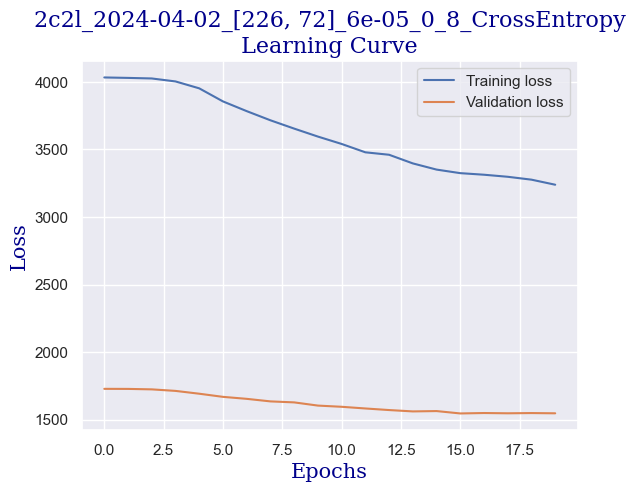

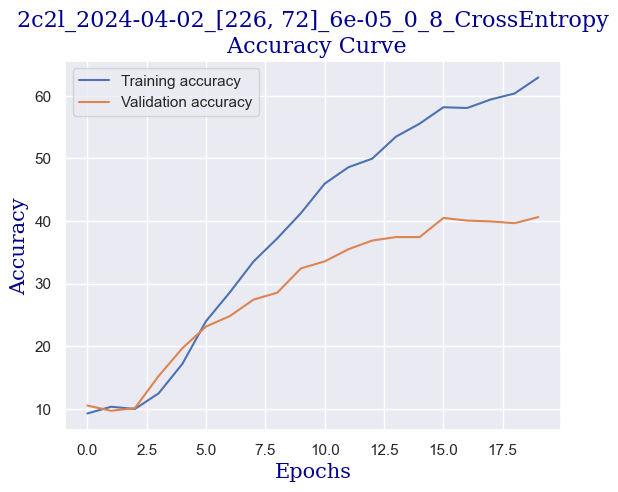

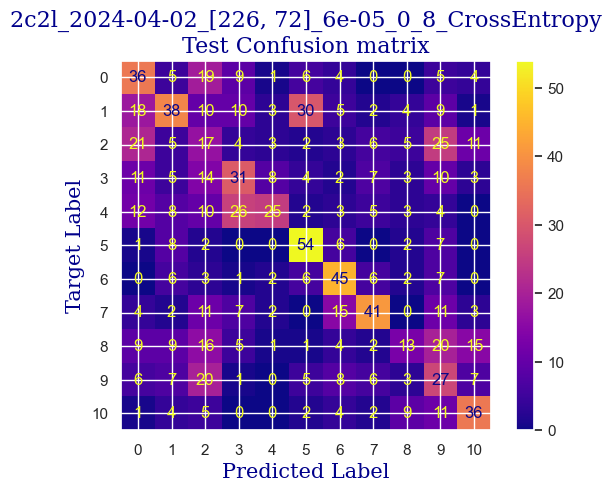

 
 END 2c2l [226, 72] Run Time:  4358.9220945670095
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
263557.475159743
263546.146078183
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.280190362879239
validating...


  5%|██▎                                          | 1/20 [00:13<04:09, 13.12s/it]

validation accuracy:  8.876560332871012
Training...
train accuracy:  10.58893515764426
validating...


 10%|████▌                                        | 2/20 [00:26<03:55, 13.08s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.41046995835812
validating...


 15%|██████▊                                      | 3/20 [00:39<03:45, 13.24s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.172516359309935
validating...


 20%|█████████                                    | 4/20 [00:52<03:31, 13.21s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.648423557406305
validating...


 25%|███████████▎                                 | 5/20 [01:05<03:17, 13.15s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.39916716240333
validating...


 30%|█████████████▌                               | 6/20 [01:19<03:04, 13.21s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.529446757882214
validating...


 35%|███████████████▋                             | 7/20 [01:32<02:52, 13.28s/it]

validation accuracy:  11.373092926490985
Training...
train accuracy:  10.826888756692444
validating...


 40%|██████████████████                           | 8/20 [01:45<02:38, 13.22s/it]

validation accuracy:  9.57004160887656
Training...
train accuracy:  11.89767995240928
validating...


 45%|████████████████████▎                        | 9/20 [01:58<02:24, 13.17s/it]

validation accuracy:  9.43134535367545
Training...
train accuracy:  13.56335514574658
validating...


 50%|██████████████████████                      | 10/20 [02:11<02:11, 13.18s/it]

validation accuracy:  10.263522884882107
Training...
train accuracy:  17.073170731707318
validating...


 55%|████████████████████████▏                   | 11/20 [02:25<01:59, 13.32s/it]

validation accuracy:  15.117891816920942
Training...
train accuracy:  20.99940511600238
validating...


 60%|██████████████████████████▍                 | 12/20 [02:38<01:46, 13.28s/it]

validation accuracy:  19.14008321775312
Training...
train accuracy:  22.903033908387865
validating...


 65%|████████████████████████████▌               | 13/20 [02:51<01:32, 13.22s/it]

validation accuracy:  17.614424410540916
Training...
train accuracy:  23.67638310529447
validating...


 70%|██████████████████████████████▊             | 14/20 [03:04<01:19, 13.17s/it]

validation accuracy:  21.35922330097087
Training...
train accuracy:  26.948245092207017
validating...


 75%|█████████████████████████████████           | 15/20 [03:18<01:06, 13.21s/it]

validation accuracy:  21.220527045769764
Training...
train accuracy:  28.435455086258184
validating...


 80%|███████████████████████████████████▏        | 16/20 [03:31<00:52, 13.20s/it]

validation accuracy:  18.723994452149793
Training...
train accuracy:  28.19750148720999
validating...


 85%|█████████████████████████████████████▍      | 17/20 [03:44<00:39, 13.23s/it]

validation accuracy:  20.943134535367545
Training...
train accuracy:  28.673408685306367
validating...


 90%|███████████████████████████████████████▌    | 18/20 [03:57<00:26, 13.20s/it]

validation accuracy:  19.55617198335645
Training...
train accuracy:  29.803688280785245
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [04:11<00:13, 13.32s/it]

validation accuracy:  21.7753120665742
Training...
train accuracy:  30.279595478881618
validating...


100%|████████████████████████████████████████████| 20/20 [04:24<00:00, 13.23s/it]

validation accuracy:  21.497919556171983
Testing...


 
 train acc:  30.279595478881618
 
 val acc:  21.497919556171983
 
 test acc:  21.650485436893206


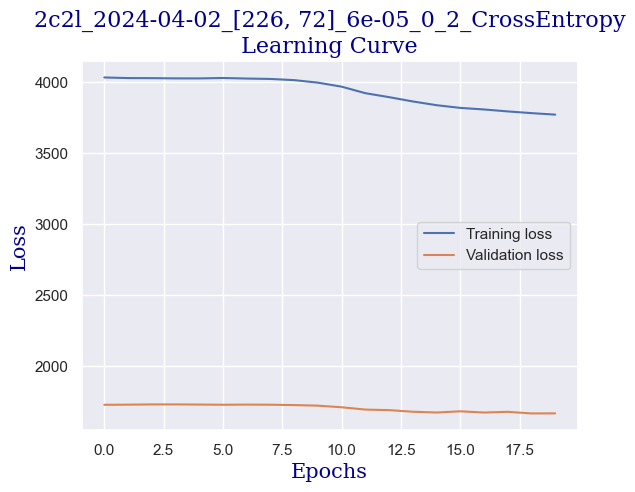

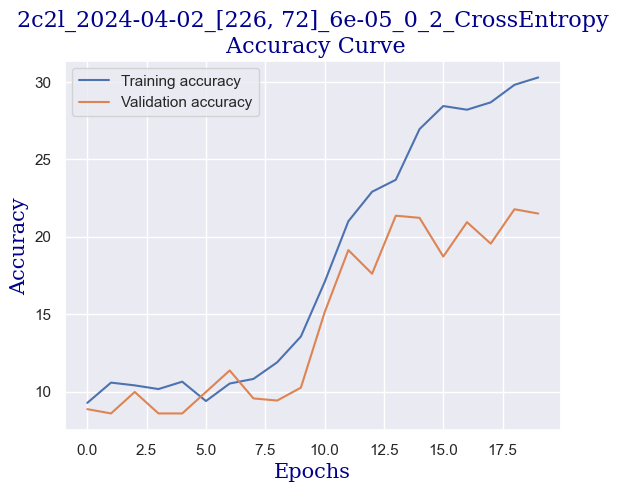

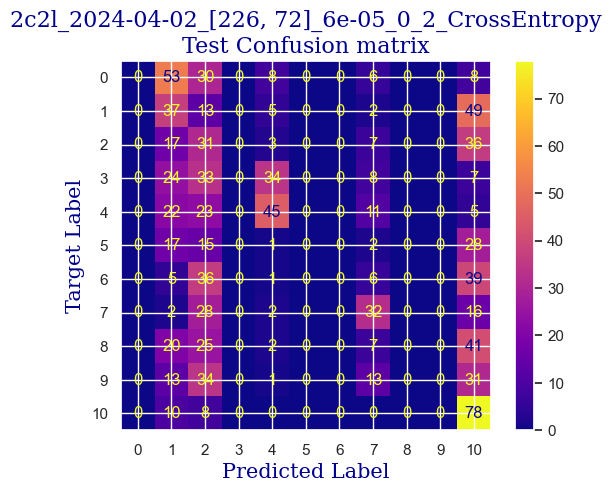

 
 END 2c2l [226, 72] Run Time:  4345.2483153420035
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
267902.724741903
267891.395657411
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  10.350981558596075
validating...


  5%|██▎                                          | 1/20 [00:13<04:10, 13.17s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  10.945865556216537
validating...


 10%|████▌                                        | 2/20 [00:26<03:55, 13.09s/it]

validation accuracy:  8.737864077669903
Training...
train accuracy:  13.741820345032718
validating...


 15%|██████▊                                      | 3/20 [00:39<03:47, 13.38s/it]

validation accuracy:  13.314840499306518
Training...
train accuracy:  20.047590719809637
validating...


 20%|█████████                                    | 4/20 [00:53<03:32, 13.28s/it]

validation accuracy:  19.00138696255201
Training...
train accuracy:  27.78108268887567
validating...


 25%|███████████▎                                 | 5/20 [01:06<03:18, 13.25s/it]

validation accuracy:  21.497919556171983
Training...
train accuracy:  32.064247471743016
validating...


 30%|█████████████▌                               | 6/20 [01:19<03:04, 13.21s/it]

validation accuracy:  25.381414701803052
Training...
train accuracy:  37.83462224866151
validating...


 35%|███████████████▋                             | 7/20 [01:32<02:51, 13.21s/it]

validation accuracy:  30.513176144244103
Training...
train accuracy:  41.99881023200476
validating...


 40%|██████████████████                           | 8/20 [01:45<02:37, 13.14s/it]

validation accuracy:  33.287101248266296
Training...
train accuracy:  46.103509815585966
validating...


 45%|████████████████████▎                        | 9/20 [01:58<02:24, 13.15s/it]

validation accuracy:  33.841886269070734
Training...
train accuracy:  47.828673408685304
validating...


 50%|██████████████████████                      | 10/20 [02:11<02:11, 13.17s/it]

validation accuracy:  34.812760055478506
Training...
train accuracy:  50.86258179654968
validating...


 55%|████████████████████████▏                   | 11/20 [02:25<02:00, 13.41s/it]

validation accuracy:  35.92233009708738
Training...
train accuracy:  51.99286139202856
validating...


 60%|██████████████████████████▍                 | 12/20 [02:39<01:47, 13.38s/it]

validation accuracy:  36.33841886269071
Training...
train accuracy:  54.37239738251041
validating...


 65%|████████████████████████████▌               | 13/20 [02:52<01:33, 13.30s/it]

validation accuracy:  36.061026352288486
Training...
train accuracy:  55.97858417608567
validating...


 70%|██████████████████████████████▊             | 14/20 [03:05<01:19, 13.24s/it]

validation accuracy:  37.17059639389736
Training...
train accuracy:  58.12016656751934
validating...


 75%|█████████████████████████████████           | 15/20 [03:19<01:06, 13.35s/it]

validation accuracy:  37.86407766990291
Training...
train accuracy:  60.202260559190954
validating...


 80%|███████████████████████████████████▏        | 16/20 [03:32<00:53, 13.30s/it]

validation accuracy:  36.89320388349515
Training...
train accuracy:  60.85663295657346
validating...


 85%|█████████████████████████████████████▍      | 17/20 [03:45<00:39, 13.26s/it]

validation accuracy:  39.66712898751734
Training...
train accuracy:  62.40333135038667
validating...


 90%|███████████████████████████████████████▌    | 18/20 [03:58<00:26, 13.20s/it]

validation accuracy:  37.86407766990291
Training...
train accuracy:  62.16537775133849
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [04:11<00:13, 13.30s/it]

validation accuracy:  39.80582524271845
Training...
train accuracy:  64.12849494348603
validating...


100%|████████████████████████████████████████████| 20/20 [04:25<00:00, 13.25s/it]

validation accuracy:  37.7253814147018
Testing...


 
 train acc:  64.12849494348603
 
 val acc:  37.7253814147018
 
 test acc:  38.543689320388346


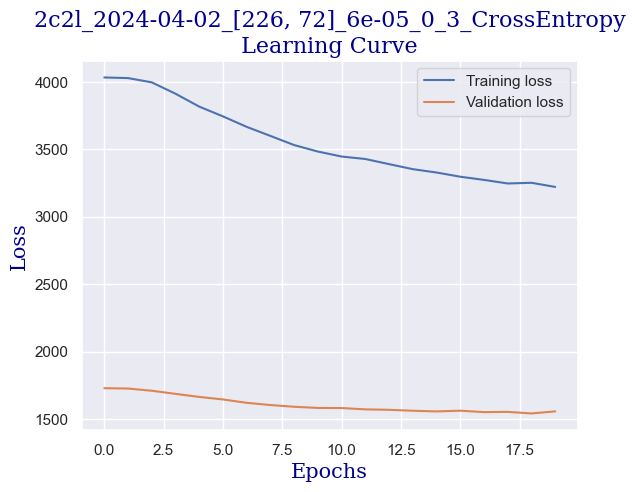

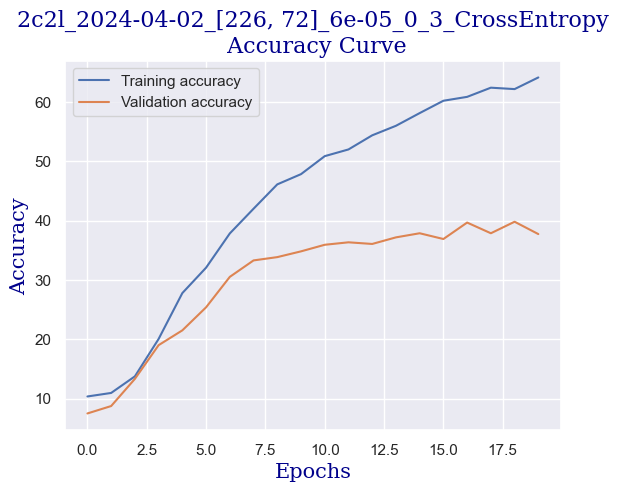

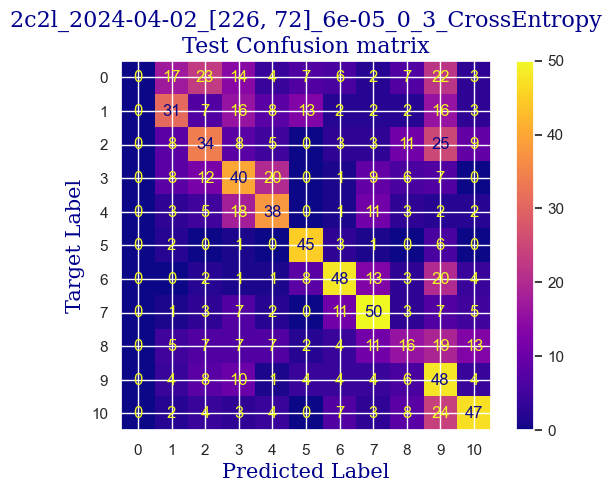

 
 END 2c2l [226, 72] Run Time:  4362.715047970007
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
272265.440650431
272254.111571383
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.863771564544914
validating...


  5%|██▎                                          | 1/20 [00:13<04:08, 13.07s/it]

validation accuracy:  8.460471567267684
Training...
train accuracy:  10.826888756692444
validating...


 10%|████▌                                        | 2/20 [00:26<03:55, 13.10s/it]

validation accuracy:  14.701803051317613
Training...
train accuracy:  15.407495538370016
validating...


 15%|██████▊                                      | 3/20 [00:39<03:47, 13.38s/it]

validation accuracy:  26.352288488210817
Training...
train accuracy:  23.49791790600833
validating...


 20%|█████████                                    | 4/20 [00:53<03:32, 13.28s/it]

validation accuracy:  28.43273231622746
Training...
train accuracy:  28.792385484830458
validating...


 25%|███████████▎                                 | 5/20 [01:06<03:17, 13.18s/it]

validation accuracy:  36.615811373092924
Training...
train accuracy:  34.62224866151101
validating...


 30%|█████████████▌                               | 6/20 [01:19<03:04, 13.18s/it]

validation accuracy:  32.87101248266297
Training...
train accuracy:  39.38132064247471
validating...


 35%|███████████████▋                             | 7/20 [01:32<02:51, 13.21s/it]

validation accuracy:  39.389736477115115
Training...
train accuracy:  42.117787031528856
validating...


 40%|██████████████████                           | 8/20 [01:45<02:38, 13.22s/it]

validation accuracy:  39.1123439667129
Training...
train accuracy:  45.27067221891731
validating...


 45%|████████████████████▎                        | 9/20 [01:58<02:24, 13.13s/it]

validation accuracy:  40.6380027739251
Training...
train accuracy:  47.47174301011302
validating...


 50%|██████████████████████                      | 10/20 [02:11<02:11, 13.14s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  50.26769779892921
validating...


 55%|████████████████████████▏                   | 11/20 [02:25<01:59, 13.27s/it]

validation accuracy:  39.80582524271845
Training...
train accuracy:  51.576442593694225
validating...


 60%|██████████████████████████▍                 | 12/20 [02:38<01:45, 13.22s/it]

validation accuracy:  39.528432732316226
Training...
train accuracy:  52.29030339083879
validating...


 65%|████████████████████████████▌               | 13/20 [02:51<01:32, 13.17s/it]

validation accuracy:  39.528432732316226
Training...
train accuracy:  54.19393218322427
validating...


 70%|██████████████████████████████▊             | 14/20 [03:04<01:18, 13.11s/it]

validation accuracy:  35.22884882108183
Training...
train accuracy:  54.6103509815586
validating...


 75%|█████████████████████████████████           | 15/20 [03:18<01:06, 13.26s/it]

validation accuracy:  41.47018030513176
Training...
train accuracy:  56.2760261748959
validating...


 80%|███████████████████████████████████▏        | 16/20 [03:31<00:52, 13.24s/it]

validation accuracy:  39.1123439667129
Training...
train accuracy:  58.06067816775729
validating...


 85%|█████████████████████████████████████▍      | 17/20 [03:44<00:39, 13.18s/it]

validation accuracy:  39.66712898751734
Training...
train accuracy:  57.52528256989887
validating...


 90%|███████████████████████████████████████▌    | 18/20 [03:57<00:26, 13.16s/it]

validation accuracy:  40.77669902912621
Training...
train accuracy:  59.250446162998216
validating...


 95%|█████████████████████████████████████████▊  | 19/20 [04:11<00:13, 13.27s/it]

validation accuracy:  41.05409153952843
Training...
train accuracy:  59.84533016061868
validating...


100%|████████████████████████████████████████████| 20/20 [04:24<00:00, 13.21s/it]

validation accuracy:  42.71844660194174
Testing...


 
 train acc:  59.84533016061868
 
 val acc:  42.71844660194174
 
 test acc:  39.029126213592235


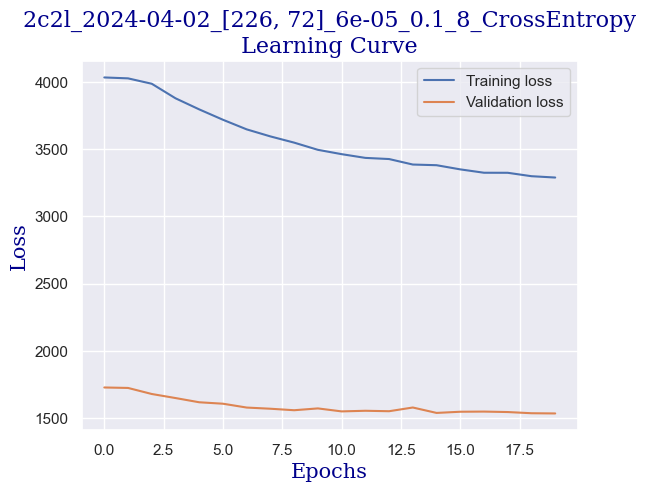

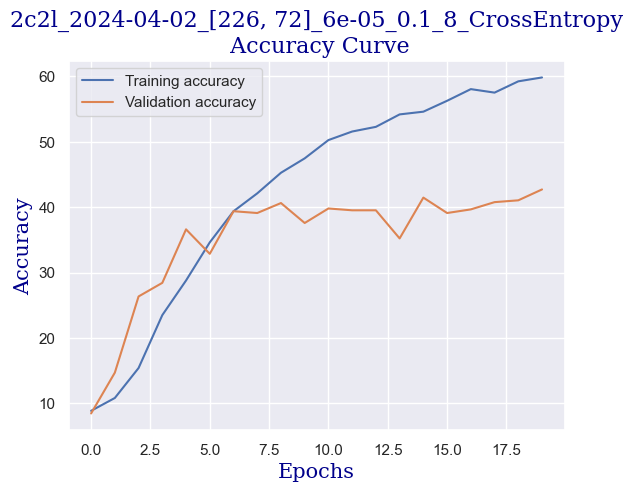

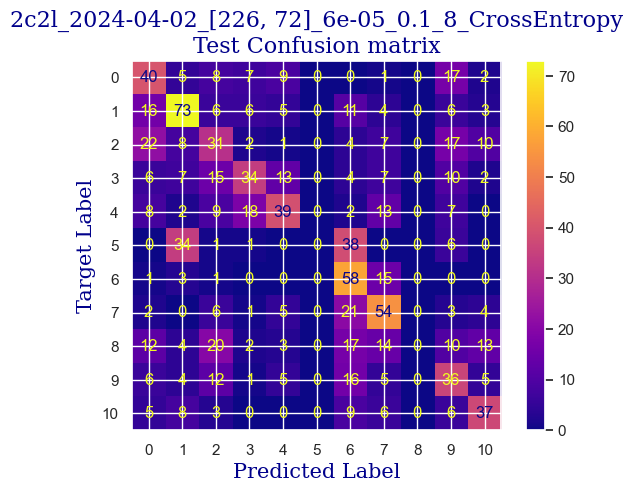

 
 END 2c2l [226, 72] Run Time:  4353.033947477001
Model:  2c2l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
276618.475641613
276607.146565027
Total epochs: 20


  0%|                                                     | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  10.469958358120167
validating...


  5%|██▎                                          | 1/20 [00:13<04:10, 13.17s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.826888756692444
validating...


 10%|████▌                                        | 2/20 [00:26<03:56, 13.15s/it]

validation accuracy:  11.927877947295423
Training...
train accuracy:  16.061867935752527
validating...


 15%|██████▊                                      | 3/20 [00:39<03:45, 13.24s/it]

validation accuracy:  19.972260748959776
Training...
train accuracy:  24.33075550267698
validating...


 20%|█████████                                    | 4/20 [00:52<03:31, 13.19s/it]

validation accuracy:  28.155339805825243
Training...
train accuracy:  30.87447947650208
validating...


 25%|███████████▎                                 | 5/20 [01:05<03:17, 13.13s/it]

validation accuracy:  28.57142857142857
Training...
train accuracy:  34.027364663890545
validating...


 30%|█████████████▌                               | 6/20 [01:18<03:03, 13.12s/it]

validation accuracy:  29.819694868238557
Training...
train accuracy:  37.23973825104105
validating...


 35%|███████████████▋                             | 7/20 [01:32<02:52, 13.31s/it]

validation accuracy:  30.374479889042995
Training...
train accuracy:  38.54848304580607
validating...


 40%|██████████████████                           | 8/20 [01:45<02:38, 13.21s/it]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [10]:
_go(config)